In [1]:
import os
import VGG_help
from VGG_help import prepare_dataset, test_on_data, plot_train_history, plot_confusion_matrix
# from VGG_help import vgg_model, resnet_model, swin_transformer_model, cv_train_model, cv_train_vgg_model
from VGG_help import vgg_model, resnet_model, cv_train_and_evaluate_model, train_and_evaluate_model, cv_train_model, cv_train_vgg_model, imbalanced_cv_train_and_evaluate_model


from tensorflow.keras.models import load_model

2024-09-10 14:01:38.488569: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-09-10 14:01:40.207610: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-10 14:01:40.207679: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-10 14:01:40.209696: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-09-10 14:01:40.996942: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-09-10 14:01:40.998591: I tensorflow/core/platform/cpu_feature_guard.cc:182] This Tens

In [2]:
# !'/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/bin/python' -m pip install tensorflow_addons
# !'/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/bin/python' -m pip install tensorflow==2.12


In [3]:
VGG_help.sns.set_theme()
path_dir = VGG_help.os.getcwd()
VGG_help.np.random.seed(123)
VGG_help.tf.random.set_seed(123)


# Train on Selected Data

In [4]:
dataset_dir_org = f'{path_dir}/Imbalanced_Data/Selected_Images/Original_selected'
dataset_dir_ddpm = f'{path_dir}/Imbalanced_Data/Selected_Images/DDPM'
dataset_dir_pggans150 = f'{path_dir}/Imbalanced_Data/Selected_Images/PGGANS150'
dataset_dir_pggans160 = f'{path_dir}/Imbalanced_Data/Selected_Images/PGGANS160'
test_dataset_dir = f'{path_dir}/Imbalanced_Data/Selected_Images/Test_selected_imbalanced'
test_dataset_dir1 = f'{path_dir}/Imbalanced_Data/Selected_Images/Test/dataset_1'
test_dataset_dir2 = f'{path_dir}/Imbalanced_Data/Selected_Images/Test/dataset_2'
test_dataset_dir3 = f'{path_dir}/Imbalanced_Data/Selected_Images/Test/dataset_3'


class_labels = sorted(os.listdir(dataset_dir_org))
print('class_labels: ', class_labels)
num_classes = 2
input_shape=(128, 128, 3)

cv=1
epochs=10
batch_size=32

class_labels:  ['NORMAL', 'PNEUMONIA']


## VGG16

### CV=1

#### Train on Original Dataset

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
43/43 [==============================] - 13s 297ms/step - loss: 0.5598 - accuracy: 0.8478 - val_loss: 0.3063 - val_accuracy: 0.8824
Epoch 2/10
43/43 [==============================] - 12s 288ms/step - loss: 0.2997 - accuracy: 0.8853 - val_loss: 0.2913 - val_accuracy: 0.8824
Epoch 3/10
43/43 [==============================] - 12s 285ms/step - loss: 0.2908 - accuracy: 0.8875 - val_loss: 0.2568 - val_accuracy: 0.8882
Epoch 4/10
43/43 [==============================] - 12s 288ms/step - loss: 0.2754 - accuracy: 0.8978 - val_loss: 0.2679 - val_accuracy: 0.8882
Epoch 5/10
43/43 [==============================] - 12s 289ms/step - loss: 0.2627 - accuracy: 0.9059 - val_loss: 0.2329 - val_accuracy: 0.9118
Epoch 6/10
43/43 [==============================] - 12s 288ms/step - loss: 0.2257 - accuracy: 0.9140 - val_loss: 0.2179 - val_accuracy: 0.9118
Epoch 7/10
43/43 [==============================] - 12s 289ms/step - loss: 0.1993 - accuracy: 0.9294 - v

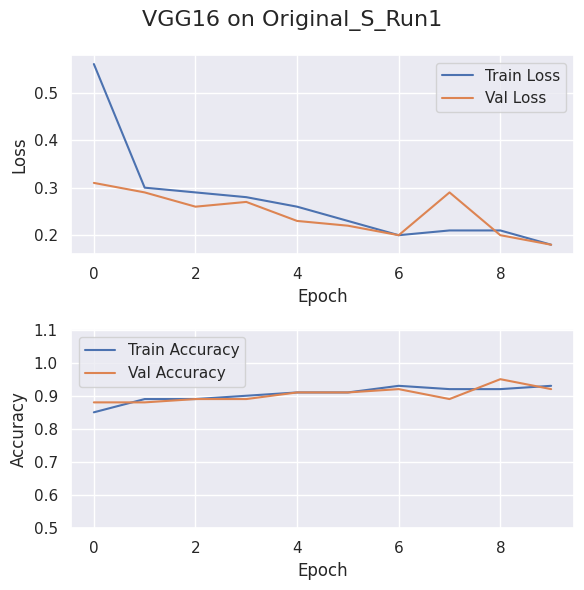

Testing on Dataset 1
13/13 [==============================] - 3s 207ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2535, 'Test Accuracy': 0.8856, 'F1 Score': 0.87, 'Sensitivity (Recall)': 0.89, 'Precision': 0.9}


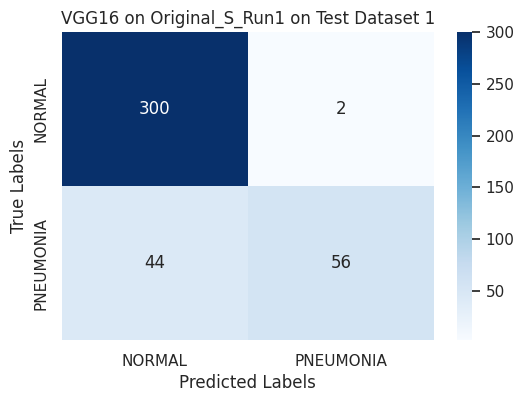

Testing on Dataset 2
13/13 [==============================] - 3s 208ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.2434, 'Test Accuracy': 0.898, 'F1 Score': 0.89, 'Sensitivity (Recall)': 0.9, 'Precision': 0.91}


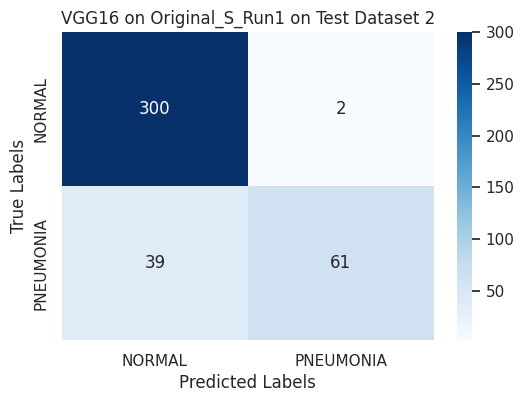

Testing on Dataset 3
13/13 [==============================] - 3s 205ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.2375, 'Test Accuracy': 0.8905, 'F1 Score': 0.88, 'Sensitivity (Recall)': 0.89, 'Precision': 0.9}


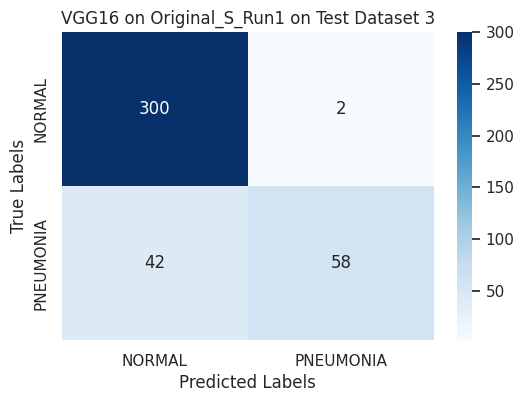

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
43/43 [==============================] - 13s 284ms/step - loss: 0.8174 - accuracy: 0.8404 - val_loss: 0.3382 - val_accuracy: 0.8824
Epoch 2/10
43/43 [==============================] - 12s 281ms/step - loss: 0.3151 - accuracy: 0.8824 - val_loss: 0.2893 - val_accuracy: 0.8824
Epoch 3/10
43/43 [==============================] - 12s 279ms/step - loss: 0.2915 - accuracy: 0.8831 - val_loss: 0.2600 - val_accuracy: 0.8824
Epoch 4/10
43/43 [==============================] - 12s 278ms/step - loss: 0.2740 - accuracy: 0.8919 - val_loss: 0.2569 - val_accuracy: 0.8824
Epoch 5/10
43/43 [==============================] - 12s 277ms/step - loss: 0.2567 - accuracy: 0.8934 - val_loss: 0.2327 - val_accuracy: 0.9000
Epoch 6/10
43/43 [==============================] - 12s 278ms/step - loss: 0.2297 - accuracy: 0.9051 - val_loss: 0.2253 - val_accuracy: 0.9000
Epoch 7/10
43/43 [==============================] - 12s 279ms/step - loss: 0.2169 - accuracy: 0.9132 - v

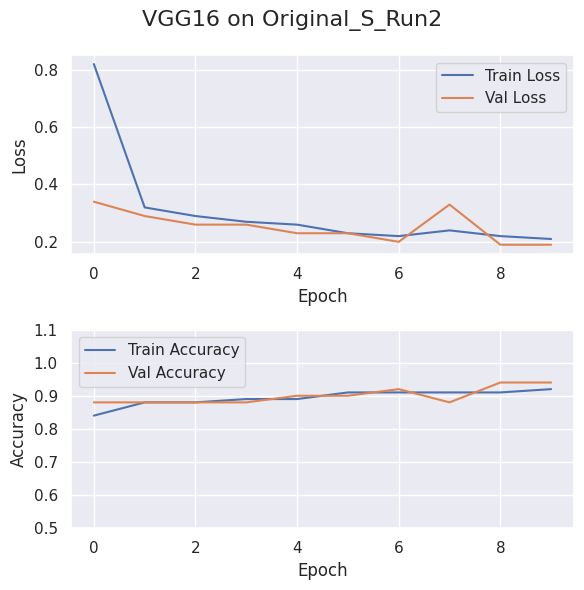

Testing on Dataset 1
13/13 [==============================] - 3s 206ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.287, 'Test Accuracy': 0.8557, 'F1 Score': 0.83, 'Sensitivity (Recall)': 0.86, 'Precision': 0.87}


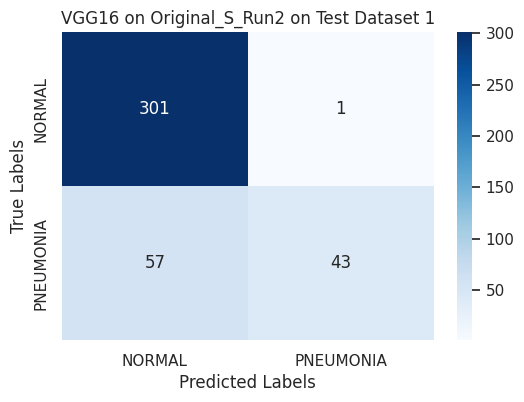

Testing on Dataset 2
13/13 [==============================] - 3s 210ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.277, 'Test Accuracy': 0.8632, 'F1 Score': 0.84, 'Sensitivity (Recall)': 0.86, 'Precision': 0.88}


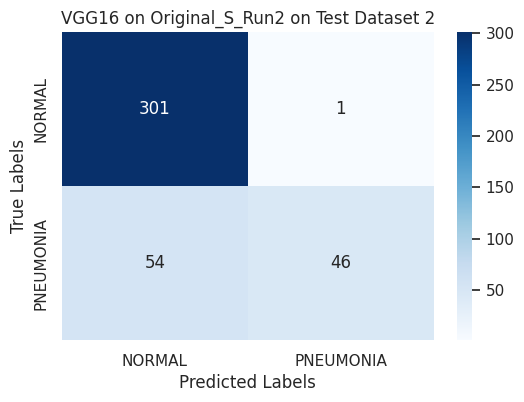

Testing on Dataset 3
13/13 [==============================] - 3s 205ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.2694, 'Test Accuracy': 0.8582, 'F1 Score': 0.84, 'Sensitivity (Recall)': 0.86, 'Precision': 0.88}


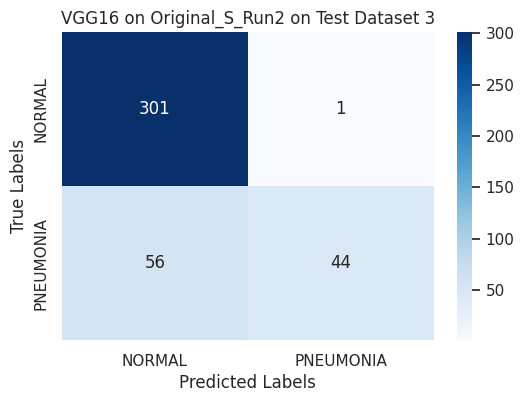

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
43/43 [==============================] - 13s 282ms/step - loss: 0.5650 - accuracy: 0.8515 - val_loss: 0.3200 - val_accuracy: 0.8824
Epoch 2/10
43/43 [==============================] - 12s 279ms/step - loss: 0.3137 - accuracy: 0.8824 - val_loss: 0.2914 - val_accuracy: 0.8824
Epoch 3/10
43/43 [==============================] - 12s 277ms/step - loss: 0.2995 - accuracy: 0.8824 - val_loss: 0.2634 - val_accuracy: 0.8824
Epoch 4/10
43/43 [==============================] - 12s 275ms/step - loss: 0.2773 - accuracy: 0.8941 - val_loss: 0.2542 - val_accuracy: 0.8824
Epoch 5/10
43/43 [==============================] - 12s 274ms/step - loss: 0.2580 - accuracy: 0.8963 - val_loss: 0.2458 - val_accuracy: 0.9176
Epoch 6/10
43/43 [==============================] - 12s 275ms/step - loss: 0.2276 - accuracy: 0.9110 - val_loss: 0.2149 - val_accuracy: 0.9029
Epoch 7/10
43/43 [==============================] - 12s 277ms/step - loss: 0.2156 - accuracy: 0.9140 - v

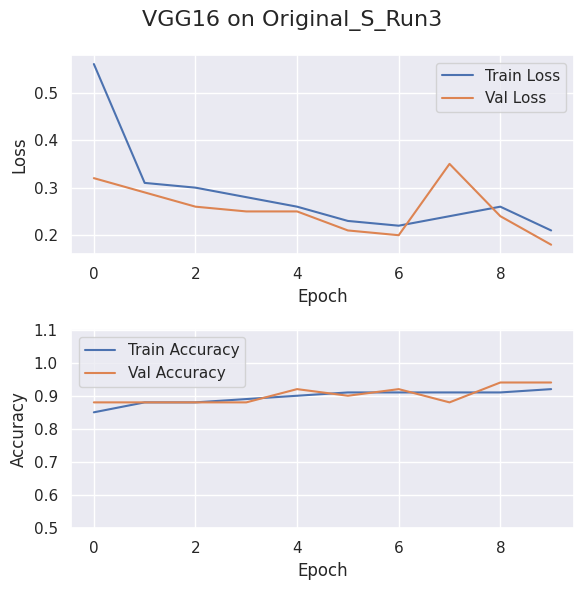

Testing on Dataset 1
13/13 [==============================] - 3s 205ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.25, 'Test Accuracy': 0.9005, 'F1 Score': 0.9, 'Sensitivity (Recall)': 0.9, 'Precision': 0.9}


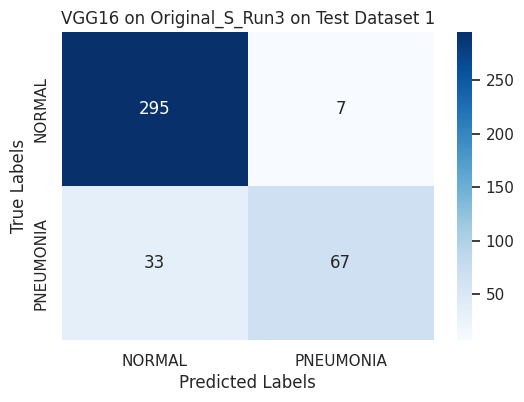

Testing on Dataset 2
13/13 [==============================] - 3s 207ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.24, 'Test Accuracy': 0.908, 'F1 Score': 0.9, 'Sensitivity (Recall)': 0.91, 'Precision': 0.91}


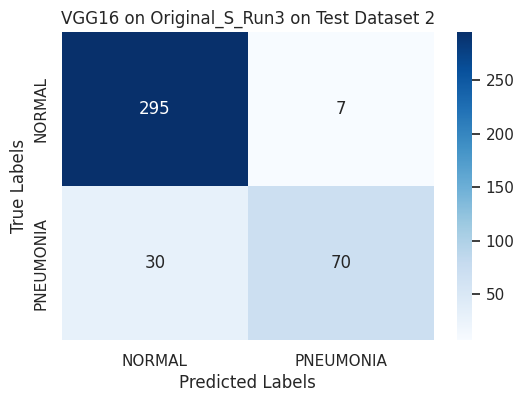

Testing on Dataset 3
13/13 [==============================] - 3s 205ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.2356, 'Test Accuracy': 0.9005, 'F1 Score': 0.9, 'Sensitivity (Recall)': 0.9, 'Precision': 0.9}


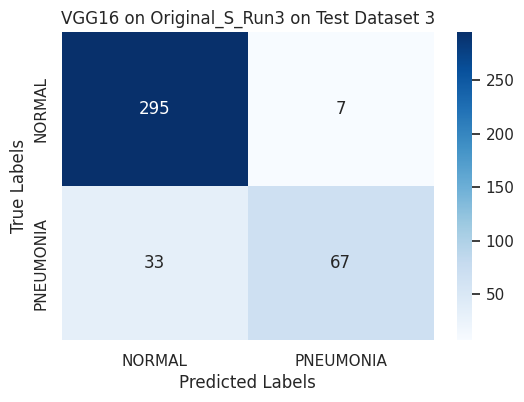

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
43/43 [==============================] - 13s 284ms/step - loss: 0.6108 - accuracy: 0.8507 - val_loss: 0.3219 - val_accuracy: 0.8824
Epoch 2/10
43/43 [==============================] - 12s 279ms/step - loss: 0.3160 - accuracy: 0.8846 - val_loss: 0.2999 - val_accuracy: 0.8824
Epoch 3/10
43/43 [==============================] - 12s 275ms/step - loss: 0.3098 - accuracy: 0.8860 - val_loss: 0.2765 - val_accuracy: 0.8824
Epoch 4/10
43/43 [==============================] - 12s 277ms/step - loss: 0.2825 - accuracy: 0.8868 - val_loss: 0.2700 - val_accuracy: 0.8824
Epoch 5/10
43/43 [==============================] - 12s 276ms/step - loss: 0.2759 - accuracy: 0.8934 - val_loss: 0.2491 - val_accuracy: 0.8941
Epoch 6/10
43/43 [==============================] - 12s 277ms/step - loss: 0.2509 - accuracy: 0.8985 - val_loss: 0.2400 - val_accuracy: 0.8912
Epoch 7/10
43/43 [==============================] - 12s 278ms/step - loss: 0.2328 - accuracy: 0.9110 - v

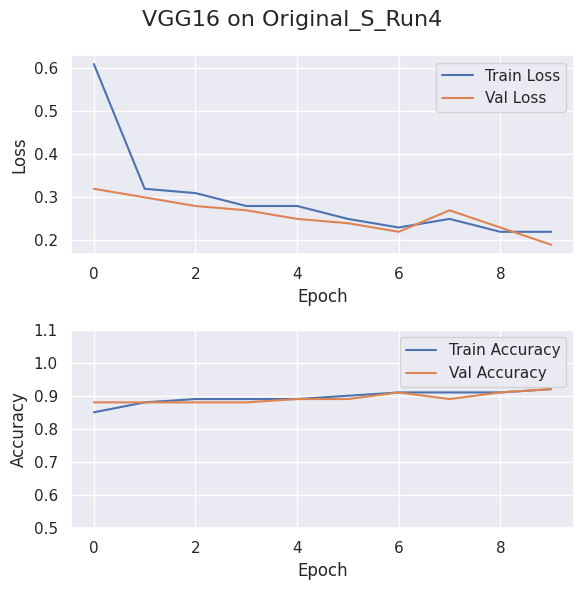

Testing on Dataset 1
13/13 [==============================] - 3s 206ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.3035, 'Test Accuracy': 0.8483, 'F1 Score': 0.82, 'Sensitivity (Recall)': 0.85, 'Precision': 0.87}


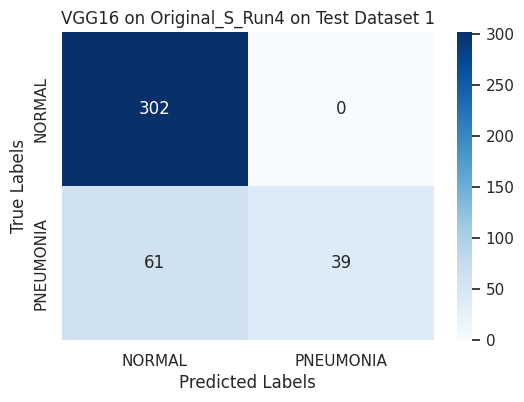

Testing on Dataset 2
13/13 [==============================] - 3s 209ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.2784, 'Test Accuracy': 0.8582, 'F1 Score': 0.84, 'Sensitivity (Recall)': 0.86, 'Precision': 0.88}


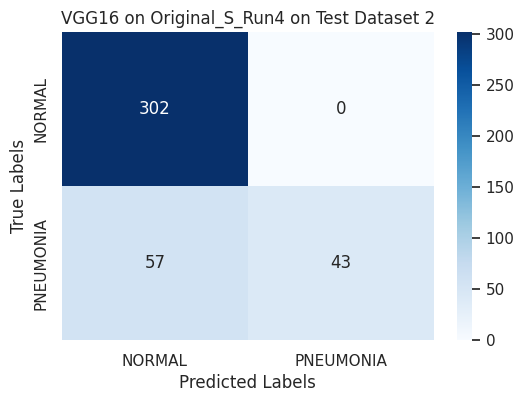

Testing on Dataset 3
13/13 [==============================] - 3s 205ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.2951, 'Test Accuracy': 0.8458, 'F1 Score': 0.82, 'Sensitivity (Recall)': 0.85, 'Precision': 0.87}


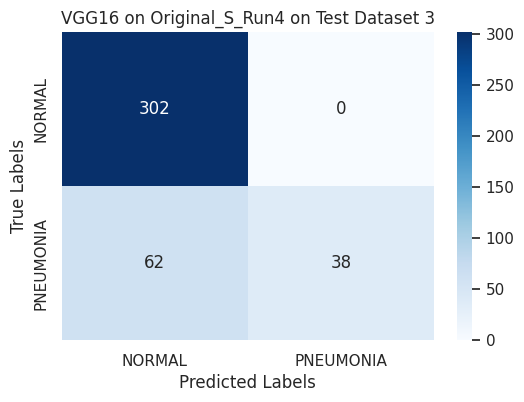

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
43/43 [==============================] - 13s 280ms/step - loss: 0.7797 - accuracy: 0.8250 - val_loss: 0.3519 - val_accuracy: 0.8824
Epoch 2/10
43/43 [==============================] - 12s 274ms/step - loss: 0.3228 - accuracy: 0.8853 - val_loss: 0.3022 - val_accuracy: 0.8824
Epoch 3/10
43/43 [==============================] - 12s 274ms/step - loss: 0.3041 - accuracy: 0.8912 - val_loss: 0.2808 - val_accuracy: 0.8824
Epoch 4/10
43/43 [==============================] - 12s 273ms/step - loss: 0.3093 - accuracy: 0.8860 - val_loss: 0.2907 - val_accuracy: 0.8824
Epoch 5/10
43/43 [==============================] - 12s 273ms/step - loss: 0.2919 - accuracy: 0.8868 - val_loss: 0.2676 - val_accuracy: 0.8882
Epoch 6/10
43/43 [==============================] - 12s 272ms/step - loss: 0.2600 - accuracy: 0.8919 - val_loss: 0.2520 - val_accuracy: 0.8912
Epoch 7/10
43/43 [==============================] - 12s 275ms/step - loss: 0.2496 - accuracy: 0.9029 - v

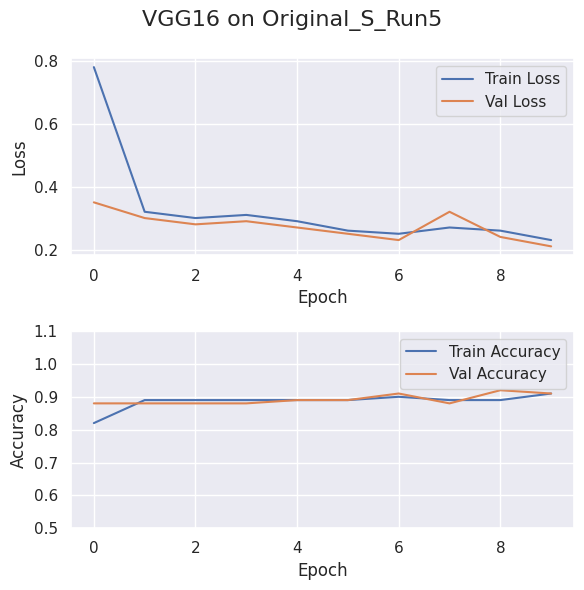

Testing on Dataset 1
13/13 [==============================] - 3s 204ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.3237, 'Test Accuracy': 0.8134, 'F1 Score': 0.77, 'Sensitivity (Recall)': 0.81, 'Precision': 0.84}


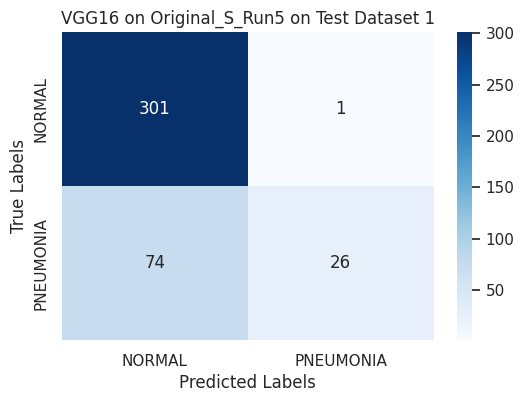

Testing on Dataset 2
13/13 [==============================] - 3s 206ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.3042, 'Test Accuracy': 0.8507, 'F1 Score': 0.83, 'Sensitivity (Recall)': 0.85, 'Precision': 0.87}


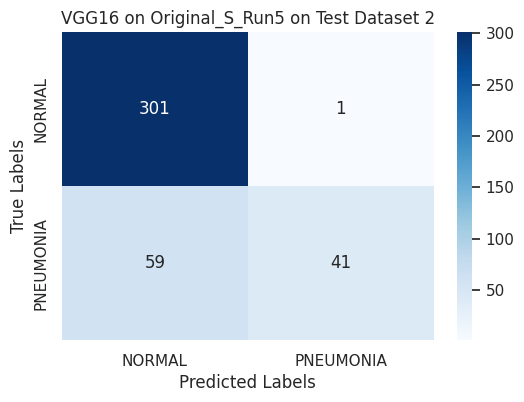

Testing on Dataset 3
13/13 [==============================] - 3s 207ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.3081, 'Test Accuracy': 0.8383, 'F1 Score': 0.81, 'Sensitivity (Recall)': 0.84, 'Precision': 0.86}


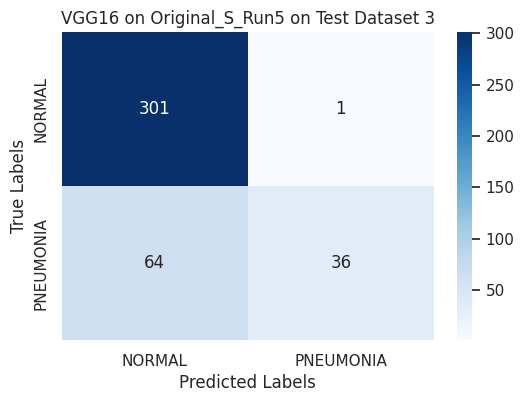

In [7]:
   
title = "VGG16 on Original_S"
file_name = "Trained_Models/training_history_plot_original_S.png"

for i in range(0, 5):
    trained_model, test_metrics, confusion_matrix = imbalanced_cv_train_and_evaluate_model(
        dataset_dir_org, 
        test_dataset_dir1, 
        test_dataset_dir2, 
        test_dataset_dir3, 
        class_labels,  
        vgg_model,
        weights=None,
        input_shape= input_shape, 
        title=f"{title}_Run{i+1}", 
        file_name=file_name,  # Now treated as a keyword argument
        cv=cv, 
        epochs=epochs, 
        batch_size=batch_size       
    )

#### Train on Mixed DDPM Dataset

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 27s 280ms/step - loss: 0.5195 - accuracy: 0.7818 - val_loss: 0.2560 - val_accuracy: 0.9203
Epoch 2/10
93/93 [==============================] - 25s 274ms/step - loss: 0.2315 - accuracy: 0.9159 - val_loss: 0.2018 - val_accuracy: 0.9203
Epoch 3/10
93/93 [==============================] - 26s 275ms/step - loss: 0.1731 - accuracy: 0.9304 - val_loss: 0.1499 - val_accuracy: 0.9432
Epoch 4/10
93/93 [==============================] - 25s 274ms/step - loss: 0.1535 - accuracy: 0.9426 - val_loss: 0.1221 - val_accuracy: 0.9473
Epoch 5/10
93/93 [==============================] - 25s 274ms/step - loss: 0.1371 - accuracy: 0.9534 - val_loss: 0.1130 - val_accuracy: 0.9568
Epoch 6/10
93/93 [==============================] - 25s 274ms/step - loss: 0.1515 - accuracy: 0.9500 - val_loss: 0.1174 - val_accuracy: 0.9568
Epoch 7/10
93/93 [==============================] - 25s 274ms/step - loss: 0.1231 - accuracy: 0.9611 - v

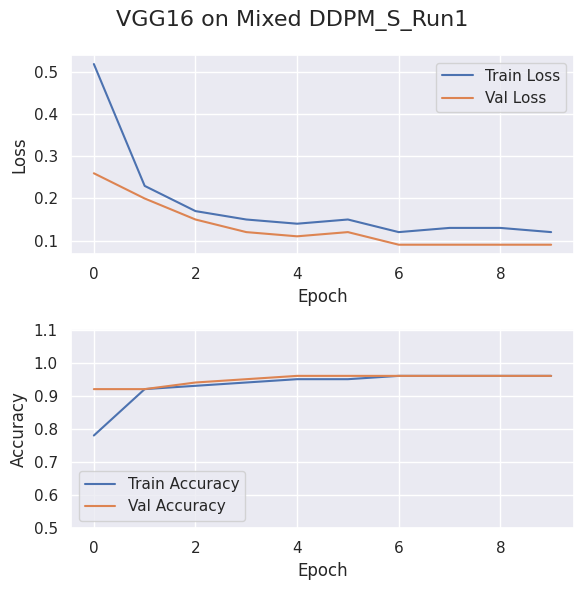

Testing on Dataset 1
13/13 [==============================] - 3s 209ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2088, 'Test Accuracy': 0.9104, 'F1 Score': 0.91, 'Sensitivity (Recall)': 0.91, 'Precision': 0.91}


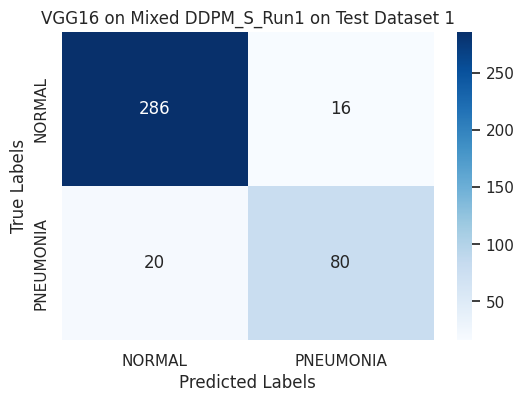

Testing on Dataset 2
13/13 [==============================] - 3s 206ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.1744, 'Test Accuracy': 0.9328, 'F1 Score': 0.93, 'Sensitivity (Recall)': 0.93, 'Precision': 0.93}


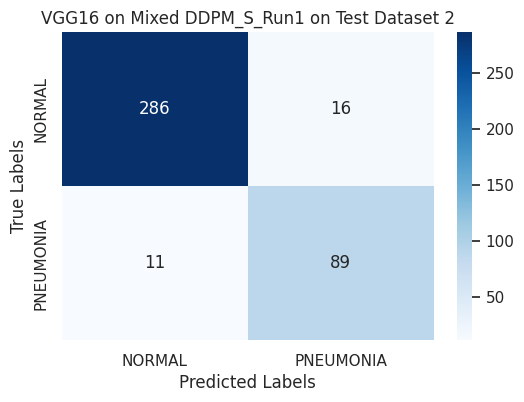

Testing on Dataset 3
13/13 [==============================] - 3s 207ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.1739, 'Test Accuracy': 0.9204, 'F1 Score': 0.92, 'Sensitivity (Recall)': 0.92, 'Precision': 0.92}


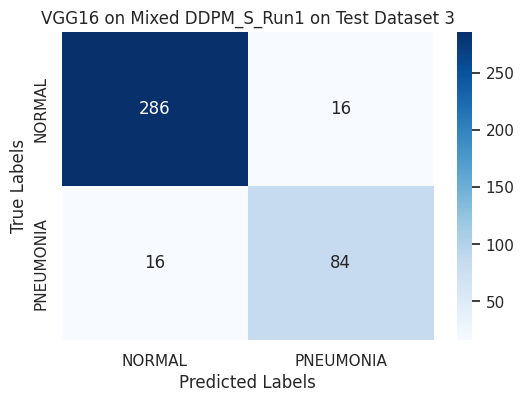

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 27s 279ms/step - loss: 0.4710 - accuracy: 0.8091 - val_loss: 0.1970 - val_accuracy: 0.9473
Epoch 2/10
93/93 [==============================] - 25s 275ms/step - loss: 0.1932 - accuracy: 0.9324 - val_loss: 0.1362 - val_accuracy: 0.9554
Epoch 3/10
93/93 [==============================] - 25s 274ms/step - loss: 0.1582 - accuracy: 0.9453 - val_loss: 0.1203 - val_accuracy: 0.9514
Epoch 4/10
93/93 [==============================] - 25s 275ms/step - loss: 0.1304 - accuracy: 0.9571 - val_loss: 0.0955 - val_accuracy: 0.9595
Epoch 5/10
93/93 [==============================] - 25s 275ms/step - loss: 0.1189 - accuracy: 0.9608 - val_loss: 0.1153 - val_accuracy: 0.9527
Epoch 6/10
93/93 [==============================] - 26s 275ms/step - loss: 0.1256 - accuracy: 0.9591 - val_loss: 0.1226 - val_accuracy: 0.9514
Epoch 7/10
93/93 [==============================] - 25s 274ms/step - loss: 0.1217 - accuracy: 0.9584 - v

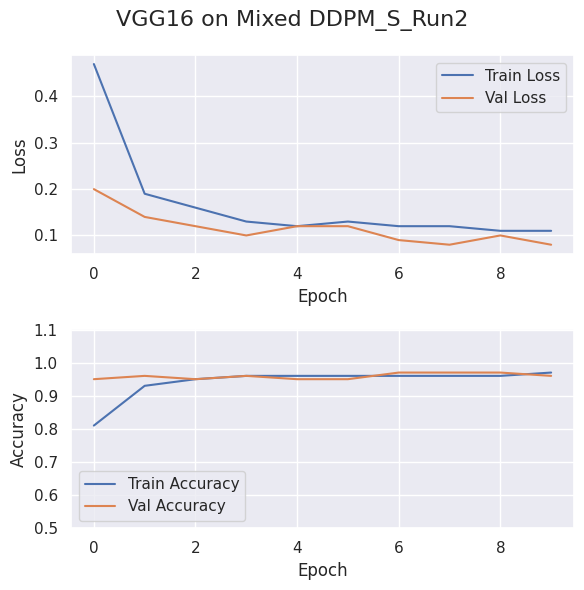

Testing on Dataset 1
13/13 [==============================] - 3s 208ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2178, 'Test Accuracy': 0.9204, 'F1 Score': 0.92, 'Sensitivity (Recall)': 0.92, 'Precision': 0.92}


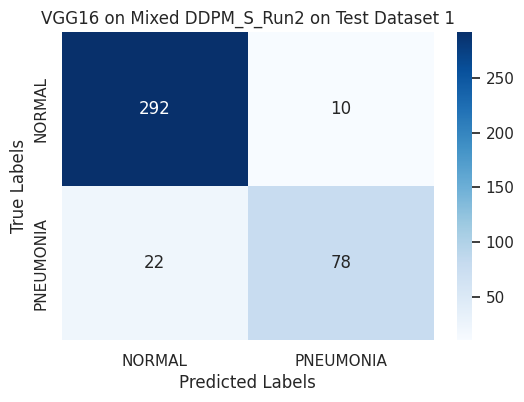

Testing on Dataset 2
13/13 [==============================] - 3s 208ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.1792, 'Test Accuracy': 0.9303, 'F1 Score': 0.93, 'Sensitivity (Recall)': 0.93, 'Precision': 0.93}


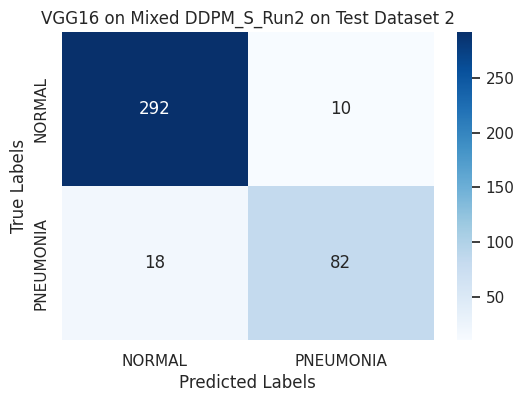

Testing on Dataset 3
13/13 [==============================] - 3s 207ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.1611, 'Test Accuracy': 0.9478, 'F1 Score': 0.95, 'Sensitivity (Recall)': 0.95, 'Precision': 0.95}


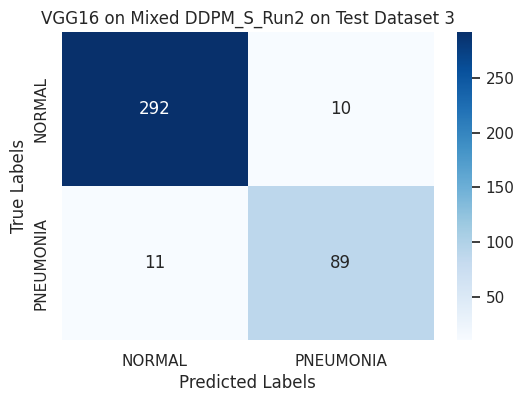

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 26s 277ms/step - loss: 0.6010 - accuracy: 0.7568 - val_loss: 0.2755 - val_accuracy: 0.8959
Epoch 2/10
93/93 [==============================] - 25s 274ms/step - loss: 0.2587 - accuracy: 0.8986 - val_loss: 0.1908 - val_accuracy: 0.9324
Epoch 3/10
93/93 [==============================] - 26s 275ms/step - loss: 0.2235 - accuracy: 0.9145 - val_loss: 0.2128 - val_accuracy: 0.9149
Epoch 4/10
93/93 [==============================] - 26s 275ms/step - loss: 0.2032 - accuracy: 0.9226 - val_loss: 0.1411 - val_accuracy: 0.9514
Epoch 5/10
93/93 [==============================] - 25s 274ms/step - loss: 0.1894 - accuracy: 0.9291 - val_loss: 0.1309 - val_accuracy: 0.9554
Epoch 6/10
93/93 [==============================] - 26s 279ms/step - loss: 0.1583 - accuracy: 0.9402 - val_loss: 0.1144 - val_accuracy: 0.9541
Epoch 7/10
93/93 [==============================] - 26s 280ms/step - loss: 0.1580 - accuracy: 0.9432 - v

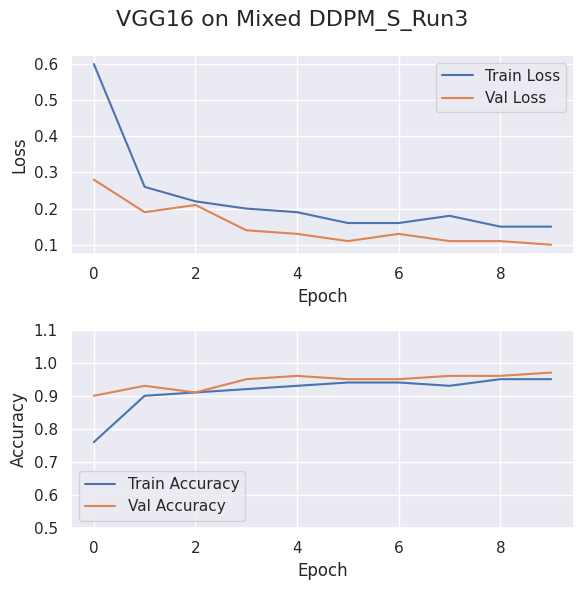

Testing on Dataset 1
13/13 [==============================] - 3s 215ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2255, 'Test Accuracy': 0.9154, 'F1 Score': 0.92, 'Sensitivity (Recall)': 0.92, 'Precision': 0.91}


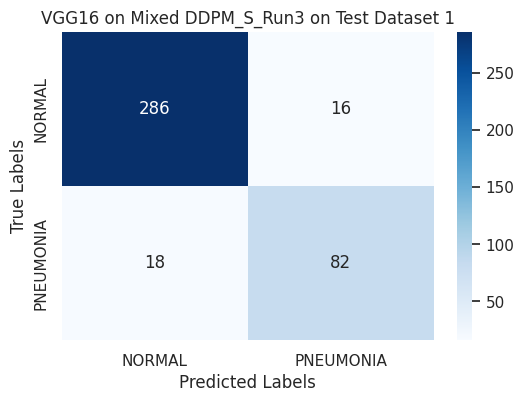

Testing on Dataset 2
13/13 [==============================] - 5s 395ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.2005, 'Test Accuracy': 0.9328, 'F1 Score': 0.93, 'Sensitivity (Recall)': 0.93, 'Precision': 0.93}


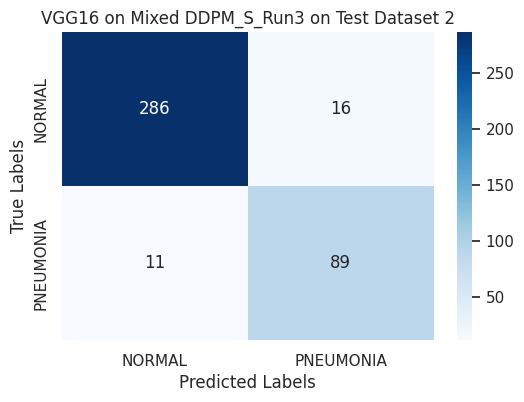

Testing on Dataset 3
13/13 [==============================] - 5s 401ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.2012, 'Test Accuracy': 0.9254, 'F1 Score': 0.93, 'Sensitivity (Recall)': 0.93, 'Precision': 0.93}


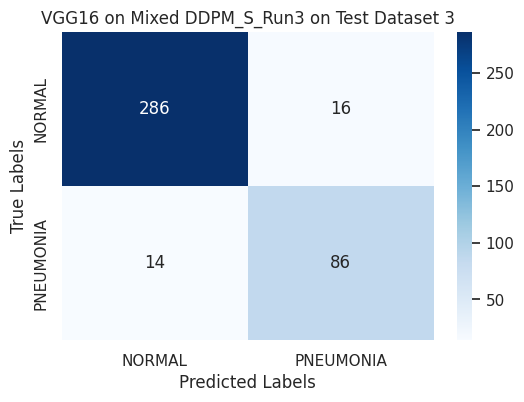

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 47s 502ms/step - loss: 0.5134 - accuracy: 0.7733 - val_loss: 0.2833 - val_accuracy: 0.8986
Epoch 2/10
93/93 [==============================] - 28s 295ms/step - loss: 0.2440 - accuracy: 0.9179 - val_loss: 0.1677 - val_accuracy: 0.9351
Epoch 3/10
93/93 [==============================] - 25s 275ms/step - loss: 0.1791 - accuracy: 0.9358 - val_loss: 0.1505 - val_accuracy: 0.9405
Epoch 4/10
93/93 [==============================] - 25s 274ms/step - loss: 0.1650 - accuracy: 0.9412 - val_loss: 0.1299 - val_accuracy: 0.9568
Epoch 5/10
93/93 [==============================] - 25s 274ms/step - loss: 0.1342 - accuracy: 0.9551 - val_loss: 0.1259 - val_accuracy: 0.9500
Epoch 6/10
93/93 [==============================] - 25s 273ms/step - loss: 0.1361 - accuracy: 0.9537 - val_loss: 0.1132 - val_accuracy: 0.9581
Epoch 7/10
93/93 [==============================] - 25s 274ms/step - loss: 0.1206 - accuracy: 0.9578 - v

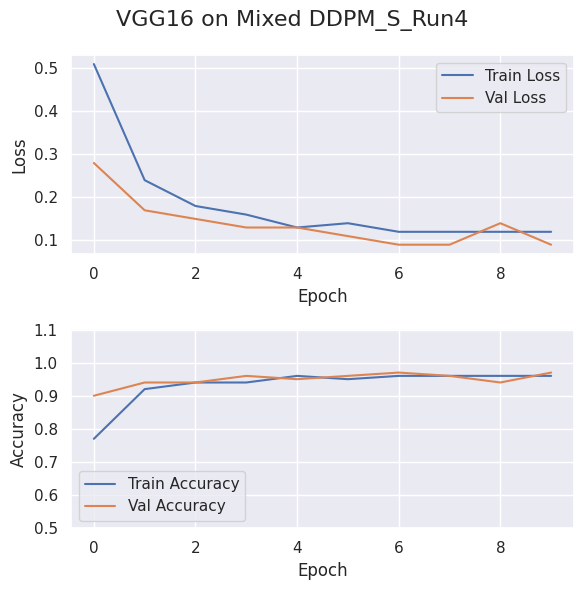

Testing on Dataset 1
13/13 [==============================] - 3s 206ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2224, 'Test Accuracy': 0.9179, 'F1 Score': 0.92, 'Sensitivity (Recall)': 0.92, 'Precision': 0.92}


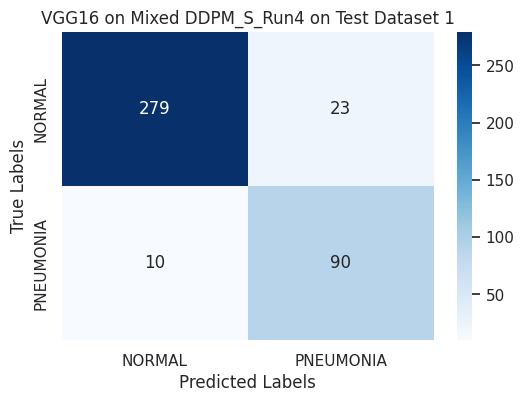

Testing on Dataset 2
13/13 [==============================] - 3s 207ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.1974, 'Test Accuracy': 0.9254, 'F1 Score': 0.93, 'Sensitivity (Recall)': 0.93, 'Precision': 0.93}


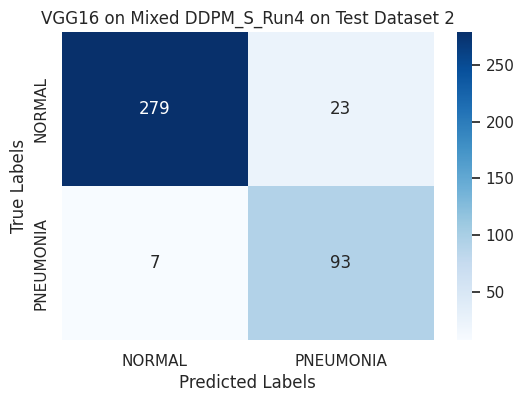

Testing on Dataset 3
13/13 [==============================] - 3s 208ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.1984, 'Test Accuracy': 0.9254, 'F1 Score': 0.93, 'Sensitivity (Recall)': 0.93, 'Precision': 0.93}


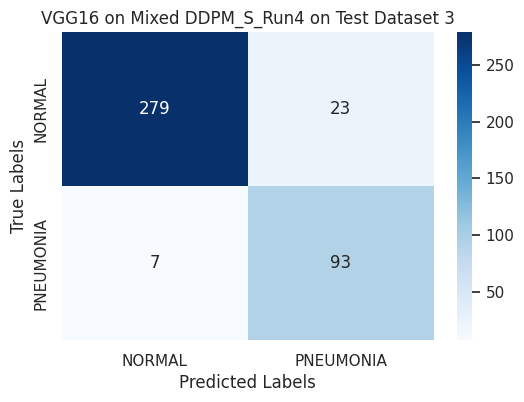

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 27s 280ms/step - loss: 0.5814 - accuracy: 0.7726 - val_loss: 0.2444 - val_accuracy: 0.9365
Epoch 2/10
93/93 [==============================] - 26s 276ms/step - loss: 0.2448 - accuracy: 0.9108 - val_loss: 0.1605 - val_accuracy: 0.9527
Epoch 3/10
93/93 [==============================] - 26s 277ms/step - loss: 0.1843 - accuracy: 0.9368 - val_loss: 0.1295 - val_accuracy: 0.9581
Epoch 4/10
93/93 [==============================] - 26s 276ms/step - loss: 0.1683 - accuracy: 0.9368 - val_loss: 0.1127 - val_accuracy: 0.9689
Epoch 5/10
93/93 [==============================] - 26s 276ms/step - loss: 0.1562 - accuracy: 0.9456 - val_loss: 0.1202 - val_accuracy: 0.9608
Epoch 6/10
93/93 [==============================] - 26s 277ms/step - loss: 0.1665 - accuracy: 0.9416 - val_loss: 0.1066 - val_accuracy: 0.9649
Epoch 7/10
93/93 [==============================] - 26s 277ms/step - loss: 0.1494 - accuracy: 0.9429 - v

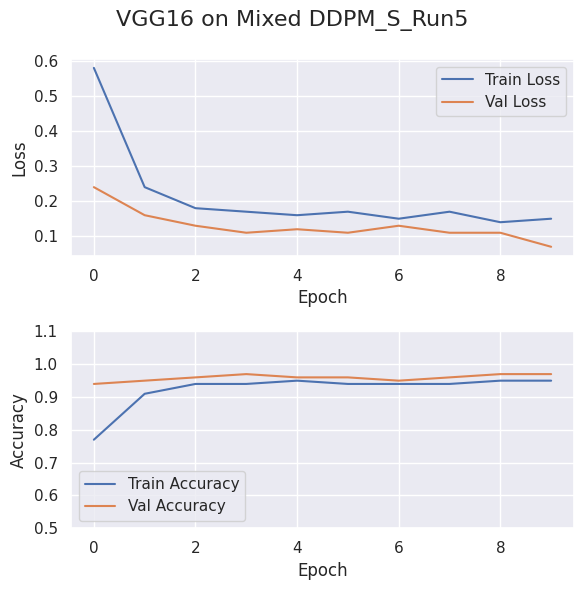

Testing on Dataset 1
13/13 [==============================] - 3s 205ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2257, 'Test Accuracy': 0.9129, 'F1 Score': 0.91, 'Sensitivity (Recall)': 0.91, 'Precision': 0.92}


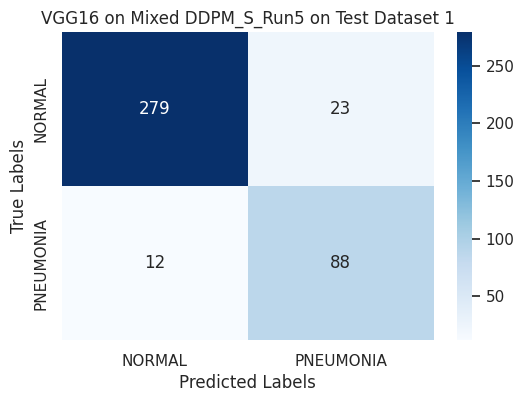

Testing on Dataset 2
13/13 [==============================] - 3s 208ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.2054, 'Test Accuracy': 0.9179, 'F1 Score': 0.92, 'Sensitivity (Recall)': 0.92, 'Precision': 0.92}


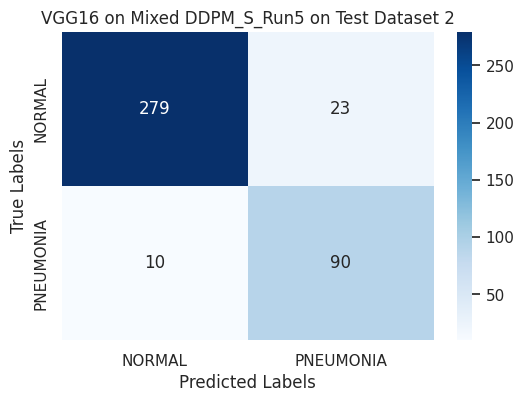

Testing on Dataset 3
13/13 [==============================] - 3s 209ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.1961, 'Test Accuracy': 0.9179, 'F1 Score': 0.92, 'Sensitivity (Recall)': 0.92, 'Precision': 0.92}


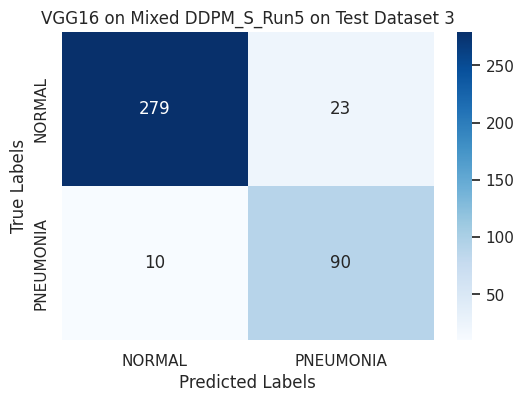

In [8]:
title = "VGG16 on Mixed DDPM_S" 
file_name = "Trained_Models/training_history_plot_Mixed_DDPM_S.png"

for i in range(0, 5):
    trained_model, test_metrics, confusion_matrix = imbalanced_cv_train_and_evaluate_model(
        dataset_dir_ddpm, 
        test_dataset_dir1, 
        test_dataset_dir2, 
        test_dataset_dir3, 
        class_labels, 
        vgg_model, 
        weights=None,
        input_shape= input_shape, 
        title=f"{title}_Run{i+1}", 
        file_name=file_name,  
        cv=cv, 
        epochs=epochs, 
        batch_size=batch_size
    )

#### Train on Mixed PGGANs150k Dataset

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
92/92 [==============================] - 26s 280ms/step - loss: 0.6009 - accuracy: 0.7202 - val_loss: 0.3332 - val_accuracy: 0.9097
Epoch 2/10
92/92 [==============================] - 25s 275ms/step - loss: 0.2426 - accuracy: 0.9350 - val_loss: 0.1837 - val_accuracy: 0.9576
Epoch 3/10
92/92 [==============================] - 25s 275ms/step - loss: 0.2152 - accuracy: 0.9313 - val_loss: 0.1290 - val_accuracy: 0.9658
Epoch 4/10
92/92 [==============================] - 25s 275ms/step - loss: 0.1576 - accuracy: 0.9508 - val_loss: 0.1247 - val_accuracy: 0.9576
Epoch 5/10
92/92 [==============================] - 25s 274ms/step - loss: 0.1442 - accuracy: 0.9569 - val_loss: 0.1040 - val_accuracy: 0.9658
Epoch 6/10
92/92 [==============================] - 25s 274ms/step - loss: 0.1129 - accuracy: 0.9679 - val_loss: 0.0955 - val_accuracy: 0.9713
Epoch 7/10
92/92 [==============================] - 25s 273ms/step - loss: 0.1265 - accuracy: 0.9590 - v

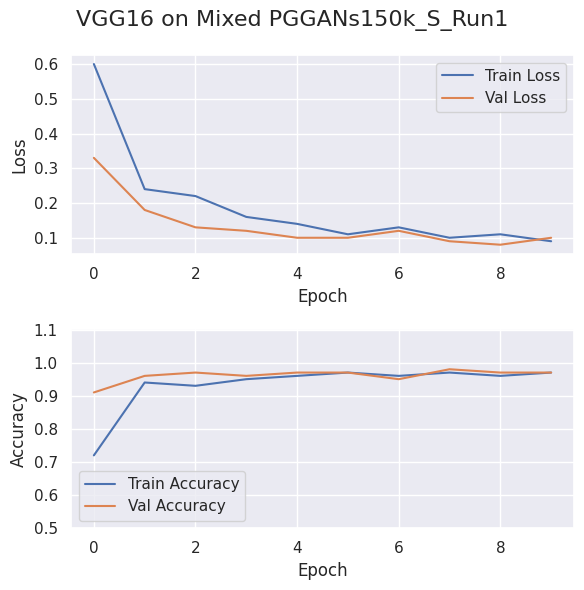

Testing on Dataset 1
13/13 [==============================] - 3s 206ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2417, 'Test Accuracy': 0.9129, 'F1 Score': 0.91, 'Sensitivity (Recall)': 0.91, 'Precision': 0.92}


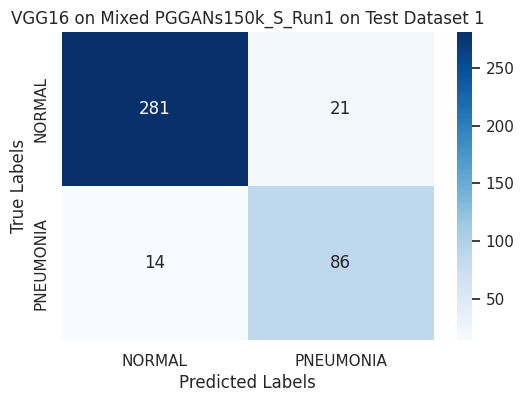

Testing on Dataset 2
13/13 [==============================] - 3s 205ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.2133, 'Test Accuracy': 0.9328, 'F1 Score': 0.93, 'Sensitivity (Recall)': 0.93, 'Precision': 0.94}


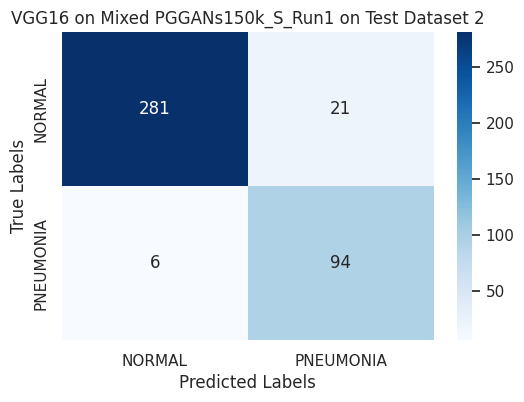

Testing on Dataset 3
13/13 [==============================] - 3s 205ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.2226, 'Test Accuracy': 0.9229, 'F1 Score': 0.92, 'Sensitivity (Recall)': 0.92, 'Precision': 0.93}


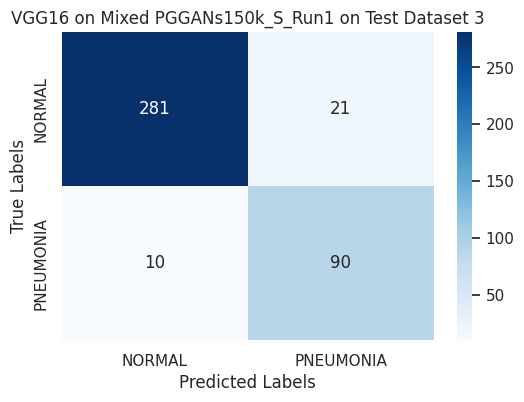

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
92/92 [==============================] - 26s 279ms/step - loss: 0.6186 - accuracy: 0.7343 - val_loss: 0.3769 - val_accuracy: 0.8564
Epoch 2/10
92/92 [==============================] - 25s 276ms/step - loss: 0.2529 - accuracy: 0.9319 - val_loss: 0.2029 - val_accuracy: 0.9603
Epoch 3/10
92/92 [==============================] - 25s 276ms/step - loss: 0.1955 - accuracy: 0.9381 - val_loss: 0.1266 - val_accuracy: 0.9740
Epoch 4/10
92/92 [==============================] - 25s 277ms/step - loss: 0.1794 - accuracy: 0.9425 - val_loss: 0.1138 - val_accuracy: 0.9672
Epoch 5/10
92/92 [==============================] - 25s 275ms/step - loss: 0.1372 - accuracy: 0.9552 - val_loss: 0.1147 - val_accuracy: 0.9535
Epoch 6/10
92/92 [==============================] - 25s 276ms/step - loss: 0.1140 - accuracy: 0.9648 - val_loss: 0.1482 - val_accuracy: 0.9357
Epoch 7/10
92/92 [==============================] - 25s 276ms/step - loss: 0.1328 - accuracy: 0.9593 - v

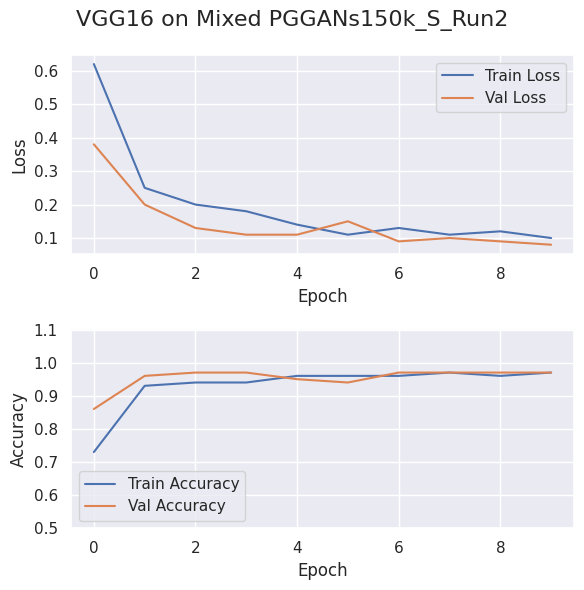

Testing on Dataset 1
13/13 [==============================] - 3s 207ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2459, 'Test Accuracy': 0.9055, 'F1 Score': 0.9, 'Sensitivity (Recall)': 0.91, 'Precision': 0.9}


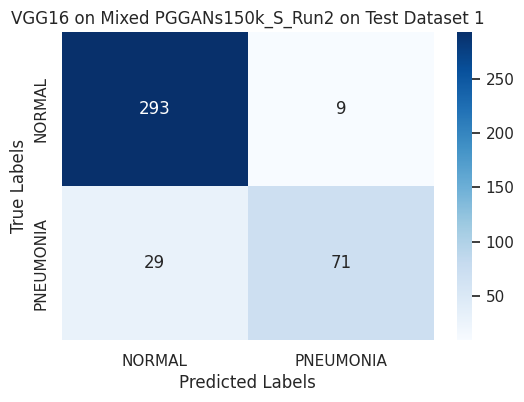

Testing on Dataset 2
13/13 [==============================] - 3s 207ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.2027, 'Test Accuracy': 0.9229, 'F1 Score': 0.92, 'Sensitivity (Recall)': 0.92, 'Precision': 0.92}


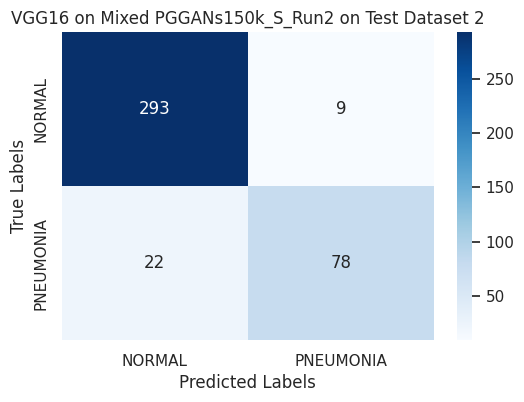

Testing on Dataset 3
13/13 [==============================] - 3s 208ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.2115, 'Test Accuracy': 0.9055, 'F1 Score': 0.9, 'Sensitivity (Recall)': 0.91, 'Precision': 0.9}


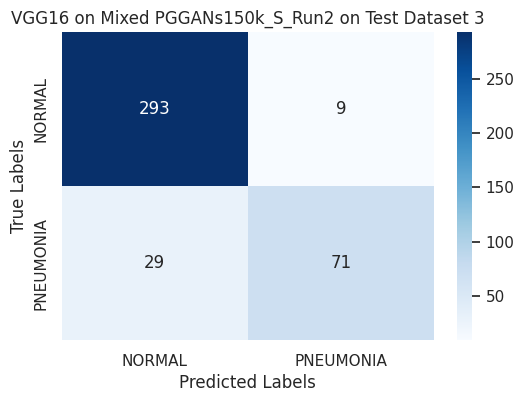

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
92/92 [==============================] - 26s 279ms/step - loss: 0.4277 - accuracy: 0.8352 - val_loss: 0.2102 - val_accuracy: 0.9111
Epoch 2/10
92/92 [==============================] - 25s 276ms/step - loss: 0.1629 - accuracy: 0.9531 - val_loss: 0.1308 - val_accuracy: 0.9685
Epoch 3/10
92/92 [==============================] - 25s 274ms/step - loss: 0.1819 - accuracy: 0.9381 - val_loss: 0.1213 - val_accuracy: 0.9713
Epoch 4/10
92/92 [==============================] - 25s 275ms/step - loss: 0.1365 - accuracy: 0.9542 - val_loss: 0.1720 - val_accuracy: 0.9234
Epoch 5/10
92/92 [==============================] - 25s 274ms/step - loss: 0.1167 - accuracy: 0.9655 - val_loss: 0.0987 - val_accuracy: 0.9644
Epoch 6/10
92/92 [==============================] - 25s 273ms/step - loss: 0.1021 - accuracy: 0.9689 - val_loss: 0.0882 - val_accuracy: 0.9781
Epoch 7/10
92/92 [==============================] - 25s 274ms/step - loss: 0.1137 - accuracy: 0.9644 - v

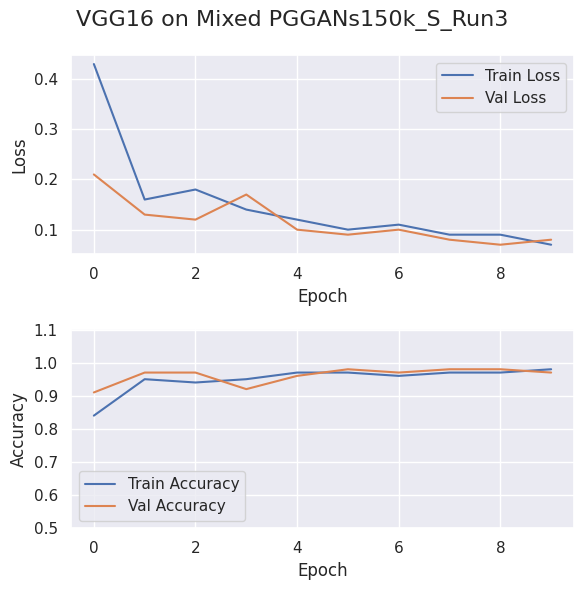

Testing on Dataset 1
13/13 [==============================] - 3s 206ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.1961, 'Test Accuracy': 0.9179, 'F1 Score': 0.92, 'Sensitivity (Recall)': 0.92, 'Precision': 0.92}


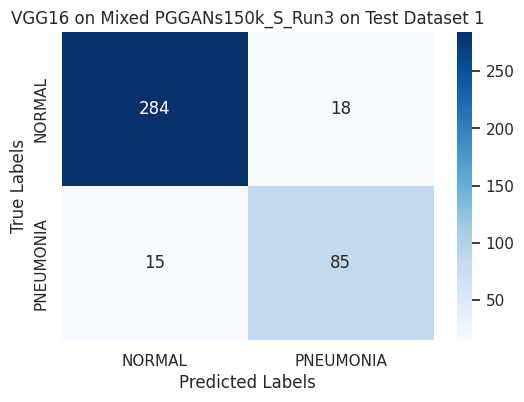

Testing on Dataset 2
13/13 [==============================] - 3s 208ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.1574, 'Test Accuracy': 0.9328, 'F1 Score': 0.93, 'Sensitivity (Recall)': 0.93, 'Precision': 0.94}


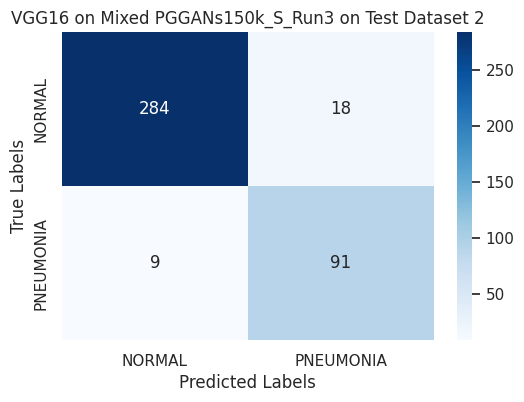

Testing on Dataset 3
13/13 [==============================] - 3s 209ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.1702, 'Test Accuracy': 0.9303, 'F1 Score': 0.93, 'Sensitivity (Recall)': 0.93, 'Precision': 0.93}


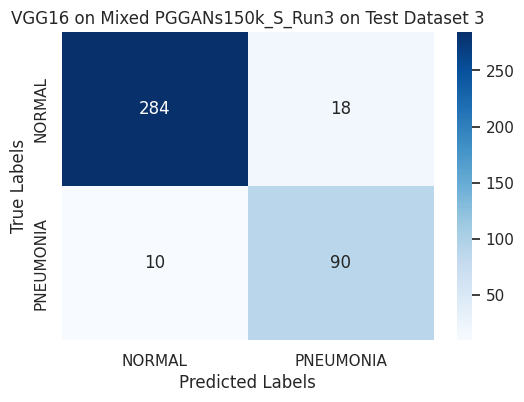

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
92/92 [==============================] - 26s 280ms/step - loss: 0.5826 - accuracy: 0.7565 - val_loss: 0.3797 - val_accuracy: 0.8181
Epoch 2/10
92/92 [==============================] - 25s 276ms/step - loss: 0.2307 - accuracy: 0.9330 - val_loss: 0.1483 - val_accuracy: 0.9644
Epoch 3/10
92/92 [==============================] - 25s 275ms/step - loss: 0.2026 - accuracy: 0.9316 - val_loss: 0.1274 - val_accuracy: 0.9644
Epoch 4/10
92/92 [==============================] - 25s 275ms/step - loss: 0.1512 - accuracy: 0.9538 - val_loss: 0.1139 - val_accuracy: 0.9699
Epoch 5/10
92/92 [==============================] - 25s 274ms/step - loss: 0.1490 - accuracy: 0.9531 - val_loss: 0.1168 - val_accuracy: 0.9549
Epoch 6/10
92/92 [==============================] - 25s 274ms/step - loss: 0.1180 - accuracy: 0.9651 - val_loss: 0.1041 - val_accuracy: 0.9603
Epoch 7/10
92/92 [==============================] - 25s 275ms/step - loss: 0.1563 - accuracy: 0.9497 - v

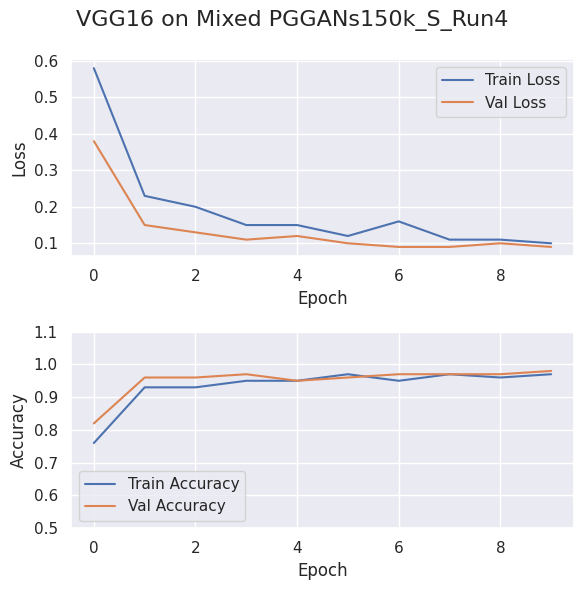

Testing on Dataset 1
13/13 [==============================] - 3s 208ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2454, 'Test Accuracy': 0.903, 'F1 Score': 0.9, 'Sensitivity (Recall)': 0.9, 'Precision': 0.9}


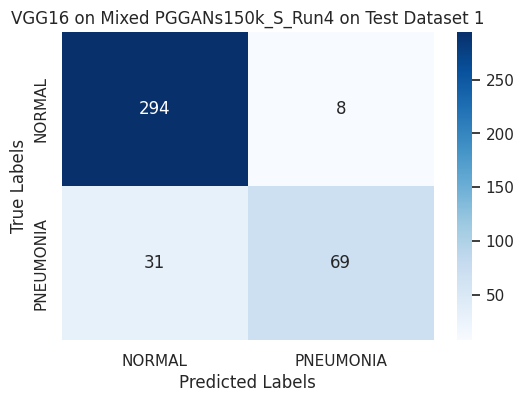

Testing on Dataset 2
13/13 [==============================] - 3s 206ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.2204, 'Test Accuracy': 0.9129, 'F1 Score': 0.91, 'Sensitivity (Recall)': 0.91, 'Precision': 0.91}


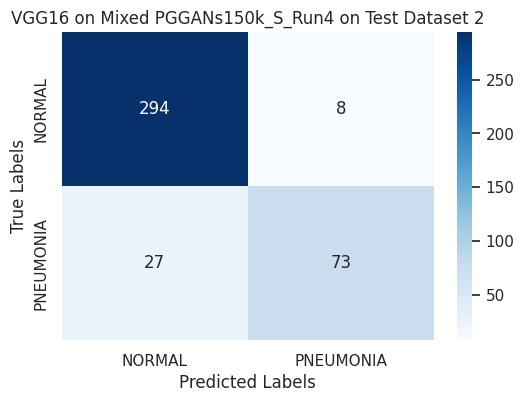

Testing on Dataset 3
13/13 [==============================] - 3s 206ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.2121, 'Test Accuracy': 0.908, 'F1 Score': 0.9, 'Sensitivity (Recall)': 0.91, 'Precision': 0.91}


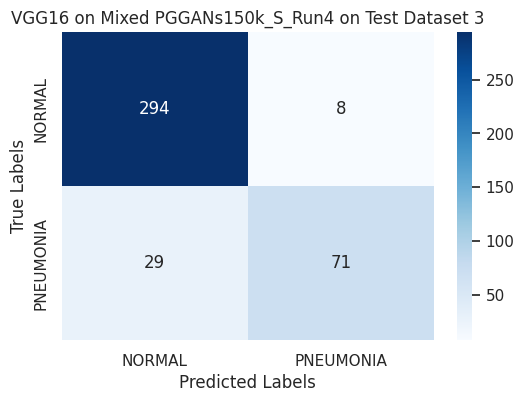

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
92/92 [==============================] - 26s 279ms/step - loss: 0.4715 - accuracy: 0.7962 - val_loss: 0.2157 - val_accuracy: 0.9302
Epoch 2/10
92/92 [==============================] - 25s 275ms/step - loss: 0.2012 - accuracy: 0.9402 - val_loss: 0.1222 - val_accuracy: 0.9740
Epoch 3/10
92/92 [==============================] - 25s 276ms/step - loss: 0.1457 - accuracy: 0.9545 - val_loss: 0.2102 - val_accuracy: 0.9466
Epoch 4/10
92/92 [==============================] - 25s 276ms/step - loss: 0.1542 - accuracy: 0.9477 - val_loss: 0.1215 - val_accuracy: 0.9535
Epoch 5/10
92/92 [==============================] - 25s 276ms/step - loss: 0.1636 - accuracy: 0.9429 - val_loss: 0.1359 - val_accuracy: 0.9384
Epoch 6/10
92/92 [==============================] - 25s 275ms/step - loss: 0.1291 - accuracy: 0.9627 - val_loss: 0.0909 - val_accuracy: 0.9713
Epoch 7/10
92/92 [==============================] - 25s 274ms/step - loss: 0.1378 - accuracy: 0.9562 - v

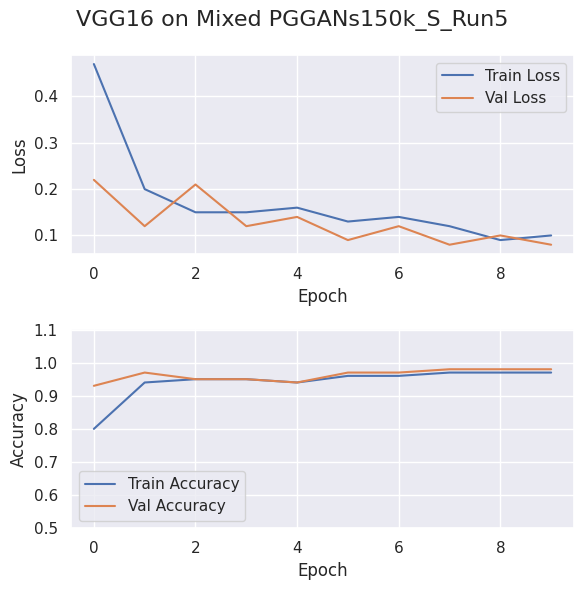

Testing on Dataset 1
13/13 [==============================] - 3s 208ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.212, 'Test Accuracy': 0.9055, 'F1 Score': 0.91, 'Sensitivity (Recall)': 0.91, 'Precision': 0.9}


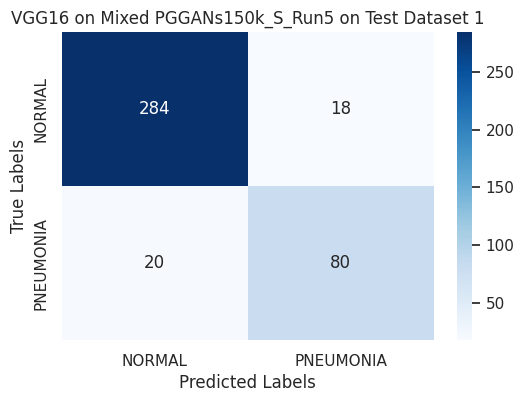

Testing on Dataset 2
13/13 [==============================] - 3s 207ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.1667, 'Test Accuracy': 0.9229, 'F1 Score': 0.92, 'Sensitivity (Recall)': 0.92, 'Precision': 0.92}


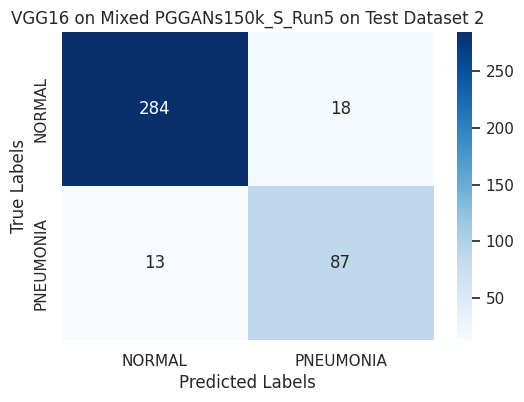

Testing on Dataset 3
13/13 [==============================] - 3s 205ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.175, 'Test Accuracy': 0.9254, 'F1 Score': 0.93, 'Sensitivity (Recall)': 0.93, 'Precision': 0.93}


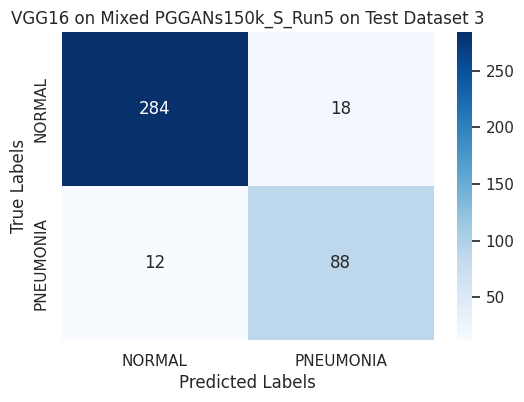

In [9]:
title = "VGG16 on Mixed PGGANs150k_S" 
file_name = "Trained_Models/training_history_plot_Mixed_PGGANs150k_S.png"


for i in range(0, 5):
    trained_model, test_metrics, confusion_matrix = imbalanced_cv_train_and_evaluate_model(
        dataset_dir_pggans150, 
        test_dataset_dir1, 
        test_dataset_dir2, 
        test_dataset_dir3, 
        class_labels, 
        vgg_model, 
        weights=None,
        input_shape= input_shape, 
        title=f"{title}_Run{i+1}", 
        file_name=file_name,  
        cv=cv, 
        epochs=epochs, 
        batch_size=batch_size
    )

#### Train on Mixed PGGANs160k Dataset

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 27s 278ms/step - loss: 0.4725 - accuracy: 0.8084 - val_loss: 0.1721 - val_accuracy: 0.9514
Epoch 2/10
93/93 [==============================] - 25s 273ms/step - loss: 0.1789 - accuracy: 0.9439 - val_loss: 0.1432 - val_accuracy: 0.9486
Epoch 3/10
93/93 [==============================] - 25s 274ms/step - loss: 0.1598 - accuracy: 0.9466 - val_loss: 0.1017 - val_accuracy: 0.9635
Epoch 4/10
93/93 [==============================] - 25s 274ms/step - loss: 0.1415 - accuracy: 0.9537 - val_loss: 0.0921 - val_accuracy: 0.9662
Epoch 5/10
93/93 [==============================] - 25s 274ms/step - loss: 0.1218 - accuracy: 0.9591 - val_loss: 0.0898 - val_accuracy: 0.9662
Epoch 6/10
93/93 [==============================] - 25s 274ms/step - loss: 0.1327 - accuracy: 0.9551 - val_loss: 0.0899 - val_accuracy: 0.9635
Epoch 7/10
93/93 [==============================] - 25s 273ms/step - loss: 0.1076 - accuracy: 0.9659 - v

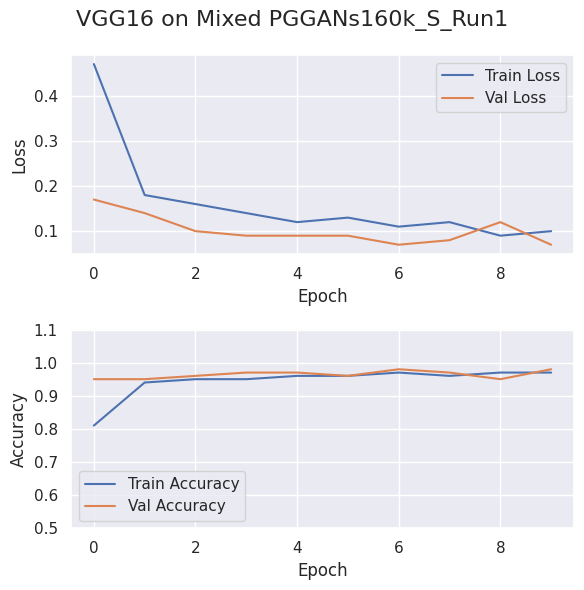

Testing on Dataset 1
13/13 [==============================] - 3s 207ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.1997, 'Test Accuracy': 0.9104, 'F1 Score': 0.91, 'Sensitivity (Recall)': 0.91, 'Precision': 0.91}


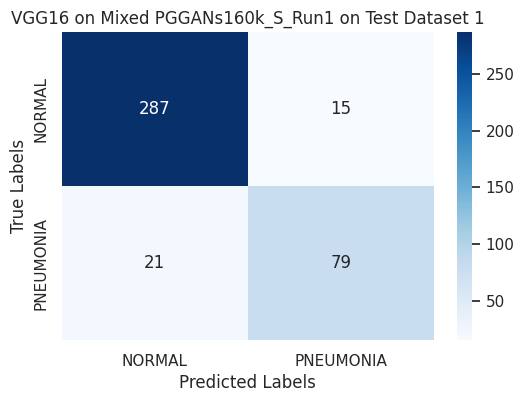

Testing on Dataset 2
13/13 [==============================] - 3s 206ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.1538, 'Test Accuracy': 0.9353, 'F1 Score': 0.94, 'Sensitivity (Recall)': 0.94, 'Precision': 0.94}


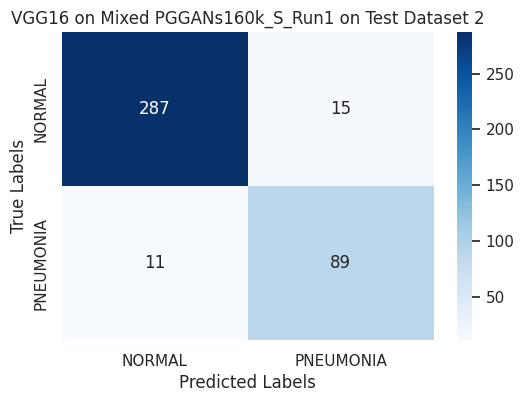

Testing on Dataset 3
13/13 [==============================] - 3s 208ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.1727, 'Test Accuracy': 0.9328, 'F1 Score': 0.93, 'Sensitivity (Recall)': 0.93, 'Precision': 0.93}


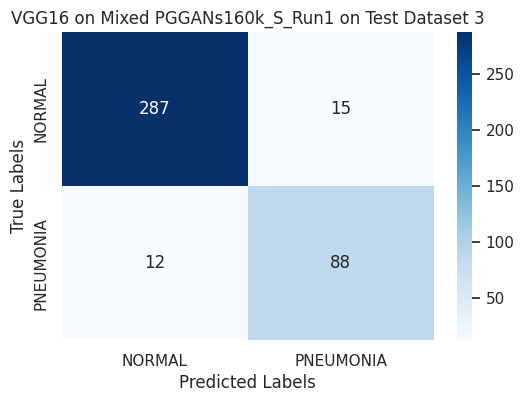

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 27s 279ms/step - loss: 0.5017 - accuracy: 0.8071 - val_loss: 0.1607 - val_accuracy: 0.9581
Epoch 2/10
93/93 [==============================] - 26s 276ms/step - loss: 0.1692 - accuracy: 0.9500 - val_loss: 0.1620 - val_accuracy: 0.9473
Epoch 3/10
93/93 [==============================] - 26s 276ms/step - loss: 0.1525 - accuracy: 0.9537 - val_loss: 0.1110 - val_accuracy: 0.9635
Epoch 4/10
93/93 [==============================] - 26s 276ms/step - loss: 0.1425 - accuracy: 0.9517 - val_loss: 0.0948 - val_accuracy: 0.9689
Epoch 5/10
93/93 [==============================] - 26s 275ms/step - loss: 0.1355 - accuracy: 0.9544 - val_loss: 0.0932 - val_accuracy: 0.9676
Epoch 6/10
93/93 [==============================] - 26s 275ms/step - loss: 0.1515 - accuracy: 0.9520 - val_loss: 0.0843 - val_accuracy: 0.9716
Epoch 7/10
93/93 [==============================] - 25s 275ms/step - loss: 0.1376 - accuracy: 0.9571 - v

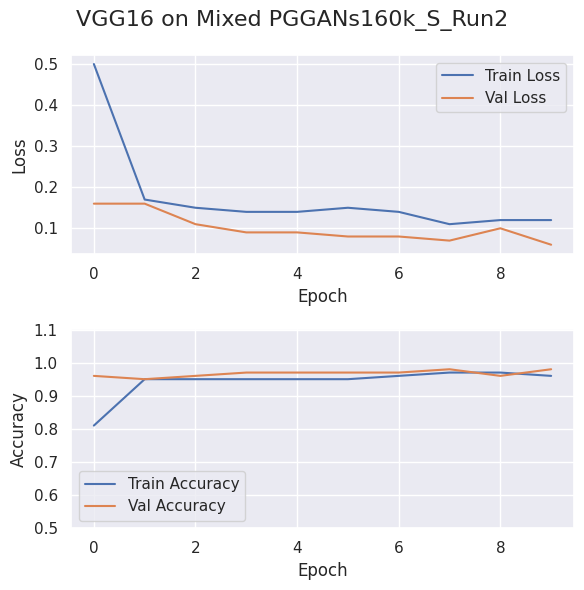

Testing on Dataset 1
13/13 [==============================] - 3s 208ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2096, 'Test Accuracy': 0.9179, 'F1 Score': 0.92, 'Sensitivity (Recall)': 0.92, 'Precision': 0.92}


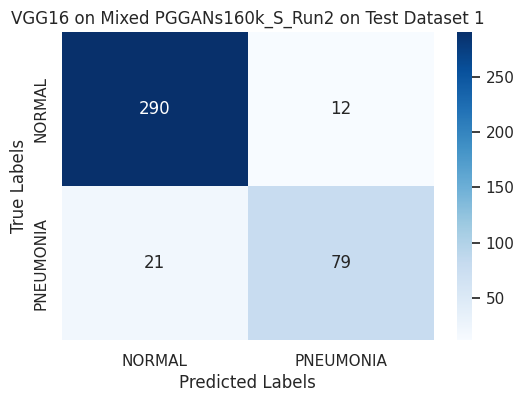

Testing on Dataset 2
13/13 [==============================] - 3s 205ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.1796, 'Test Accuracy': 0.9229, 'F1 Score': 0.92, 'Sensitivity (Recall)': 0.92, 'Precision': 0.92}


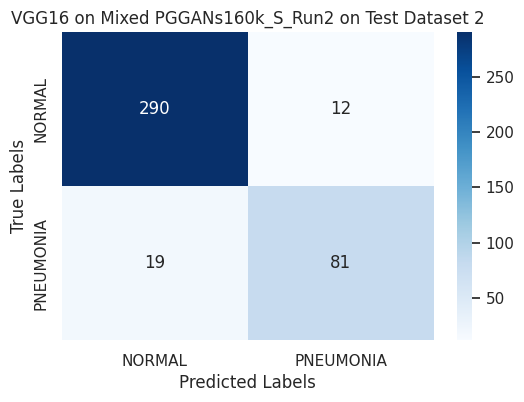

Testing on Dataset 3
13/13 [==============================] - 3s 205ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.1748, 'Test Accuracy': 0.9328, 'F1 Score': 0.93, 'Sensitivity (Recall)': 0.93, 'Precision': 0.93}


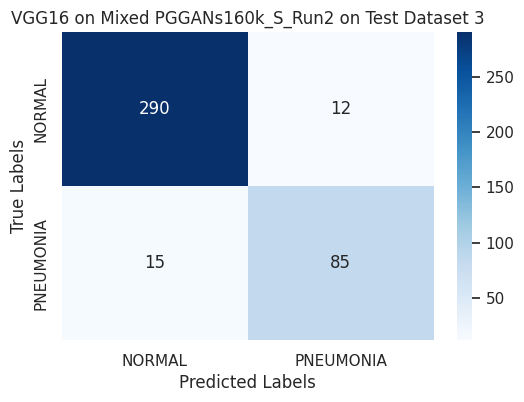

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 27s 278ms/step - loss: 0.5653 - accuracy: 0.8003 - val_loss: 0.2086 - val_accuracy: 0.9473
Epoch 2/10
93/93 [==============================] - 26s 276ms/step - loss: 0.1968 - accuracy: 0.9405 - val_loss: 0.1255 - val_accuracy: 0.9662
Epoch 3/10
93/93 [==============================] - 26s 275ms/step - loss: 0.1483 - accuracy: 0.9537 - val_loss: 0.0945 - val_accuracy: 0.9743
Epoch 4/10
93/93 [==============================] - 26s 277ms/step - loss: 0.1524 - accuracy: 0.9507 - val_loss: 0.1053 - val_accuracy: 0.9581
Epoch 5/10
93/93 [==============================] - 26s 275ms/step - loss: 0.1295 - accuracy: 0.9608 - val_loss: 0.0981 - val_accuracy: 0.9622
Epoch 6/10
93/93 [==============================] - 26s 276ms/step - loss: 0.1410 - accuracy: 0.9568 - val_loss: 0.0779 - val_accuracy: 0.9716
Epoch 7/10
93/93 [==============================] - 26s 276ms/step - loss: 0.1323 - accuracy: 0.9584 - v

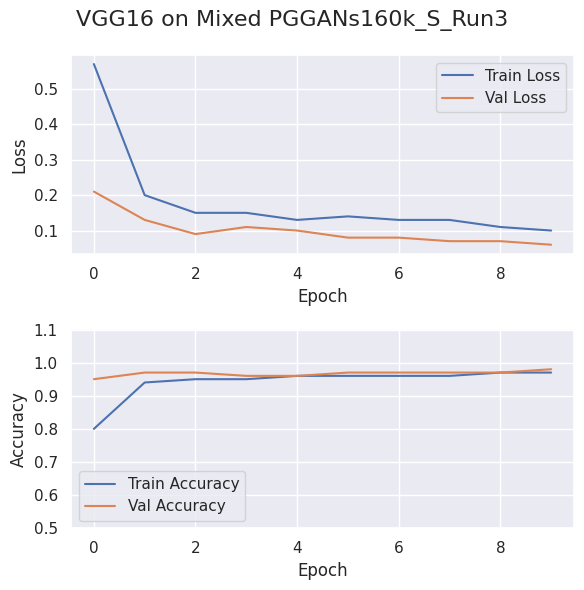

Testing on Dataset 1
13/13 [==============================] - 3s 206ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2221, 'Test Accuracy': 0.9055, 'F1 Score': 0.9, 'Sensitivity (Recall)': 0.91, 'Precision': 0.9}


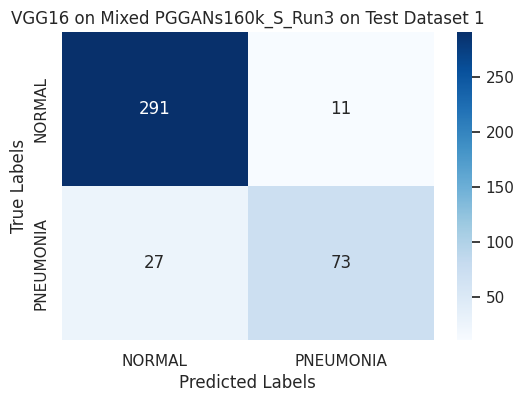

Testing on Dataset 2
13/13 [==============================] - 3s 206ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.1872, 'Test Accuracy': 0.9154, 'F1 Score': 0.91, 'Sensitivity (Recall)': 0.92, 'Precision': 0.91}


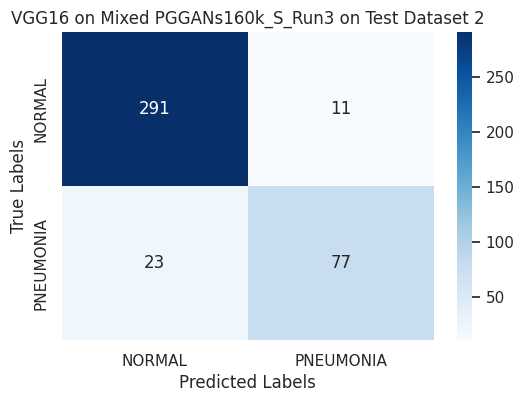

Testing on Dataset 3
13/13 [==============================] - 3s 212ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.1819, 'Test Accuracy': 0.9279, 'F1 Score': 0.93, 'Sensitivity (Recall)': 0.93, 'Precision': 0.93}


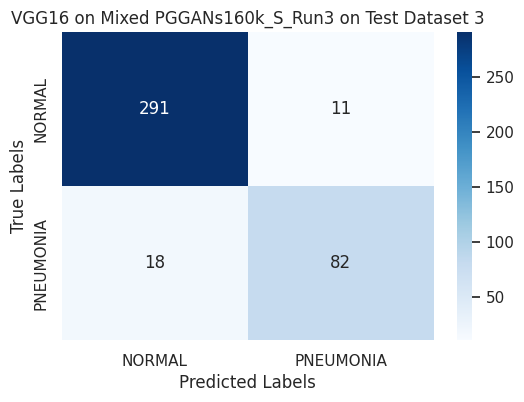

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 27s 278ms/step - loss: 0.5512 - accuracy: 0.7804 - val_loss: 0.2139 - val_accuracy: 0.9486
Epoch 2/10
93/93 [==============================] - 25s 274ms/step - loss: 0.2009 - accuracy: 0.9361 - val_loss: 0.1421 - val_accuracy: 0.9527
Epoch 3/10
93/93 [==============================] - 26s 275ms/step - loss: 0.1537 - accuracy: 0.9503 - val_loss: 0.1161 - val_accuracy: 0.9581
Epoch 4/10
93/93 [==============================] - 26s 277ms/step - loss: 0.1512 - accuracy: 0.9497 - val_loss: 0.0954 - val_accuracy: 0.9730
Epoch 5/10
93/93 [==============================] - 25s 274ms/step - loss: 0.1456 - accuracy: 0.9530 - val_loss: 0.0914 - val_accuracy: 0.9730
Epoch 6/10
93/93 [==============================] - 26s 275ms/step - loss: 0.1279 - accuracy: 0.9584 - val_loss: 0.0852 - val_accuracy: 0.9743
Epoch 7/10
93/93 [==============================] - 26s 276ms/step - loss: 0.1310 - accuracy: 0.9574 - v

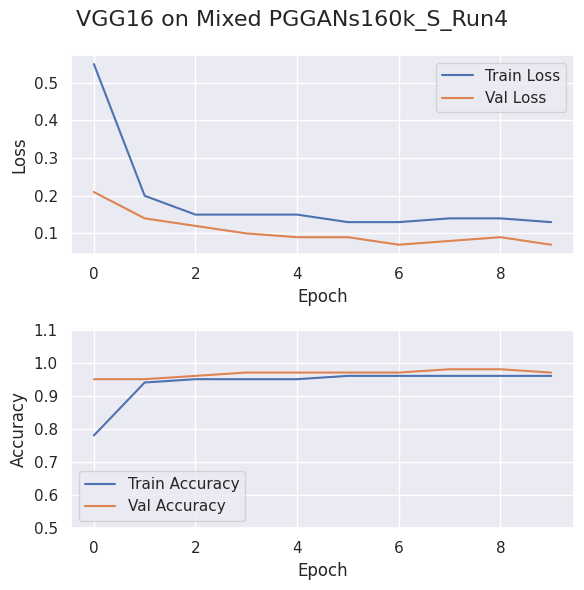

Testing on Dataset 1
13/13 [==============================] - 3s 207ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2384, 'Test Accuracy': 0.9055, 'F1 Score': 0.91, 'Sensitivity (Recall)': 0.91, 'Precision': 0.91}


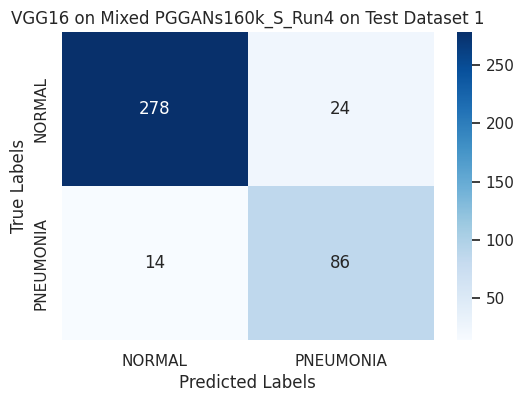

Testing on Dataset 2
13/13 [==============================] - 3s 207ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.2135, 'Test Accuracy': 0.9104, 'F1 Score': 0.91, 'Sensitivity (Recall)': 0.91, 'Precision': 0.92}


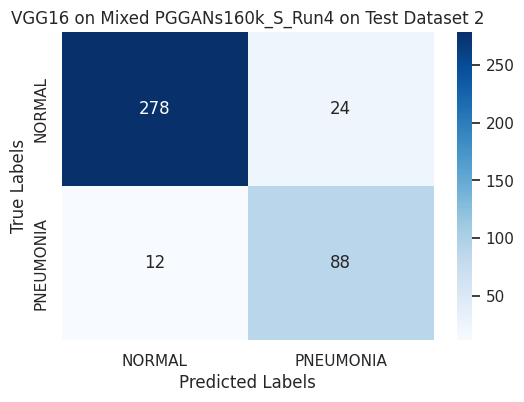

Testing on Dataset 3
13/13 [==============================] - 3s 205ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.2129, 'Test Accuracy': 0.9129, 'F1 Score': 0.91, 'Sensitivity (Recall)': 0.91, 'Precision': 0.92}


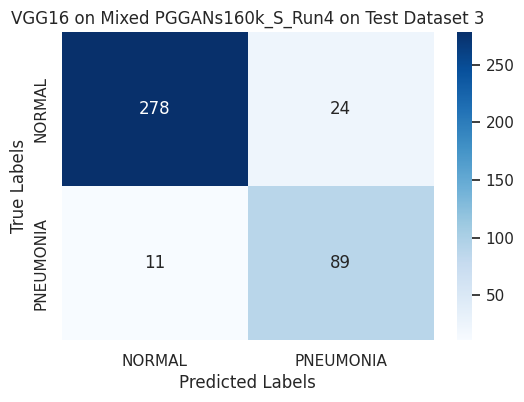

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 27s 278ms/step - loss: 0.5151 - accuracy: 0.7818 - val_loss: 0.2183 - val_accuracy: 0.9432
Epoch 2/10
93/93 [==============================] - 25s 273ms/step - loss: 0.1999 - accuracy: 0.9439 - val_loss: 0.1343 - val_accuracy: 0.9554
Epoch 3/10
93/93 [==============================] - 25s 273ms/step - loss: 0.1430 - accuracy: 0.9530 - val_loss: 0.1063 - val_accuracy: 0.9568
Epoch 4/10
93/93 [==============================] - 25s 274ms/step - loss: 0.1396 - accuracy: 0.9547 - val_loss: 0.0902 - val_accuracy: 0.9662
Epoch 5/10
93/93 [==============================] - 25s 274ms/step - loss: 0.1157 - accuracy: 0.9601 - val_loss: 0.0915 - val_accuracy: 0.9649
Epoch 6/10
93/93 [==============================] - 25s 274ms/step - loss: 0.1103 - accuracy: 0.9632 - val_loss: 0.0927 - val_accuracy: 0.9662
Epoch 7/10
93/93 [==============================] - 25s 272ms/step - loss: 0.1075 - accuracy: 0.9672 - v

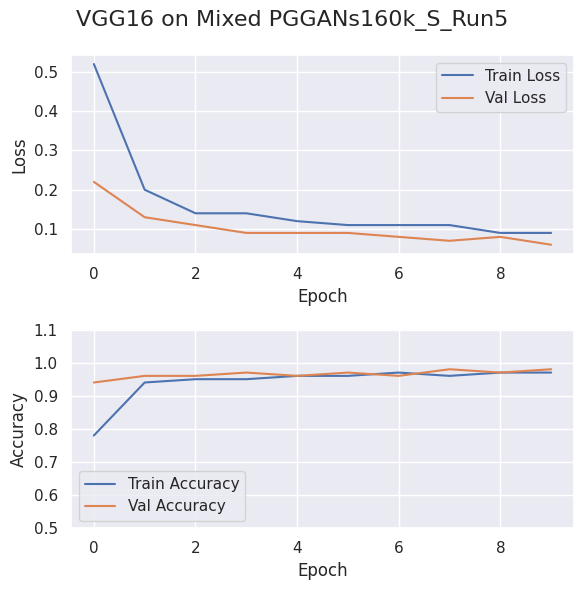

Testing on Dataset 1
13/13 [==============================] - 3s 206ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2114, 'Test Accuracy': 0.9179, 'F1 Score': 0.92, 'Sensitivity (Recall)': 0.92, 'Precision': 0.92}


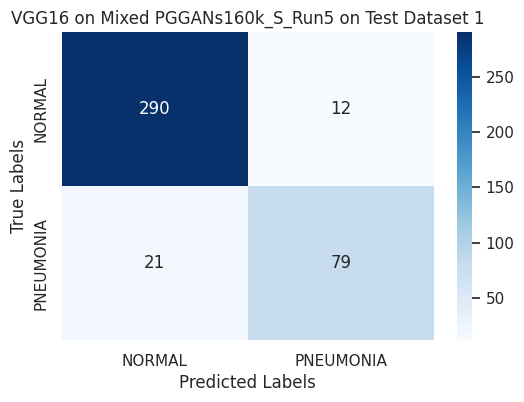

Testing on Dataset 2
13/13 [==============================] - 3s 207ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.1662, 'Test Accuracy': 0.9353, 'F1 Score': 0.94, 'Sensitivity (Recall)': 0.94, 'Precision': 0.93}


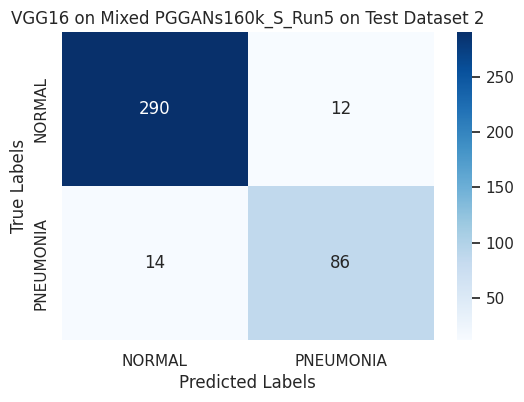

Testing on Dataset 3
13/13 [==============================] - 3s 204ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.1765, 'Test Accuracy': 0.9303, 'F1 Score': 0.93, 'Sensitivity (Recall)': 0.93, 'Precision': 0.93}


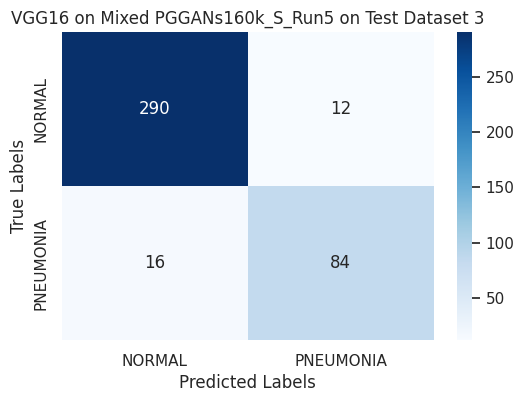

In [10]:
title = "VGG16 on Mixed PGGANs160k_S" 
file_name = "Trained_Models/training_history_plot_Mixed_PGGANs160k_S.png"


for i in range(0, 5):
    trained_model, test_metrics, confusion_matrix = imbalanced_cv_train_and_evaluate_model(
        dataset_dir_pggans160, 
        test_dataset_dir1, 
        test_dataset_dir2, 
        test_dataset_dir3, 
        class_labels, 
        vgg_model, 
        weights=None,
        input_shape= input_shape, 
        title=f"{title}_Run{i+1}", 
        file_name=file_name,  
        cv=cv, 
        epochs=epochs, 
        batch_size=batch_size
    )


## Resnet50

### cv=1

#### Train on Original Dataset


Class labels: ['NORMAL', 'PNEUMONIA']


2024-09-10 12:54:37.505520: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:268] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected


Epoch 1/10
43/43 [==============================] - 12s 218ms/step - loss: 33.1520 - accuracy: 0.8022 - val_loss: 10.8826 - val_accuracy: 0.8824
Epoch 2/10
43/43 [==============================] - 8s 186ms/step - loss: 3.0439 - accuracy: 0.8478 - val_loss: 0.2599 - val_accuracy: 0.9265
Epoch 3/10
43/43 [==============================] - 8s 192ms/step - loss: 0.3239 - accuracy: 0.8875 - val_loss: 0.2157 - val_accuracy: 0.9118
Epoch 4/10
43/43 [==============================] - 8s 189ms/step - loss: 0.4501 - accuracy: 0.9007 - val_loss: 0.2028 - val_accuracy: 0.9118
Epoch 5/10
43/43 [==============================] - 8s 193ms/step - loss: 0.2639 - accuracy: 0.8926 - val_loss: 0.2608 - val_accuracy: 0.8824
Epoch 6/10
43/43 [==============================] - 8s 192ms/step - loss: 0.2565 - accuracy: 0.8824 - val_loss: 0.2273 - val_accuracy: 0.8824
Epoch 7/10
43/43 [==============================] - 8s 191ms/step - loss: 0.2725 - accuracy: 0.8824 - val_loss: 0.2101 - val_accuracy: 0.8824
Epo

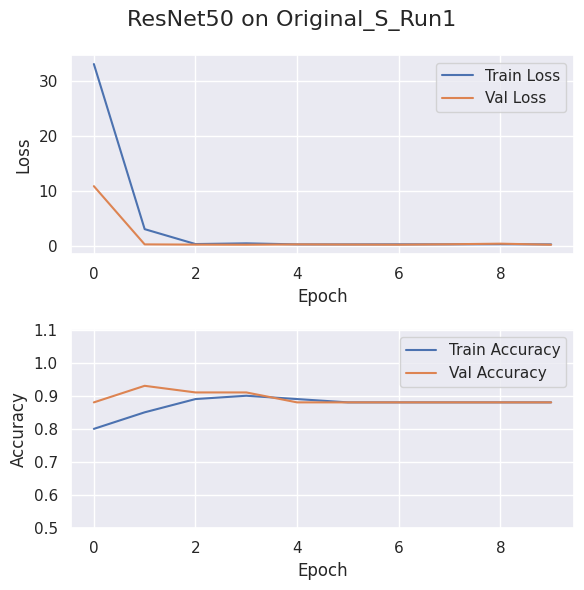

Testing on Dataset 1
13/13 [==============================] - 3s 124ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.352, 'Test Accuracy': 0.7512, 'F1 Score': 0.64, 'Sensitivity (Recall)': 0.75, 'Precision': 0.56}


/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control th

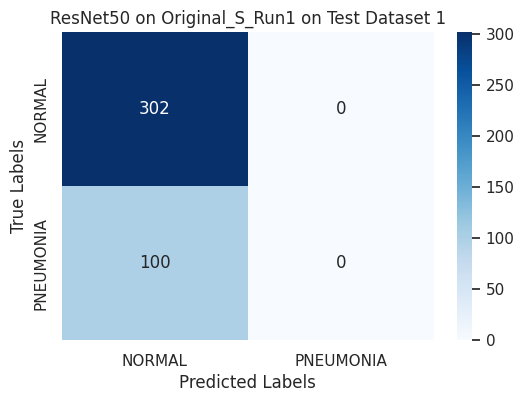

Testing on Dataset 2
13/13 [==============================] - 2s 118ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.3085, 'Test Accuracy': 0.7512, 'F1 Score': 0.64, 'Sensitivity (Recall)': 0.75, 'Precision': 0.56}


/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control th

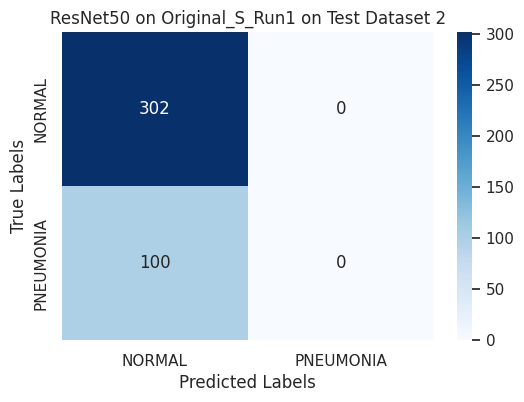

Testing on Dataset 3
13/13 [==============================] - 2s 123ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.3219, 'Test Accuracy': 0.7512, 'F1 Score': 0.64, 'Sensitivity (Recall)': 0.75, 'Precision': 0.56}


/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control th

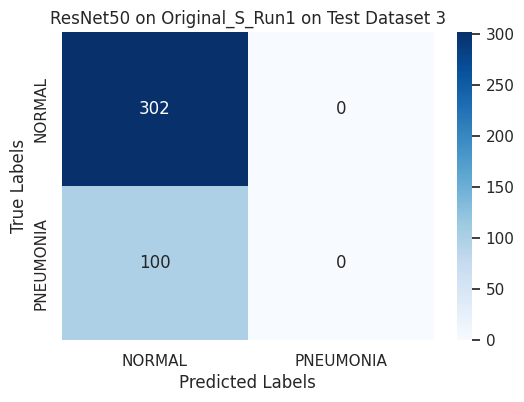

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
43/43 [==============================] - 12s 209ms/step - loss: 16.2253 - accuracy: 0.8132 - val_loss: 4.6147 - val_accuracy: 0.8824
Epoch 2/10
43/43 [==============================] - 8s 188ms/step - loss: 2.3207 - accuracy: 0.8515 - val_loss: 0.2671 - val_accuracy: 0.8912
Epoch 3/10
43/43 [==============================] - 8s 186ms/step - loss: 0.3051 - accuracy: 0.8882 - val_loss: 0.2255 - val_accuracy: 0.9147
Epoch 4/10
43/43 [==============================] - 8s 185ms/step - loss: 0.3363 - accuracy: 0.9007 - val_loss: 0.4526 - val_accuracy: 0.8824
Epoch 5/10
43/43 [==============================] - 8s 186ms/step - loss: 0.4334 - accuracy: 0.8971 - val_loss: 0.2332 - val_accuracy: 0.8912
Epoch 6/10
43/43 [==============================] - 8s 186ms/step - loss: 0.2433 - accuracy: 0.9007 - val_loss: 0.1780 - val_accuracy: 0.9441
Epoch 7/10
43/43 [==============================] - 8s 187ms/step - loss: 0.2470 - accuracy: 0.9022 - val_lo

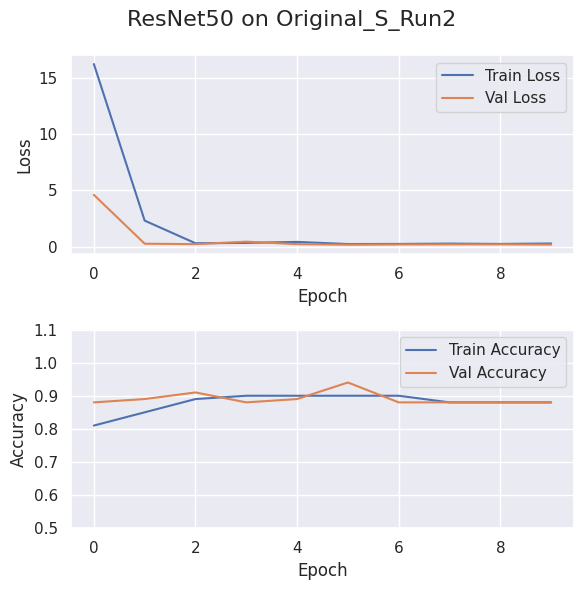

Testing on Dataset 1
13/13 [==============================] - 2s 118ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.3482, 'Test Accuracy': 0.7512, 'F1 Score': 0.64, 'Sensitivity (Recall)': 0.75, 'Precision': 0.56}


/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control th

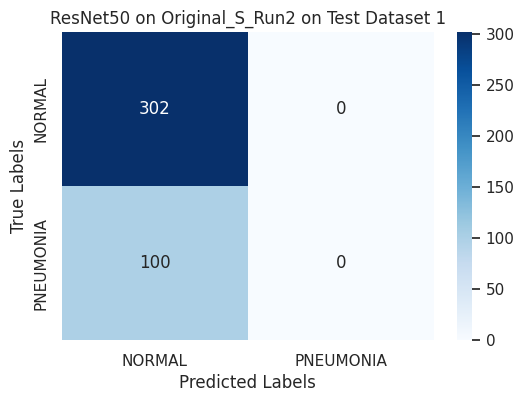

Testing on Dataset 2
13/13 [==============================] - 2s 116ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.3011, 'Test Accuracy': 0.7512, 'F1 Score': 0.64, 'Sensitivity (Recall)': 0.75, 'Precision': 0.56}


/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control th

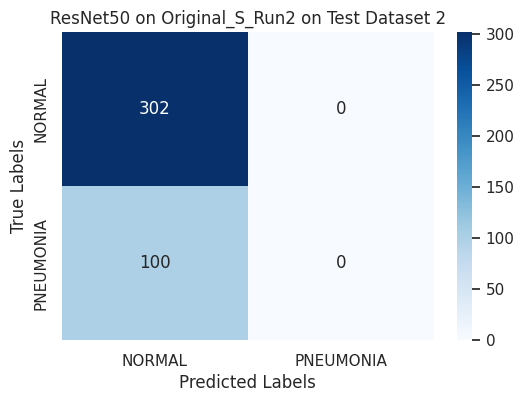

Testing on Dataset 3
13/13 [==============================] - 2s 117ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.3141, 'Test Accuracy': 0.7512, 'F1 Score': 0.64, 'Sensitivity (Recall)': 0.75, 'Precision': 0.56}


/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control th

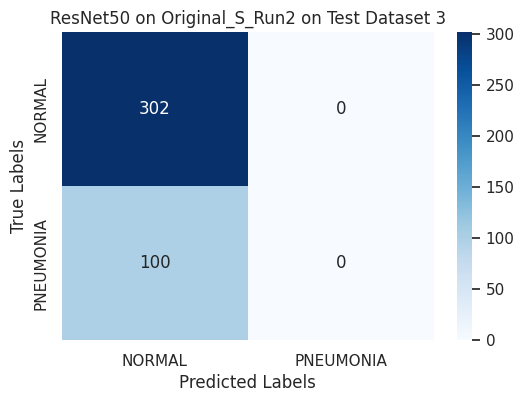

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
43/43 [==============================] - 12s 212ms/step - loss: 63.1996 - accuracy: 0.8081 - val_loss: 10.4457 - val_accuracy: 0.8824
Epoch 2/10
43/43 [==============================] - 8s 187ms/step - loss: 3.1064 - accuracy: 0.8706 - val_loss: 0.6809 - val_accuracy: 0.8824
Epoch 3/10
43/43 [==============================] - 8s 190ms/step - loss: 0.3563 - accuracy: 0.9000 - val_loss: 0.2007 - val_accuracy: 0.9176
Epoch 4/10
43/43 [==============================] - 8s 188ms/step - loss: 0.2246 - accuracy: 0.9199 - val_loss: 0.1989 - val_accuracy: 0.9235
Epoch 5/10
43/43 [==============================] - 8s 184ms/step - loss: 0.2707 - accuracy: 0.9051 - val_loss: 0.3068 - val_accuracy: 0.9353
Epoch 6/10
43/43 [==============================] - 8s 190ms/step - loss: 0.3337 - accuracy: 0.8765 - val_loss: 0.3858 - val_accuracy: 0.8824
Epoch 7/10
43/43 [==============================] - 8s 185ms/step - loss: 0.2906 - accuracy: 0.8985 - val_l

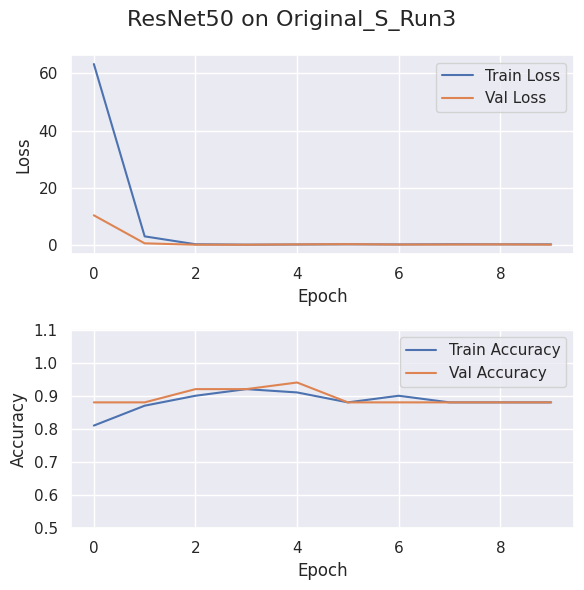

Testing on Dataset 1
13/13 [==============================] - 2s 120ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.3427, 'Test Accuracy': 0.7512, 'F1 Score': 0.64, 'Sensitivity (Recall)': 0.75, 'Precision': 0.56}


/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control th

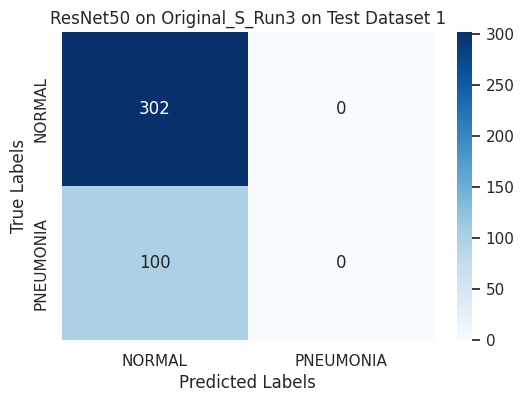

Testing on Dataset 2
13/13 [==============================] - 2s 117ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.3236, 'Test Accuracy': 0.7512, 'F1 Score': 0.64, 'Sensitivity (Recall)': 0.75, 'Precision': 0.56}


/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control th

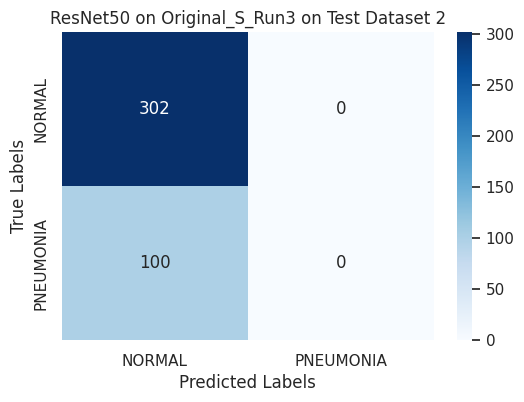

Testing on Dataset 3
13/13 [==============================] - 2s 117ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.3296, 'Test Accuracy': 0.7512, 'F1 Score': 0.64, 'Sensitivity (Recall)': 0.75, 'Precision': 0.56}


/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control th

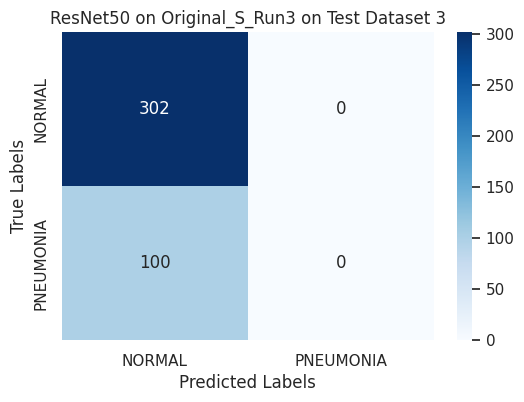

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
43/43 [==============================] - 12s 212ms/step - loss: 53.0151 - accuracy: 0.8000 - val_loss: 17.4558 - val_accuracy: 0.8824
Epoch 2/10
43/43 [==============================] - 8s 189ms/step - loss: 9.0998 - accuracy: 0.8507 - val_loss: 1.0341 - val_accuracy: 0.9382
Epoch 3/10
43/43 [==============================] - 8s 188ms/step - loss: 0.9521 - accuracy: 0.8868 - val_loss: 0.2100 - val_accuracy: 0.9353
Epoch 4/10
43/43 [==============================] - 8s 189ms/step - loss: 0.2561 - accuracy: 0.9162 - val_loss: 0.1923 - val_accuracy: 0.9353
Epoch 5/10
43/43 [==============================] - 8s 189ms/step - loss: 0.2409 - accuracy: 0.9184 - val_loss: 0.1803 - val_accuracy: 0.9324
Epoch 6/10
43/43 [==============================] - 8s 191ms/step - loss: 0.1807 - accuracy: 0.9324 - val_loss: 0.1721 - val_accuracy: 0.9500
Epoch 7/10
43/43 [==============================] - 8s 192ms/step - loss: 0.1863 - accuracy: 0.9353 - val_l

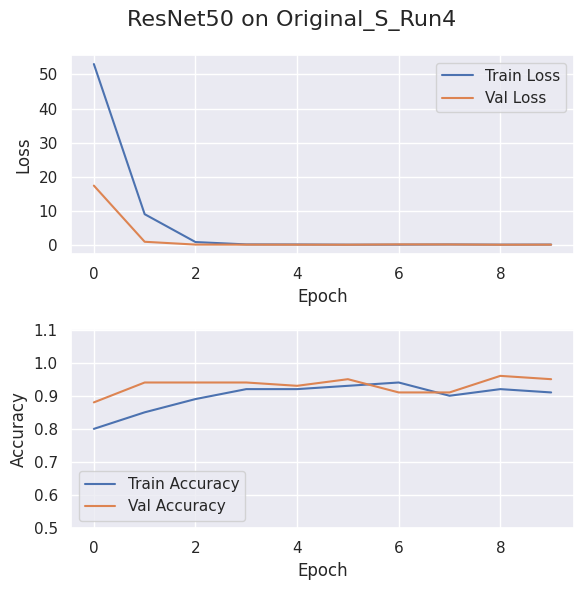

Testing on Dataset 1
13/13 [==============================] - 2s 118ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2629, 'Test Accuracy': 0.9254, 'F1 Score': 0.92, 'Sensitivity (Recall)': 0.93, 'Precision': 0.93}


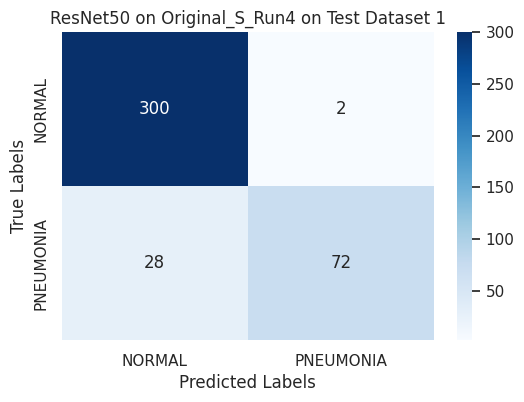

Testing on Dataset 2
13/13 [==============================] - 2s 119ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.2392, 'Test Accuracy': 0.9254, 'F1 Score': 0.92, 'Sensitivity (Recall)': 0.93, 'Precision': 0.93}


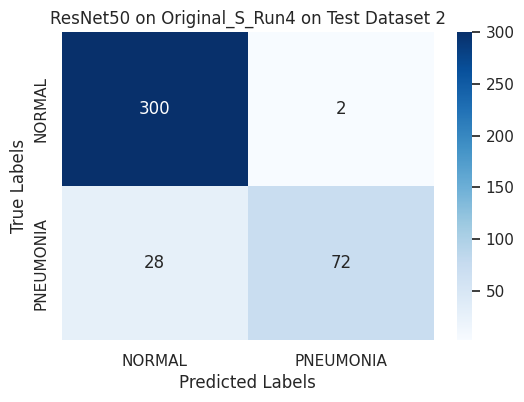

Testing on Dataset 3
13/13 [==============================] - 2s 116ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.2396, 'Test Accuracy': 0.9229, 'F1 Score': 0.92, 'Sensitivity (Recall)': 0.92, 'Precision': 0.93}


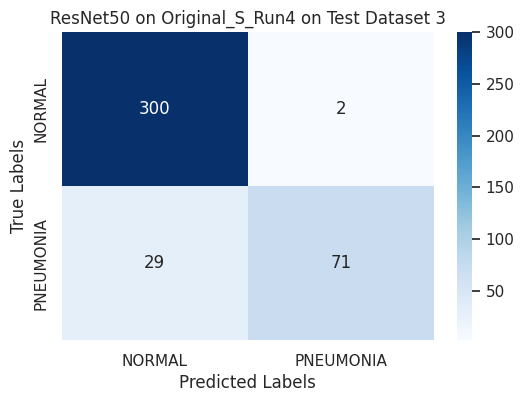

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
43/43 [==============================] - 12s 208ms/step - loss: 34.9285 - accuracy: 0.8147 - val_loss: 8.9558 - val_accuracy: 0.8824
Epoch 2/10
43/43 [==============================] - 8s 188ms/step - loss: 3.5231 - accuracy: 0.8596 - val_loss: 0.6496 - val_accuracy: 0.9029
Epoch 3/10
43/43 [==============================] - 8s 184ms/step - loss: 0.3057 - accuracy: 0.9066 - val_loss: 0.1740 - val_accuracy: 0.9382
Epoch 4/10
43/43 [==============================] - 8s 189ms/step - loss: 0.2627 - accuracy: 0.9088 - val_loss: 0.2987 - val_accuracy: 0.8853
Epoch 5/10
43/43 [==============================] - 8s 187ms/step - loss: 0.2626 - accuracy: 0.9029 - val_loss: 0.1975 - val_accuracy: 0.9441
Epoch 6/10
43/43 [==============================] - 8s 186ms/step - loss: 0.2610 - accuracy: 0.9051 - val_loss: 0.2313 - val_accuracy: 0.9206
Epoch 7/10
43/43 [==============================] - 8s 188ms/step - loss: 0.2750 - accuracy: 0.8934 - val_lo

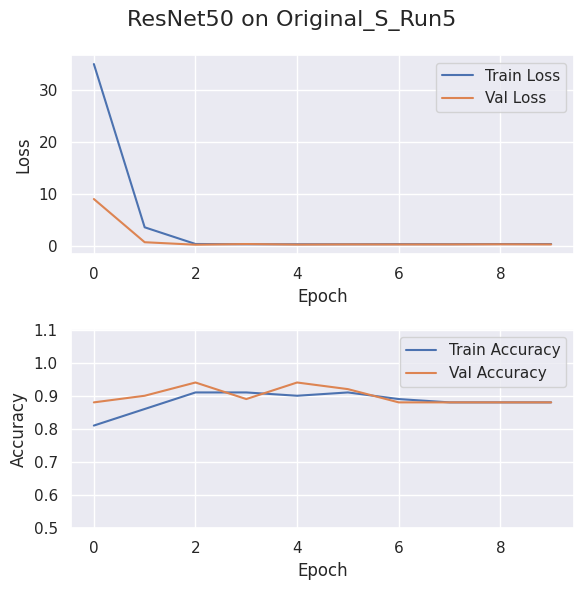

Testing on Dataset 1
13/13 [==============================] - 2s 124ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.3351, 'Test Accuracy': 0.7512, 'F1 Score': 0.64, 'Sensitivity (Recall)': 0.75, 'Precision': 0.56}


/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control th

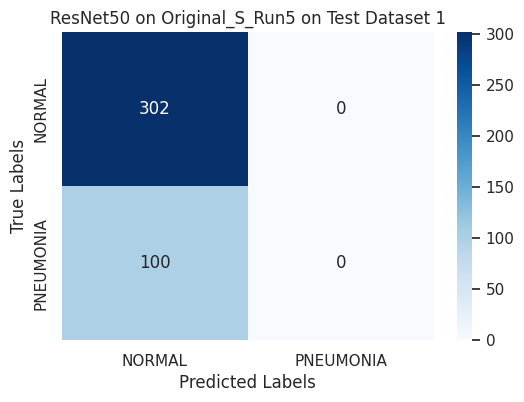

Testing on Dataset 2
13/13 [==============================] - 2s 118ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.3169, 'Test Accuracy': 0.7512, 'F1 Score': 0.64, 'Sensitivity (Recall)': 0.75, 'Precision': 0.56}


/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control th

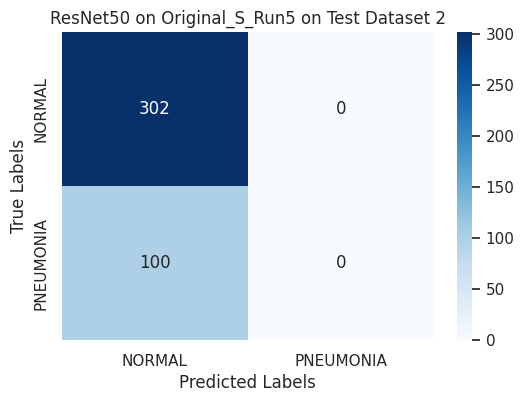

Testing on Dataset 3
13/13 [==============================] - 2s 120ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.3227, 'Test Accuracy': 0.7512, 'F1 Score': 0.64, 'Sensitivity (Recall)': 0.75, 'Precision': 0.56}


/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control th

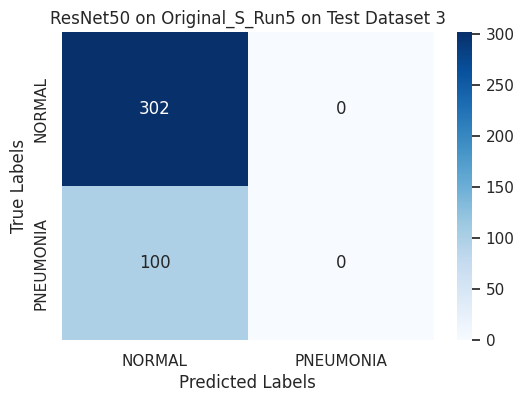

In [5]:
title = "ResNet50 on Original_S"
file_name = "Trained_Models/ResNet50_training_history_plot_original_S.png"

for i in range(0, 5):
    trained_model, test_metrics, confusion_matrix = imbalanced_cv_train_and_evaluate_model(
        dataset_dir_org, 
        test_dataset_dir1, 
        test_dataset_dir2, 
        test_dataset_dir3, 
        class_labels,  
        resnet_model, 
        weights=None,
        input_shape= input_shape, 
        title=f"{title}_Run{i+1}", 
        file_name=file_name,  # Now treated as a keyword argument
        cv=cv, 
        epochs=epochs, 
        batch_size=batch_size
    )

#### Train on Mixed DDPM Dataset


Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 21s 199ms/step - loss: 13.5005 - accuracy: 0.7939 - val_loss: 0.2343 - val_accuracy: 0.9162
Epoch 2/10
93/93 [==============================] - 17s 188ms/step - loss: 0.3446 - accuracy: 0.9024 - val_loss: 0.1886 - val_accuracy: 0.9176
Epoch 3/10
93/93 [==============================] - 17s 186ms/step - loss: 0.2281 - accuracy: 0.9095 - val_loss: 0.1377 - val_accuracy: 0.9405
Epoch 4/10
93/93 [==============================] - 18s 190ms/step - loss: 0.3092 - accuracy: 0.8770 - val_loss: 0.1152 - val_accuracy: 0.9649
Epoch 5/10
93/93 [==============================] - 18s 191ms/step - loss: 0.3151 - accuracy: 0.8253 - val_loss: 0.2130 - val_accuracy: 0.9135
Epoch 6/10
93/93 [==============================] - 18s 191ms/step - loss: 0.3409 - accuracy: 0.7811 - val_loss: 0.1076 - val_accuracy: 0.9622
Epoch 7/10
93/93 [==============================] - 18s 190ms/step - loss: 0.4028 - accuracy: 0.7297 - 

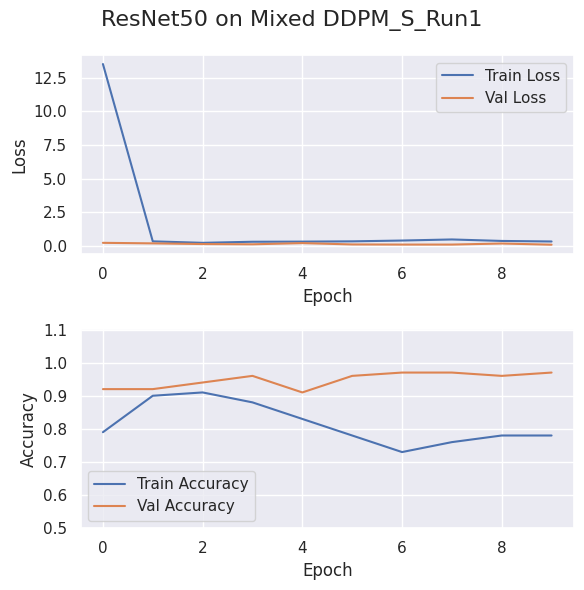

Testing on Dataset 1
13/13 [==============================] - 2s 120ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.1861, 'Test Accuracy': 0.9378, 'F1 Score': 0.94, 'Sensitivity (Recall)': 0.94, 'Precision': 0.94}


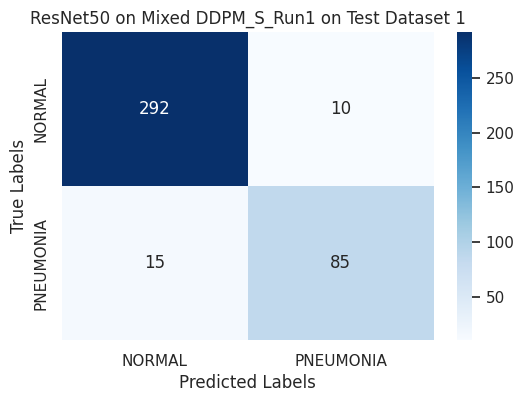

Testing on Dataset 2
13/13 [==============================] - 2s 118ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.1542, 'Test Accuracy': 0.9453, 'F1 Score': 0.95, 'Sensitivity (Recall)': 0.95, 'Precision': 0.94}


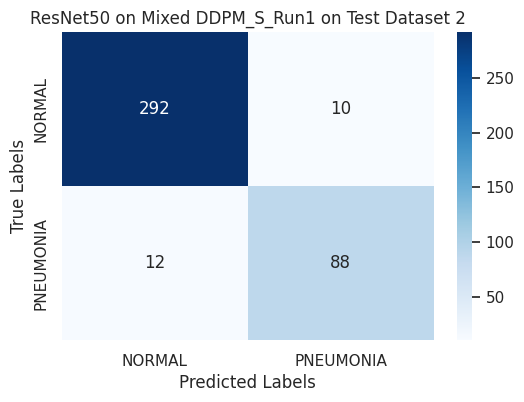

Testing on Dataset 3
13/13 [==============================] - 2s 118ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.1561, 'Test Accuracy': 0.9403, 'F1 Score': 0.94, 'Sensitivity (Recall)': 0.94, 'Precision': 0.94}


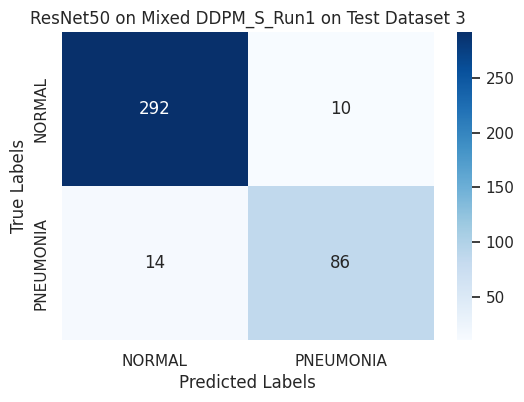

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 21s 197ms/step - loss: 17.5823 - accuracy: 0.7568 - val_loss: 0.2058 - val_accuracy: 0.9284
Epoch 2/10
93/93 [==============================] - 17s 187ms/step - loss: 0.2906 - accuracy: 0.8764 - val_loss: 0.2396 - val_accuracy: 0.8932
Epoch 3/10
93/93 [==============================] - 17s 187ms/step - loss: 0.2411 - accuracy: 0.8828 - val_loss: 0.1509 - val_accuracy: 0.9527
Epoch 4/10
93/93 [==============================] - 17s 187ms/step - loss: 0.3638 - accuracy: 0.8611 - val_loss: 0.1221 - val_accuracy: 0.9527
Epoch 5/10
93/93 [==============================] - 17s 187ms/step - loss: 0.2764 - accuracy: 0.8480 - val_loss: 0.1294 - val_accuracy: 0.9554
Epoch 6/10
93/93 [==============================] - 17s 186ms/step - loss: 0.2504 - accuracy: 0.8439 - val_loss: 0.0906 - val_accuracy: 0.9689
Epoch 7/10
93/93 [==============================] - 17s 188ms/step - loss: 0.2813 - accuracy: 0.8503 - 

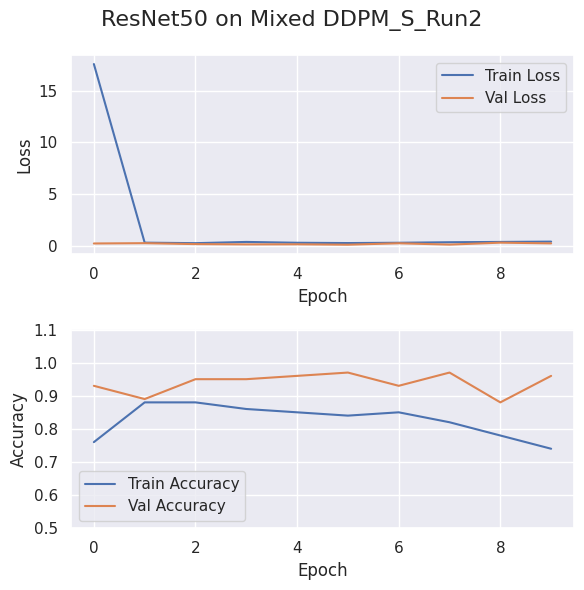

Testing on Dataset 1
13/13 [==============================] - 2s 121ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2779, 'Test Accuracy': 0.9353, 'F1 Score': 0.93, 'Sensitivity (Recall)': 0.94, 'Precision': 0.94}


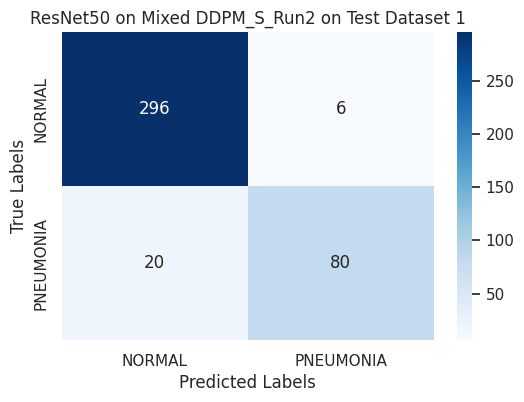

Testing on Dataset 2
13/13 [==============================] - 2s 121ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.2569, 'Test Accuracy': 0.9353, 'F1 Score': 0.93, 'Sensitivity (Recall)': 0.94, 'Precision': 0.94}


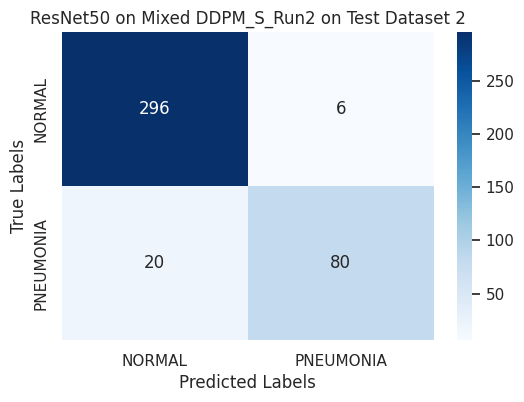

Testing on Dataset 3
13/13 [==============================] - 2s 117ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.2604, 'Test Accuracy': 0.9502, 'F1 Score': 0.95, 'Sensitivity (Recall)': 0.95, 'Precision': 0.95}


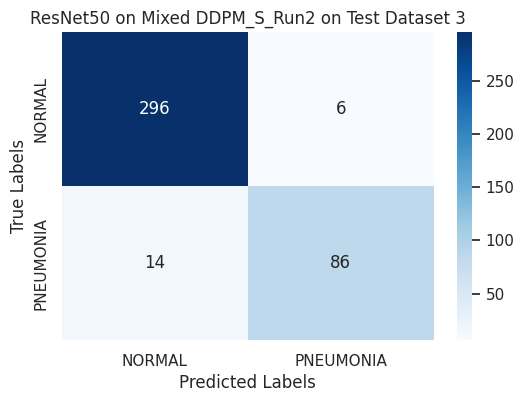

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 21s 196ms/step - loss: 12.8785 - accuracy: 0.7480 - val_loss: 0.2097 - val_accuracy: 0.9189
Epoch 2/10
93/93 [==============================] - 17s 188ms/step - loss: 0.3317 - accuracy: 0.8642 - val_loss: 0.3322 - val_accuracy: 0.8716
Epoch 3/10
93/93 [==============================] - 18s 189ms/step - loss: 0.4949 - accuracy: 0.8405 - val_loss: 0.2497 - val_accuracy: 0.8851
Epoch 4/10
93/93 [==============================] - 18s 189ms/step - loss: 0.3406 - accuracy: 0.7912 - val_loss: 0.2108 - val_accuracy: 0.9351
Epoch 5/10
93/93 [==============================] - 18s 189ms/step - loss: 0.3460 - accuracy: 0.7932 - val_loss: 0.1388 - val_accuracy: 0.9662
Epoch 6/10
93/93 [==============================] - 17s 188ms/step - loss: 0.4268 - accuracy: 0.7159 - val_loss: 0.2284 - val_accuracy: 0.9635
Epoch 7/10
93/93 [==============================] - 17s 188ms/step - loss: 0.3893 - accuracy: 0.8142 - 

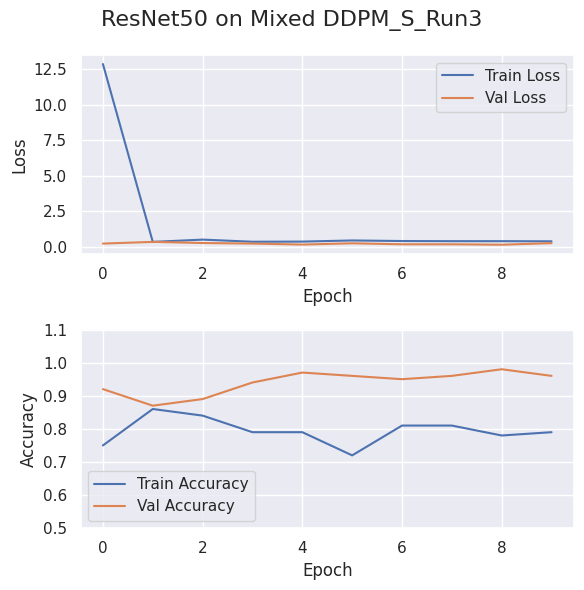

Testing on Dataset 1
13/13 [==============================] - 2s 119ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2759, 'Test Accuracy': 0.9303, 'F1 Score': 0.93, 'Sensitivity (Recall)': 0.93, 'Precision': 0.93}


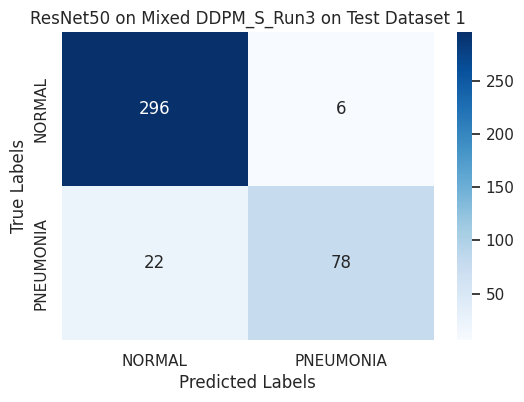

Testing on Dataset 2
13/13 [==============================] - 2s 119ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.2537, 'Test Accuracy': 0.9527, 'F1 Score': 0.95, 'Sensitivity (Recall)': 0.95, 'Precision': 0.95}


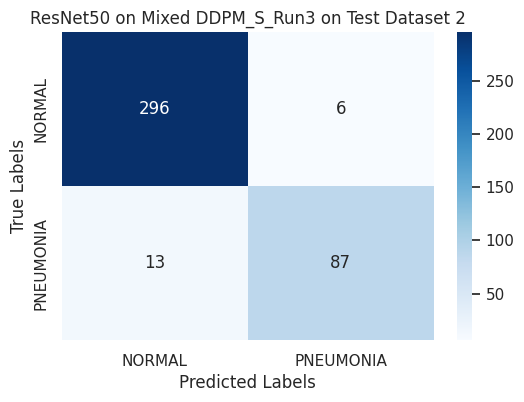

Testing on Dataset 3
13/13 [==============================] - 2s 120ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.2561, 'Test Accuracy': 0.9453, 'F1 Score': 0.94, 'Sensitivity (Recall)': 0.95, 'Precision': 0.94}


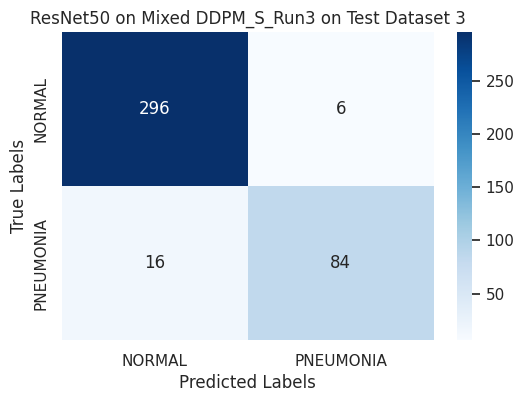

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 21s 197ms/step - loss: 15.0583 - accuracy: 0.7622 - val_loss: 0.2036 - val_accuracy: 0.9162
Epoch 2/10
93/93 [==============================] - 17s 185ms/step - loss: 0.2777 - accuracy: 0.8878 - val_loss: 0.1433 - val_accuracy: 0.9378
Epoch 3/10
93/93 [==============================] - 17s 187ms/step - loss: 0.2401 - accuracy: 0.8872 - val_loss: 0.1274 - val_accuracy: 0.9622
Epoch 4/10
93/93 [==============================] - 18s 189ms/step - loss: 0.2718 - accuracy: 0.8797 - val_loss: 0.1302 - val_accuracy: 0.9541
Epoch 5/10
93/93 [==============================] - 17s 186ms/step - loss: 0.3621 - accuracy: 0.8253 - val_loss: 0.1368 - val_accuracy: 0.9595
Epoch 6/10
93/93 [==============================] - 17s 187ms/step - loss: 0.3576 - accuracy: 0.7689 - val_loss: 0.3479 - val_accuracy: 0.8500
Epoch 7/10
93/93 [==============================] - 17s 187ms/step - loss: 0.4071 - accuracy: 0.7635 - 

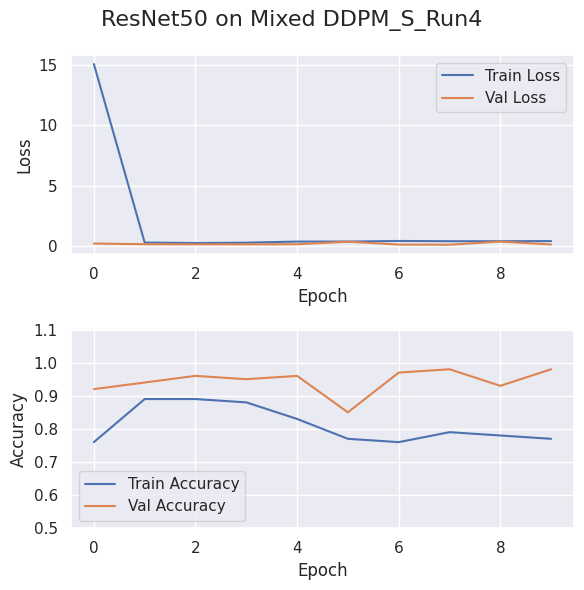

Testing on Dataset 1
13/13 [==============================] - 2s 119ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2284, 'Test Accuracy': 0.9353, 'F1 Score': 0.93, 'Sensitivity (Recall)': 0.94, 'Precision': 0.93}


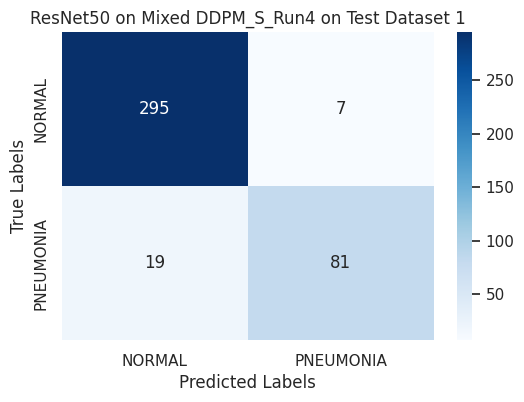

Testing on Dataset 2
13/13 [==============================] - 2s 117ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.206, 'Test Accuracy': 0.9478, 'F1 Score': 0.95, 'Sensitivity (Recall)': 0.95, 'Precision': 0.95}


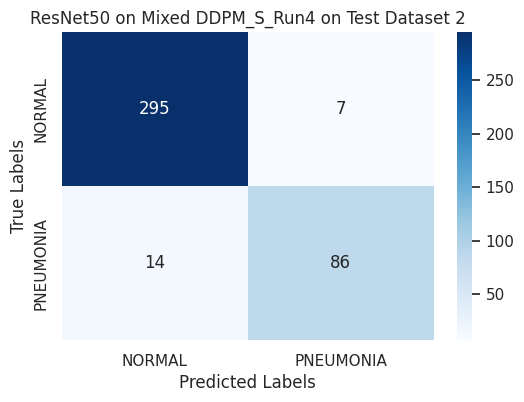

Testing on Dataset 3
13/13 [==============================] - 2s 118ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.2121, 'Test Accuracy': 0.9378, 'F1 Score': 0.94, 'Sensitivity (Recall)': 0.94, 'Precision': 0.94}


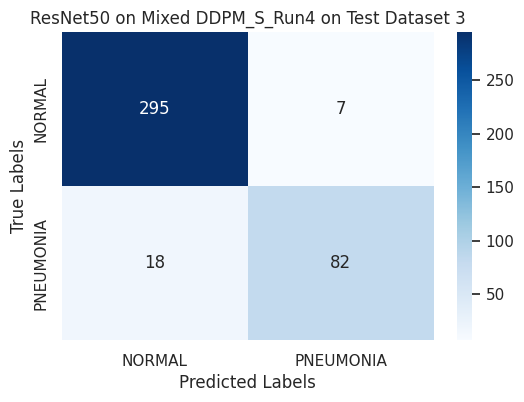

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 22s 197ms/step - loss: 12.3421 - accuracy: 0.7500 - val_loss: 0.2545 - val_accuracy: 0.9122
Epoch 2/10
93/93 [==============================] - 17s 187ms/step - loss: 0.3953 - accuracy: 0.8432 - val_loss: 0.2953 - val_accuracy: 0.8730
Epoch 3/10
93/93 [==============================] - 17s 186ms/step - loss: 0.3686 - accuracy: 0.7926 - val_loss: 0.2076 - val_accuracy: 0.9527
Epoch 4/10
93/93 [==============================] - 17s 187ms/step - loss: 0.4285 - accuracy: 0.7824 - val_loss: 0.1874 - val_accuracy: 0.9581
Epoch 5/10
93/93 [==============================] - 17s 187ms/step - loss: 0.3997 - accuracy: 0.7091 - val_loss: 0.1365 - val_accuracy: 0.9649
Epoch 6/10
93/93 [==============================] - 17s 188ms/step - loss: 0.3709 - accuracy: 0.7801 - val_loss: 0.1679 - val_accuracy: 0.9324
Epoch 7/10
93/93 [==============================] - 18s 191ms/step - loss: 0.4838 - accuracy: 0.7706 - 

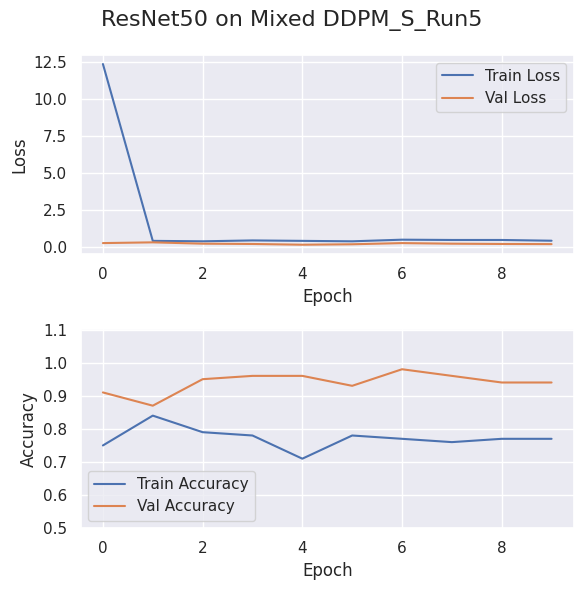

Testing on Dataset 1
13/13 [==============================] - 2s 120ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.3416, 'Test Accuracy': 0.8706, 'F1 Score': 0.88, 'Sensitivity (Recall)': 0.87, 'Precision': 0.9}


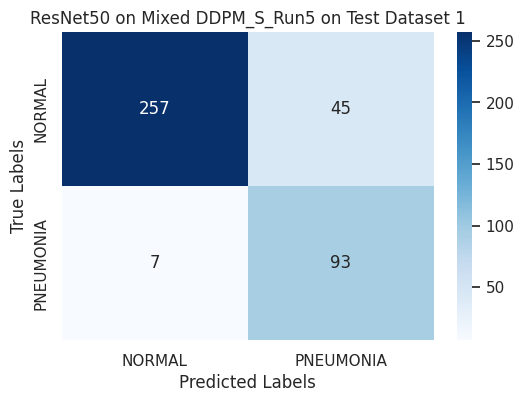

Testing on Dataset 2
13/13 [==============================] - 2s 122ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.3284, 'Test Accuracy': 0.8856, 'F1 Score': 0.89, 'Sensitivity (Recall)': 0.89, 'Precision': 0.92}


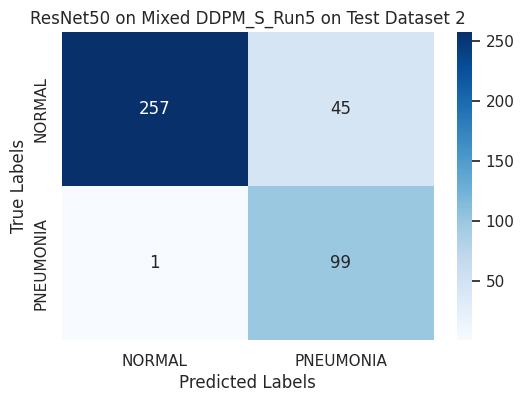

Testing on Dataset 3
13/13 [==============================] - 2s 116ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.3319, 'Test Accuracy': 0.8756, 'F1 Score': 0.88, 'Sensitivity (Recall)': 0.88, 'Precision': 0.91}


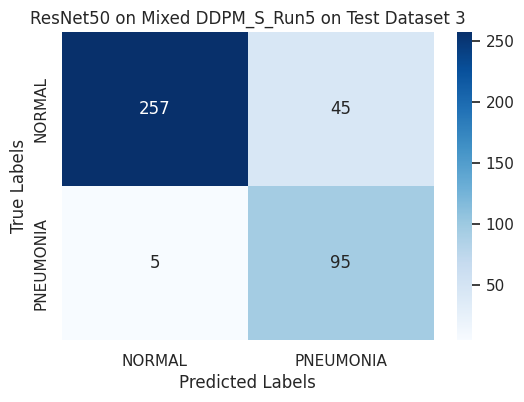

In [6]:
title = "ResNet50 on Mixed DDPM_S" 
file_name = "Trained_Models/ResNet50_training_history_plot_Mixed_DDPM_S.png"

for i in range(0, 5):
    trained_model, test_metrics, confusion_matrix = imbalanced_cv_train_and_evaluate_model(
        dataset_dir_ddpm, 
        test_dataset_dir1, 
        test_dataset_dir2, 
        test_dataset_dir3, 
        class_labels,  
        resnet_model, 
        weights=None,
        input_shape= input_shape, 
        title=f"{title}_Run{i+1}", 
        file_name=file_name,  # Now treated as a keyword argument
        cv=cv, 
        epochs=epochs, 
        batch_size=batch_size
    )

#### Train on Mixed PGGANs150k Dataset

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
92/92 [==============================] - 21s 198ms/step - loss: 10.4599 - accuracy: 0.8003 - val_loss: 0.8643 - val_accuracy: 0.9097
Epoch 2/10
92/92 [==============================] - 17s 180ms/step - loss: 0.4407 - accuracy: 0.9162 - val_loss: 0.4261 - val_accuracy: 0.8919
Epoch 3/10
92/92 [==============================] - 17s 182ms/step - loss: 0.2829 - accuracy: 0.9186 - val_loss: 0.1838 - val_accuracy: 0.9576
Epoch 4/10
92/92 [==============================] - 17s 182ms/step - loss: 0.2672 - accuracy: 0.8529 - val_loss: 0.1346 - val_accuracy: 0.9603
Epoch 5/10
92/92 [==============================] - 17s 183ms/step - loss: 0.3156 - accuracy: 0.8307 - val_loss: 0.2605 - val_accuracy: 0.8810
Epoch 6/10
92/92 [==============================] - 17s 183ms/step - loss: 0.2984 - accuracy: 0.8464 - val_loss: 0.1831 - val_accuracy: 0.9644
Epoch 7/10
92/92 [==============================] - 17s 184ms/step - loss: 0.3160 - accuracy: 0.8269 - 

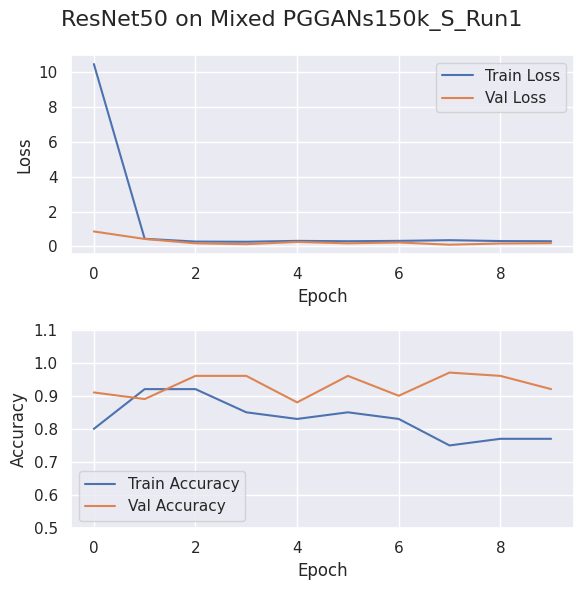

Testing on Dataset 1
13/13 [==============================] - 2s 115ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.4431, 'Test Accuracy': 0.8557, 'F1 Score': 0.86, 'Sensitivity (Recall)': 0.86, 'Precision': 0.88}


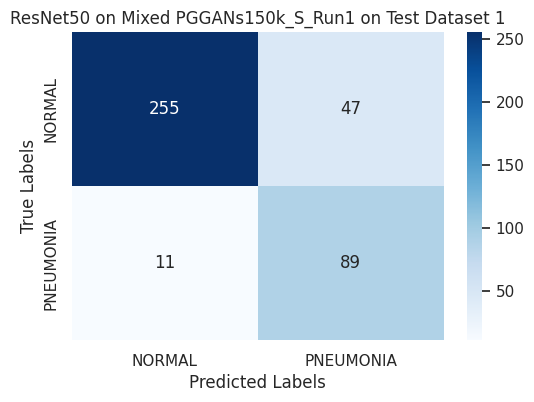

Testing on Dataset 2
13/13 [==============================] - 2s 114ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.4299, 'Test Accuracy': 0.8682, 'F1 Score': 0.87, 'Sensitivity (Recall)': 0.87, 'Precision': 0.9}


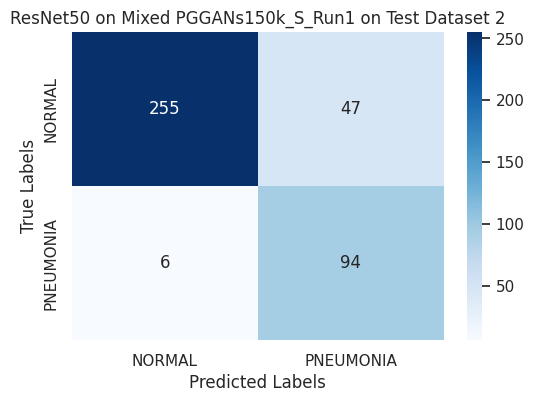

Testing on Dataset 3
13/13 [==============================] - 2s 113ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.4296, 'Test Accuracy': 0.8582, 'F1 Score': 0.86, 'Sensitivity (Recall)': 0.86, 'Precision': 0.89}


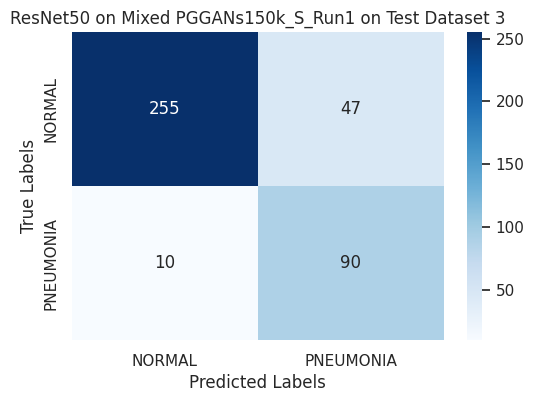

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
92/92 [==============================] - 20s 193ms/step - loss: 10.9876 - accuracy: 0.7900 - val_loss: 0.1857 - val_accuracy: 0.9371
Epoch 2/10
92/92 [==============================] - 17s 181ms/step - loss: 0.2161 - accuracy: 0.8977 - val_loss: 0.1813 - val_accuracy: 0.9453
Epoch 3/10
92/92 [==============================] - 17s 182ms/step - loss: 0.3657 - accuracy: 0.8348 - val_loss: 0.1389 - val_accuracy: 0.9562
Epoch 4/10
92/92 [==============================] - 17s 184ms/step - loss: 0.2890 - accuracy: 0.8516 - val_loss: 0.1380 - val_accuracy: 0.9644
Epoch 5/10
92/92 [==============================] - 17s 183ms/step - loss: 0.2905 - accuracy: 0.8358 - val_loss: 0.2314 - val_accuracy: 0.9029
Epoch 6/10
92/92 [==============================] - 17s 184ms/step - loss: 0.3290 - accuracy: 0.7808 - val_loss: 0.1289 - val_accuracy: 0.9754
Epoch 7/10
92/92 [==============================] - 17s 183ms/step - loss: 0.3423 - accuracy: 0.7606 - 

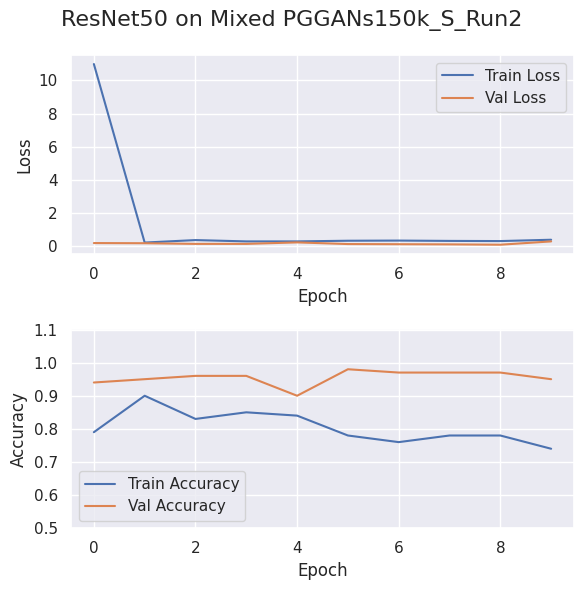

Testing on Dataset 1
13/13 [==============================] - 2s 114ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.3842, 'Test Accuracy': 0.8731, 'F1 Score': 0.88, 'Sensitivity (Recall)': 0.87, 'Precision': 0.89}


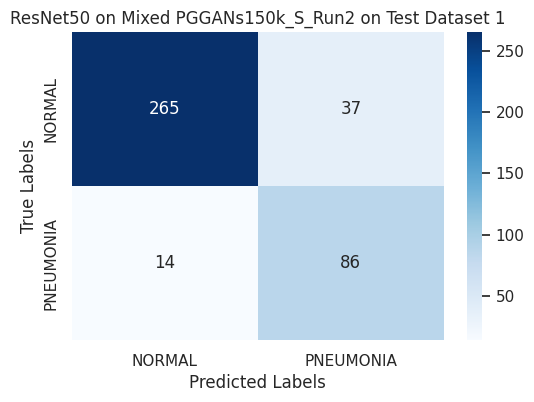

Testing on Dataset 2
13/13 [==============================] - 2s 114ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.3758, 'Test Accuracy': 0.8955, 'F1 Score': 0.9, 'Sensitivity (Recall)': 0.9, 'Precision': 0.92}


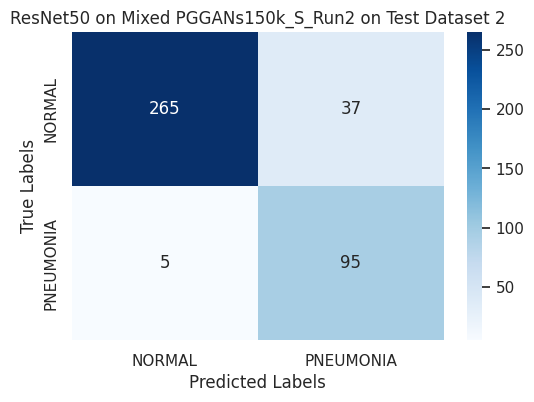

Testing on Dataset 3
13/13 [==============================] - 2s 115ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.3788, 'Test Accuracy': 0.8881, 'F1 Score': 0.89, 'Sensitivity (Recall)': 0.89, 'Precision': 0.91}


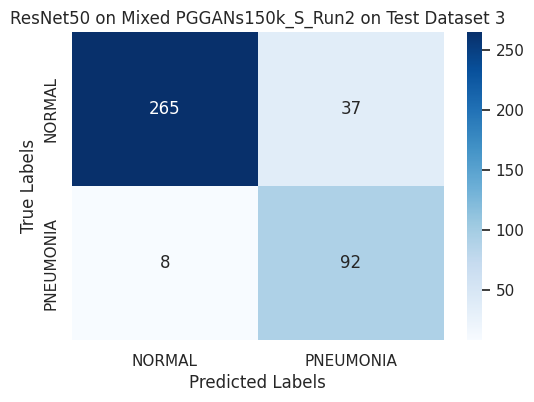

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
92/92 [==============================] - 21s 194ms/step - loss: 8.5982 - accuracy: 0.8269 - val_loss: 0.1751 - val_accuracy: 0.9425
Epoch 2/10
92/92 [==============================] - 17s 184ms/step - loss: 0.3328 - accuracy: 0.8622 - val_loss: 0.1798 - val_accuracy: 0.9576
Epoch 3/10
92/92 [==============================] - 17s 184ms/step - loss: 0.3472 - accuracy: 0.8502 - val_loss: 0.1177 - val_accuracy: 0.9644
Epoch 4/10
92/92 [==============================] - 17s 187ms/step - loss: 0.3082 - accuracy: 0.8601 - val_loss: 0.1506 - val_accuracy: 0.9631
Epoch 5/10
92/92 [==============================] - 17s 187ms/step - loss: 0.3255 - accuracy: 0.8601 - val_loss: 0.1705 - val_accuracy: 0.9357
Epoch 6/10
92/92 [==============================] - 17s 188ms/step - loss: 0.3238 - accuracy: 0.8653 - val_loss: 0.2269 - val_accuracy: 0.9535
Epoch 7/10
92/92 [==============================] - 17s 186ms/step - loss: 0.3381 - accuracy: 0.8512 - v

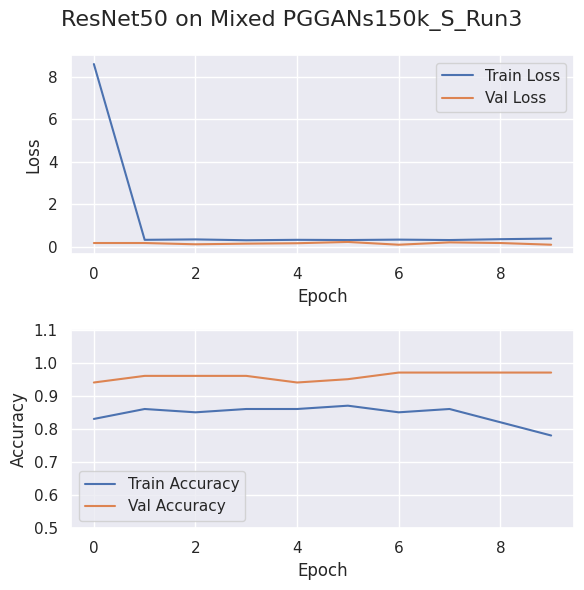

Testing on Dataset 1
13/13 [==============================] - 2s 117ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2927, 'Test Accuracy': 0.8756, 'F1 Score': 0.87, 'Sensitivity (Recall)': 0.88, 'Precision': 0.88}


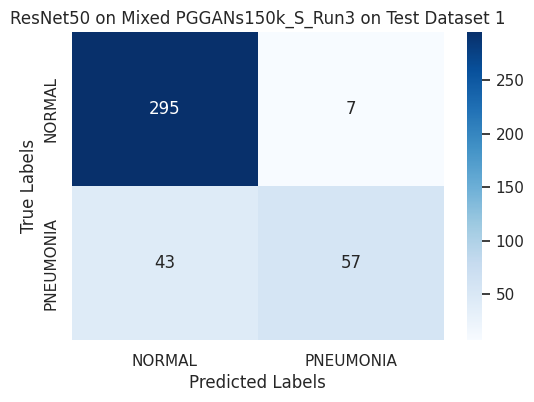

Testing on Dataset 2
13/13 [==============================] - 2s 115ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.2598, 'Test Accuracy': 0.8706, 'F1 Score': 0.86, 'Sensitivity (Recall)': 0.87, 'Precision': 0.87}


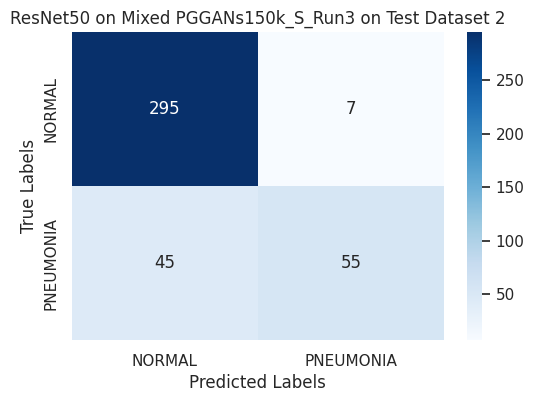

Testing on Dataset 3
13/13 [==============================] - 2s 114ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.2583, 'Test Accuracy': 0.8831, 'F1 Score': 0.87, 'Sensitivity (Recall)': 0.88, 'Precision': 0.88}


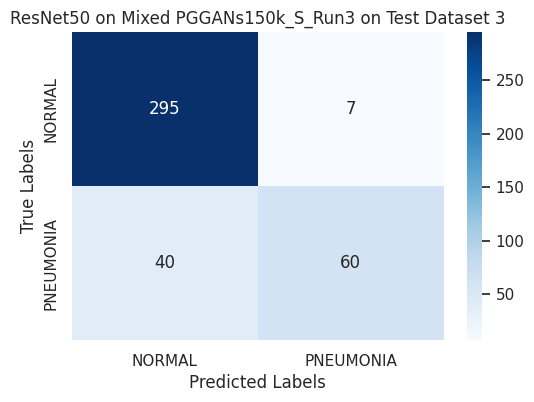

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
92/92 [==============================] - 20s 190ms/step - loss: 12.1372 - accuracy: 0.7155 - val_loss: 0.2799 - val_accuracy: 0.9015
Epoch 2/10
92/92 [==============================] - 16s 179ms/step - loss: 0.3876 - accuracy: 0.7432 - val_loss: 0.2430 - val_accuracy: 0.9398
Epoch 3/10
92/92 [==============================] - 16s 179ms/step - loss: 0.3824 - accuracy: 0.7514 - val_loss: 0.1642 - val_accuracy: 0.9508
Epoch 4/10
92/92 [==============================] - 17s 181ms/step - loss: 0.3783 - accuracy: 0.7377 - val_loss: 0.1708 - val_accuracy: 0.9371
Epoch 5/10
92/92 [==============================] - 17s 181ms/step - loss: 0.3272 - accuracy: 0.8194 - val_loss: 0.1761 - val_accuracy: 0.9289
Epoch 6/10
92/92 [==============================] - 17s 181ms/step - loss: 0.3196 - accuracy: 0.8256 - val_loss: 0.2552 - val_accuracy: 0.9193
Epoch 7/10
92/92 [==============================] - 17s 181ms/step - loss: 0.3184 - accuracy: 0.8187 - 

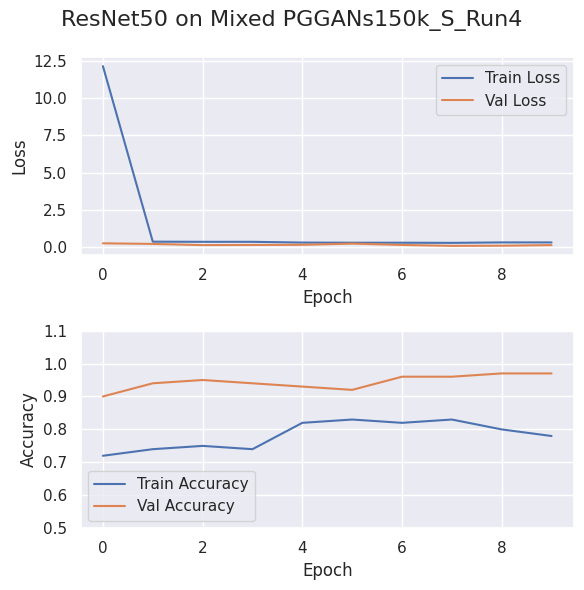

Testing on Dataset 1
13/13 [==============================] - 2s 116ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.3716, 'Test Accuracy': 0.8557, 'F1 Score': 0.84, 'Sensitivity (Recall)': 0.86, 'Precision': 0.86}


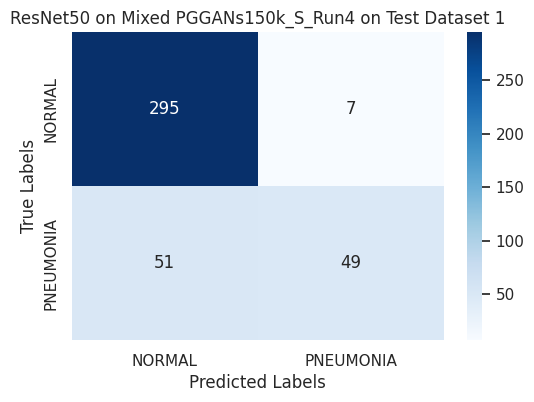

Testing on Dataset 2
13/13 [==============================] - 2s 119ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.365, 'Test Accuracy': 0.8557, 'F1 Score': 0.84, 'Sensitivity (Recall)': 0.86, 'Precision': 0.86}


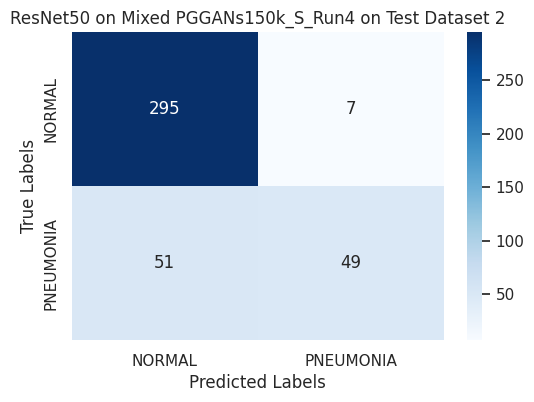

Testing on Dataset 3
13/13 [==============================] - 2s 114ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.3586, 'Test Accuracy': 0.8706, 'F1 Score': 0.86, 'Sensitivity (Recall)': 0.87, 'Precision': 0.87}


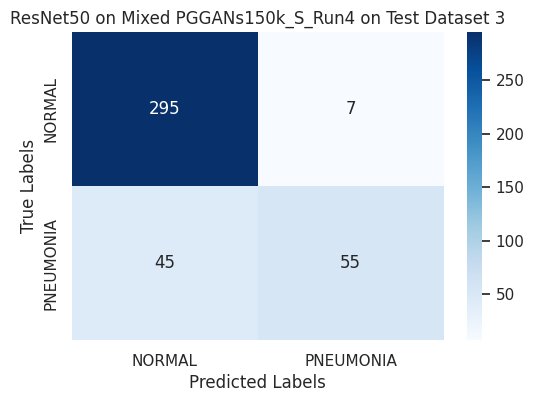

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
92/92 [==============================] - 20s 191ms/step - loss: 16.2637 - accuracy: 0.7965 - val_loss: 0.1604 - val_accuracy: 0.9412
Epoch 2/10
92/92 [==============================] - 16s 179ms/step - loss: 0.2713 - accuracy: 0.9012 - val_loss: 0.1293 - val_accuracy: 0.9590
Epoch 3/10
92/92 [==============================] - 17s 182ms/step - loss: 0.2152 - accuracy: 0.8776 - val_loss: 0.1239 - val_accuracy: 0.9590
Epoch 4/10
92/92 [==============================] - 17s 184ms/step - loss: 0.2442 - accuracy: 0.8998 - val_loss: 0.1058 - val_accuracy: 0.9658
Epoch 5/10
92/92 [==============================] - 17s 182ms/step - loss: 0.2527 - accuracy: 0.8950 - val_loss: 0.1002 - val_accuracy: 0.9713
Epoch 6/10
92/92 [==============================] - 17s 184ms/step - loss: 0.2723 - accuracy: 0.8557 - val_loss: 0.1459 - val_accuracy: 0.9685
Epoch 7/10
92/92 [==============================] - 17s 184ms/step - loss: 0.2903 - accuracy: 0.8502 - 

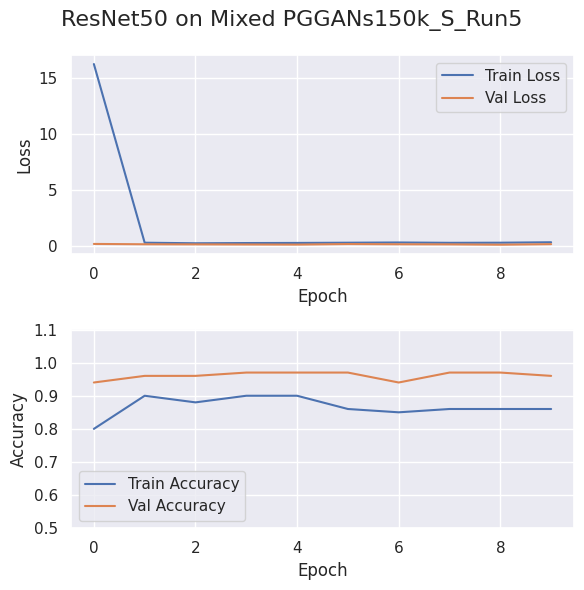

Testing on Dataset 1
13/13 [==============================] - 2s 114ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.3694, 'Test Accuracy': 0.8582, 'F1 Score': 0.84, 'Sensitivity (Recall)': 0.86, 'Precision': 0.87}


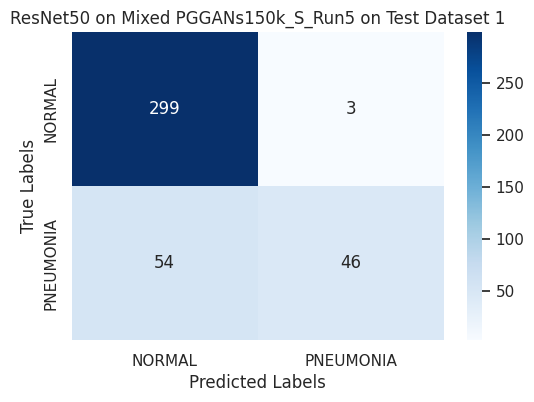

Testing on Dataset 2
13/13 [==============================] - 2s 115ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.3012, 'Test Accuracy': 0.8607, 'F1 Score': 0.84, 'Sensitivity (Recall)': 0.86, 'Precision': 0.87}


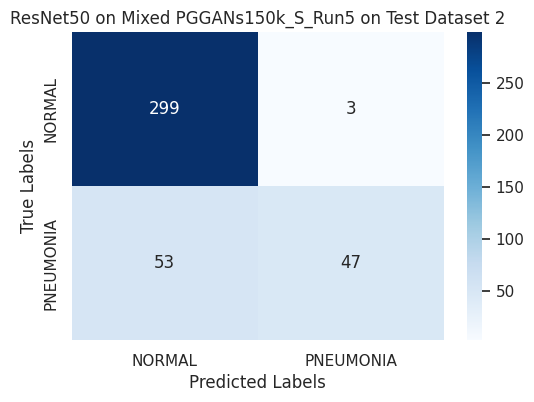

Testing on Dataset 3
13/13 [==============================] - 2s 116ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.3058, 'Test Accuracy': 0.8682, 'F1 Score': 0.85, 'Sensitivity (Recall)': 0.87, 'Precision': 0.88}


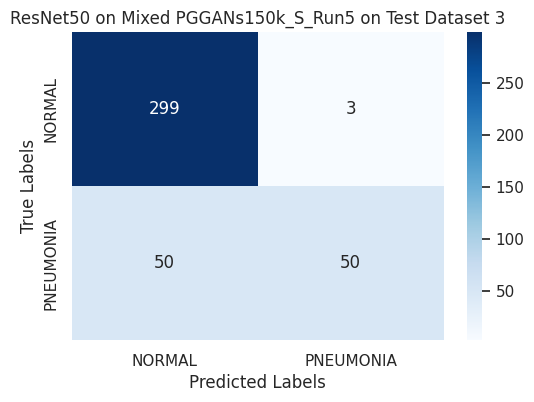

In [7]:
title = "ResNet50 on Mixed PGGANs150k_S" 
file_name = "Trained_Models/ResNet50_training_history_plot_Mixed_PGGANs150k_S.png"
  
for i in range(0, 5):
    trained_model, test_metrics, confusion_matrix = imbalanced_cv_train_and_evaluate_model(
        dataset_dir_pggans150, 
        test_dataset_dir1, 
        test_dataset_dir2, 
        test_dataset_dir3, 
        class_labels,  
        resnet_model, 
        weights=None,
        input_shape= input_shape, 
        title=f"{title}_Run{i+1}", 
        file_name=file_name,  # Now treated as a keyword argument
        cv=cv, 
        epochs=epochs, 
        batch_size=batch_size
    )

#### Train on Mixed PGGANs160k Dataset

Class labels: ['NORMAL', 'PNEUMONIA']


2024-09-10 14:03:15.465851: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:268] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected


Epoch 1/10
93/93 [==============================] - 22s 202ms/step - loss: 16.2942 - accuracy: 0.6753 - val_loss: 0.2141 - val_accuracy: 0.9311
Epoch 2/10
93/93 [==============================] - 18s 195ms/step - loss: 0.4350 - accuracy: 0.7449 - val_loss: 0.4297 - val_accuracy: 0.5946
Epoch 3/10
93/93 [==============================] - 18s 197ms/step - loss: 0.4893 - accuracy: 0.7703 - val_loss: 0.3205 - val_accuracy: 0.9568
Epoch 4/10
93/93 [==============================] - 18s 197ms/step - loss: 0.4229 - accuracy: 0.8115 - val_loss: 0.3117 - val_accuracy: 0.9486
Epoch 5/10
93/93 [==============================] - 18s 198ms/step - loss: 0.5011 - accuracy: 0.6899 - val_loss: 0.3160 - val_accuracy: 0.9676
Epoch 6/10
93/93 [==============================] - 18s 199ms/step - loss: 0.5027 - accuracy: 0.6895 - val_loss: 0.3302 - val_accuracy: 0.9595
Epoch 7/10
93/93 [==============================] - 18s 194ms/step - loss: 0.5094 - accuracy: 0.6811 - val_loss: 0.2861 - val_accuracy: 0.947

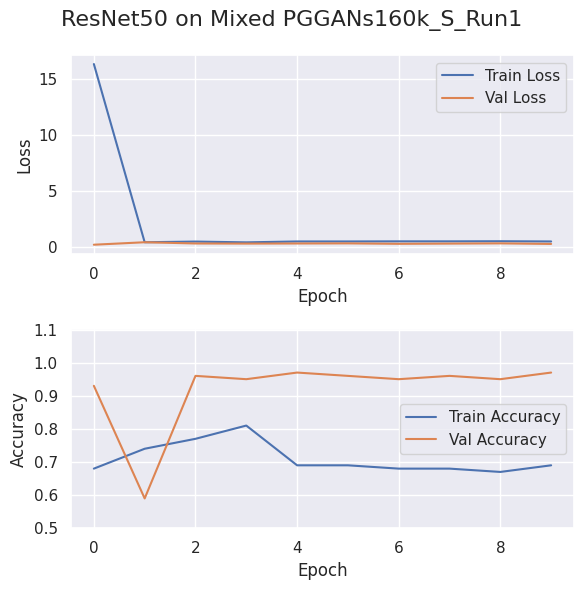

Testing on Dataset 1
13/13 [==============================] - 2s 119ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.5639, 'Test Accuracy': 0.9055, 'F1 Score': 0.9, 'Sensitivity (Recall)': 0.91, 'Precision': 0.91}


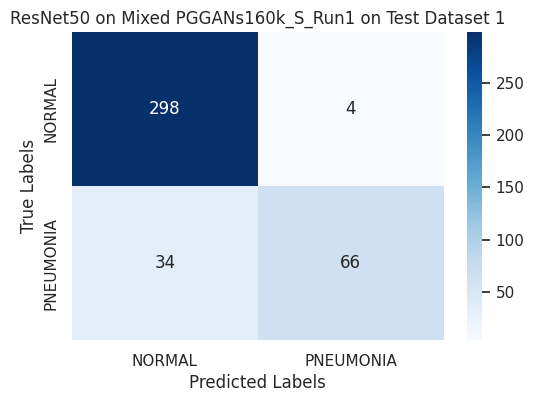

Testing on Dataset 2
13/13 [==============================] - 2s 116ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.5575, 'Test Accuracy': 0.9104, 'F1 Score': 0.91, 'Sensitivity (Recall)': 0.91, 'Precision': 0.91}


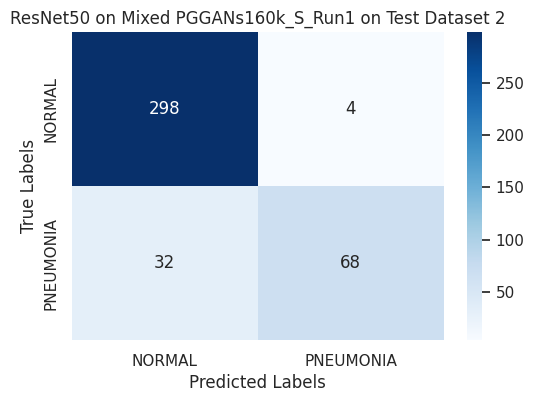

Testing on Dataset 3
13/13 [==============================] - 2s 119ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.5508, 'Test Accuracy': 0.9229, 'F1 Score': 0.92, 'Sensitivity (Recall)': 0.92, 'Precision': 0.92}


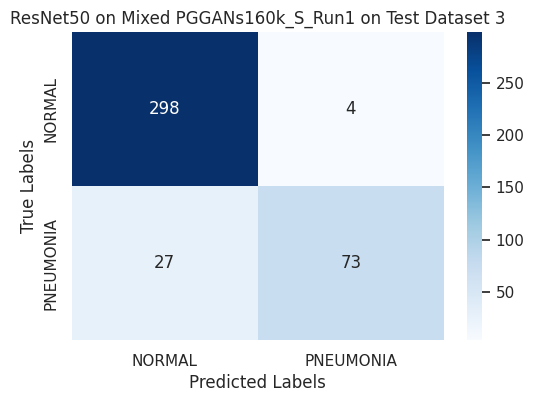

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 22s 202ms/step - loss: 12.3073 - accuracy: 0.7659 - val_loss: 0.2094 - val_accuracy: 0.9324
Epoch 2/10
93/93 [==============================] - 18s 191ms/step - loss: 0.3508 - accuracy: 0.8666 - val_loss: 0.2983 - val_accuracy: 0.8770
Epoch 3/10
93/93 [==============================] - 18s 192ms/step - loss: 0.3565 - accuracy: 0.8203 - val_loss: 0.1552 - val_accuracy: 0.9581
Epoch 4/10
93/93 [==============================] - 18s 190ms/step - loss: 0.4345 - accuracy: 0.7209 - val_loss: 0.3432 - val_accuracy: 0.5973
Epoch 5/10
93/93 [==============================] - 18s 192ms/step - loss: 0.4742 - accuracy: 0.6814 - val_loss: 0.3257 - val_accuracy: 0.9595
Epoch 6/10
93/93 [==============================] - 18s 191ms/step - loss: 0.4288 - accuracy: 0.7966 - val_loss: 0.1414 - val_accuracy: 0.9514
Epoch 7/10
93/93 [==============================] - 18s 189ms/step - loss: 0.3261 - accuracy: 0.8132 - 

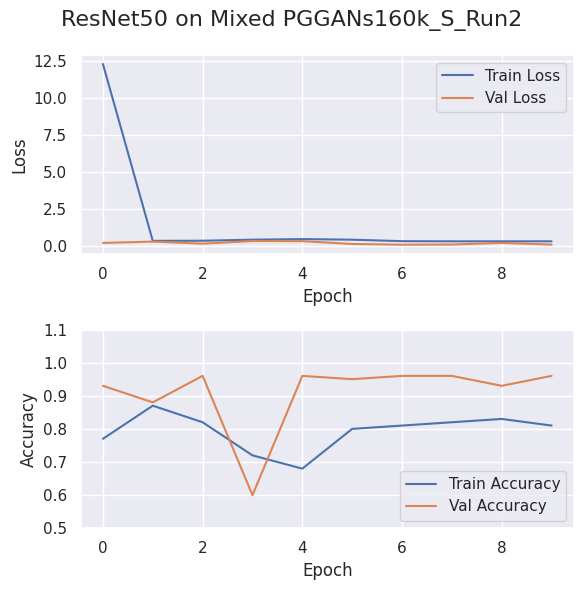

Testing on Dataset 1
13/13 [==============================] - 2s 123ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.3335, 'Test Accuracy': 0.8607, 'F1 Score': 0.84, 'Sensitivity (Recall)': 0.86, 'Precision': 0.87}


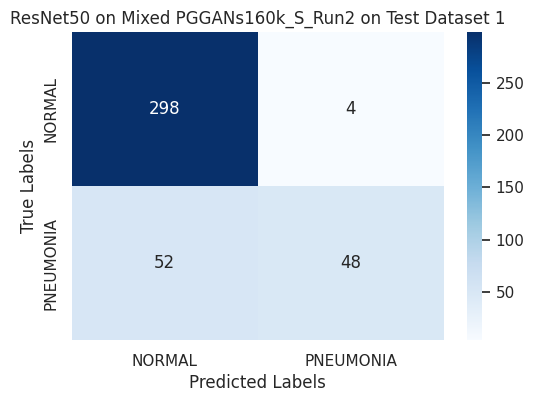

Testing on Dataset 2
13/13 [==============================] - 2s 120ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.2893, 'Test Accuracy': 0.8682, 'F1 Score': 0.85, 'Sensitivity (Recall)': 0.87, 'Precision': 0.88}


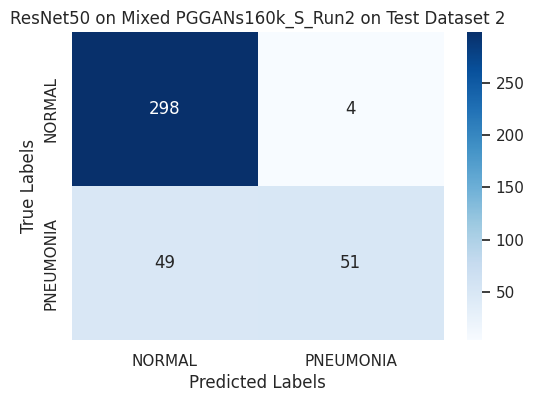

Testing on Dataset 3
13/13 [==============================] - 2s 118ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.2756, 'Test Accuracy': 0.8682, 'F1 Score': 0.85, 'Sensitivity (Recall)': 0.87, 'Precision': 0.88}


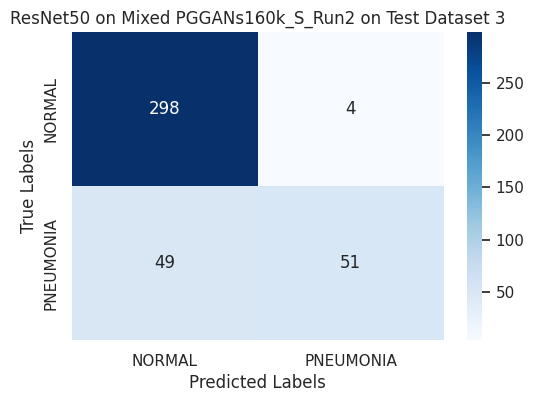

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 21s 197ms/step - loss: 17.6884 - accuracy: 0.7652 - val_loss: 0.1998 - val_accuracy: 0.9284
Epoch 2/10
93/93 [==============================] - 17s 187ms/step - loss: 0.2462 - accuracy: 0.9216 - val_loss: 0.1161 - val_accuracy: 0.9595
Epoch 3/10
93/93 [==============================] - 18s 190ms/step - loss: 0.2275 - accuracy: 0.9233 - val_loss: 0.1180 - val_accuracy: 0.9514
Epoch 4/10
93/93 [==============================] - 17s 188ms/step - loss: 0.2075 - accuracy: 0.8953 - val_loss: 0.0974 - val_accuracy: 0.9581
Epoch 5/10
93/93 [==============================] - 17s 187ms/step - loss: 0.1982 - accuracy: 0.9149 - val_loss: 0.0874 - val_accuracy: 0.9689
Epoch 6/10
93/93 [==============================] - 17s 188ms/step - loss: 0.2340 - accuracy: 0.9007 - val_loss: 0.1256 - val_accuracy: 0.9608
Epoch 7/10
93/93 [==============================] - 18s 189ms/step - loss: 0.2963 - accuracy: 0.8061 - 

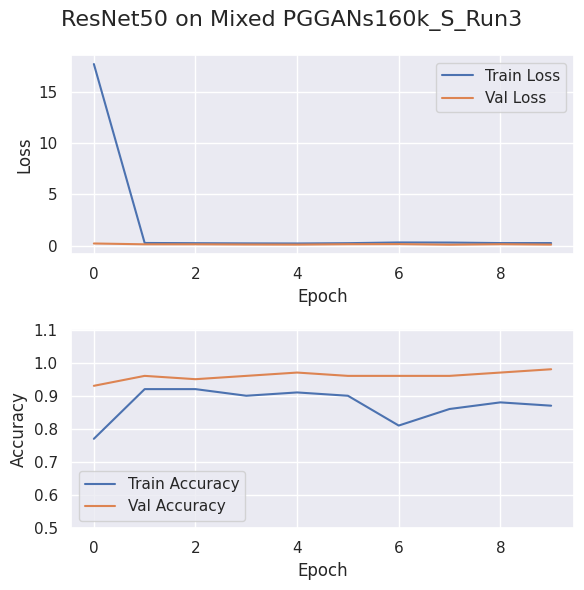

Testing on Dataset 1
13/13 [==============================] - 2s 125ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2243, 'Test Accuracy': 0.9303, 'F1 Score': 0.93, 'Sensitivity (Recall)': 0.93, 'Precision': 0.93}


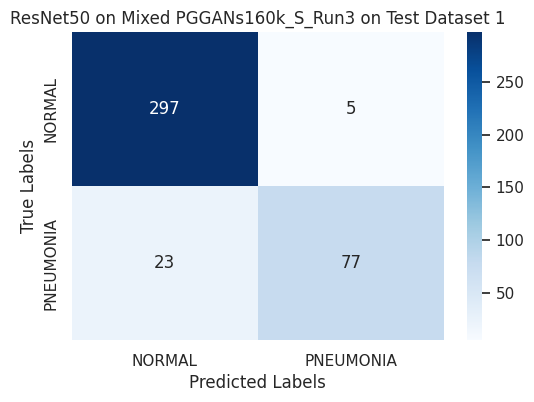

Testing on Dataset 2
13/13 [==============================] - 2s 119ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.1839, 'Test Accuracy': 0.9453, 'F1 Score': 0.94, 'Sensitivity (Recall)': 0.95, 'Precision': 0.95}


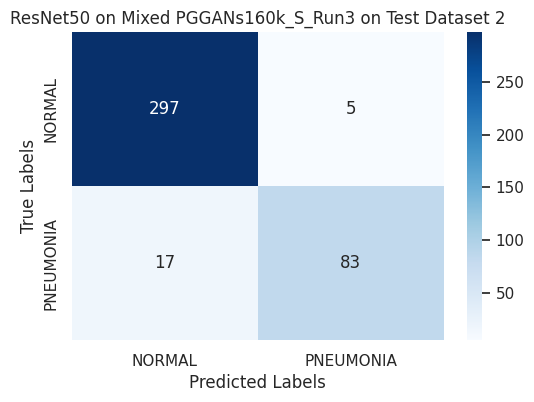

Testing on Dataset 3
13/13 [==============================] - 2s 121ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.1945, 'Test Accuracy': 0.9502, 'F1 Score': 0.95, 'Sensitivity (Recall)': 0.95, 'Precision': 0.95}


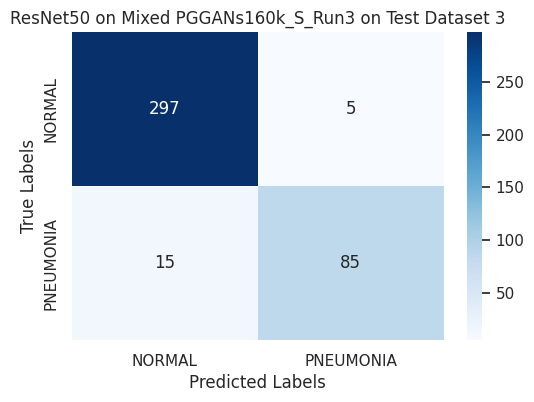

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 21s 202ms/step - loss: 13.2299 - accuracy: 0.7446 - val_loss: 0.2509 - val_accuracy: 0.9486
Epoch 2/10
93/93 [==============================] - 18s 195ms/step - loss: 0.3336 - accuracy: 0.8483 - val_loss: 0.1743 - val_accuracy: 0.9595
Epoch 3/10
93/93 [==============================] - 18s 193ms/step - loss: 0.3175 - accuracy: 0.8470 - val_loss: 0.1205 - val_accuracy: 0.9568
Epoch 4/10
93/93 [==============================] - 18s 195ms/step - loss: 0.4382 - accuracy: 0.7986 - val_loss: 0.3552 - val_accuracy: 0.9514
Epoch 5/10
93/93 [==============================] - 18s 192ms/step - loss: 0.4491 - accuracy: 0.7723 - val_loss: 0.3119 - val_accuracy: 0.8838
Epoch 6/10
93/93 [==============================] - 18s 191ms/step - loss: 0.4512 - accuracy: 0.7645 - val_loss: 0.3389 - val_accuracy: 0.9527
Epoch 7/10
93/93 [==============================] - 18s 193ms/step - loss: 0.4752 - accuracy: 0.7277 - 

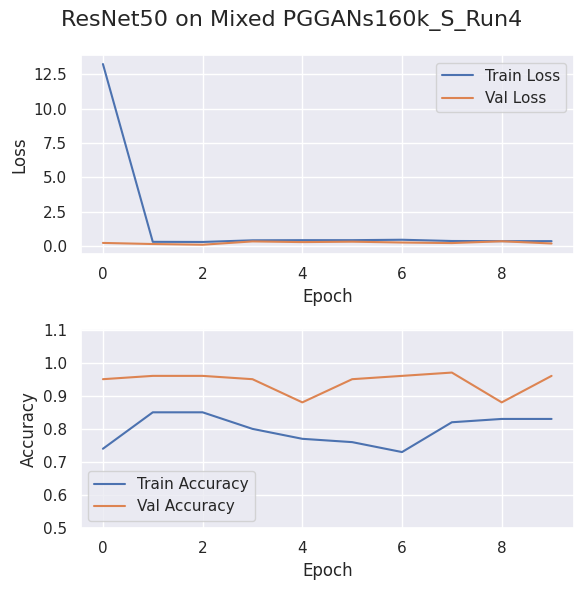

Testing on Dataset 1
13/13 [==============================] - 2s 119ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.4476, 'Test Accuracy': 0.9005, 'F1 Score': 0.9, 'Sensitivity (Recall)': 0.9, 'Precision': 0.9}


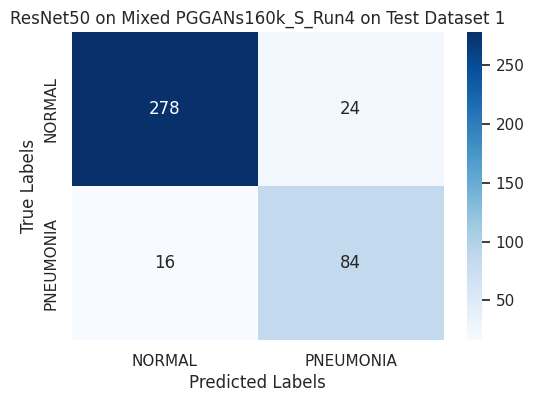

Testing on Dataset 2
13/13 [==============================] - 2s 122ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.4394, 'Test Accuracy': 0.908, 'F1 Score': 0.91, 'Sensitivity (Recall)': 0.91, 'Precision': 0.91}


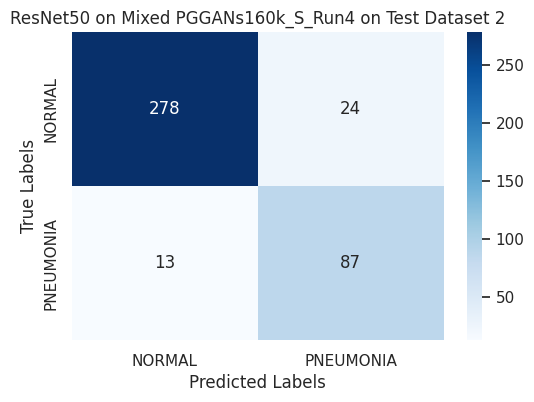

Testing on Dataset 3
13/13 [==============================] - 2s 119ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.4295, 'Test Accuracy': 0.9154, 'F1 Score': 0.92, 'Sensitivity (Recall)': 0.92, 'Precision': 0.92}


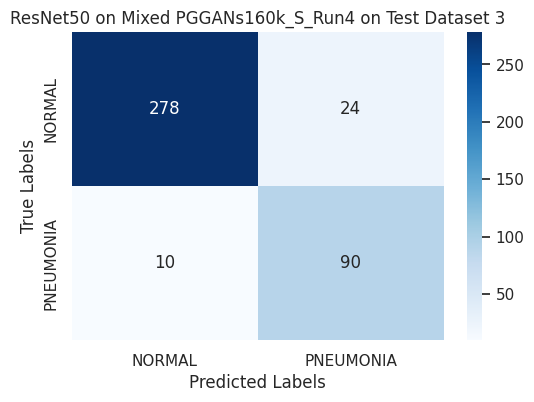

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 24s 228ms/step - loss: 13.5110 - accuracy: 0.8020 - val_loss: 0.2367 - val_accuracy: 0.9446
Epoch 2/10
93/93 [==============================] - 21s 225ms/step - loss: 0.3424 - accuracy: 0.9186 - val_loss: 0.6192 - val_accuracy: 0.8649
Epoch 3/10
93/93 [==============================] - 21s 222ms/step - loss: 0.2065 - accuracy: 0.9223 - val_loss: 0.1187 - val_accuracy: 0.9514
Epoch 4/10
93/93 [==============================] - 21s 224ms/step - loss: 0.2156 - accuracy: 0.9243 - val_loss: 0.1657 - val_accuracy: 0.9405
Epoch 5/10
93/93 [==============================] - 22s 235ms/step - loss: 0.2005 - accuracy: 0.9125 - val_loss: 0.0930 - val_accuracy: 0.9622
Epoch 6/10
93/93 [==============================] - 22s 235ms/step - loss: 0.2772 - accuracy: 0.9095 - val_loss: 0.1599 - val_accuracy: 0.9473
Epoch 7/10
93/93 [==============================] - 22s 241ms/step - loss: 0.2391 - accuracy: 0.8932 - 

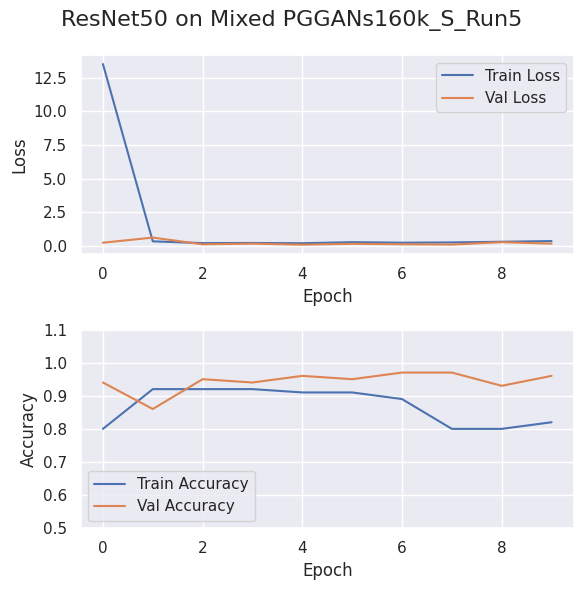

Testing on Dataset 1
13/13 [==============================] - 2s 123ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2894, 'Test Accuracy': 0.893, 'F1 Score': 0.89, 'Sensitivity (Recall)': 0.89, 'Precision': 0.89}


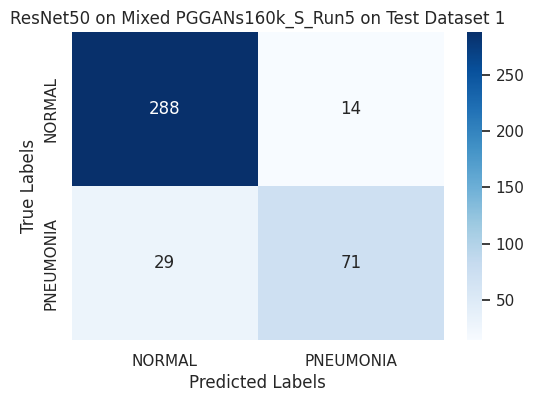

Testing on Dataset 2
13/13 [==============================] - 2s 141ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.2545, 'Test Accuracy': 0.9055, 'F1 Score': 0.9, 'Sensitivity (Recall)': 0.91, 'Precision': 0.9}


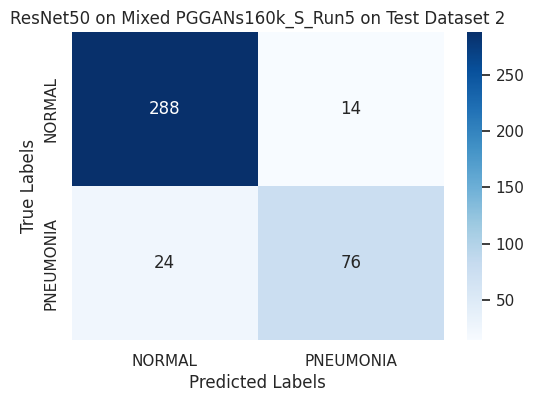

Testing on Dataset 3
13/13 [==============================] - 2s 133ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.2558, 'Test Accuracy': 0.9229, 'F1 Score': 0.92, 'Sensitivity (Recall)': 0.92, 'Precision': 0.92}


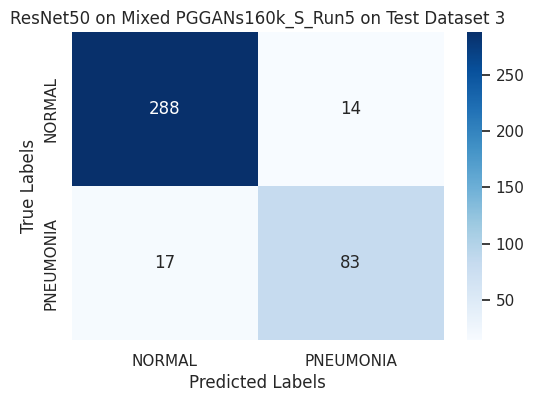

In [5]:

title = "ResNet50 on Mixed PGGANs160k_S" 
file_name = "Trained_Models/ResNet50_training_history_plot_Mixed_PGGANs160k_S.png"
  
for i in range(0, 5):
    trained_model, test_metrics, confusion_matrix = imbalanced_cv_train_and_evaluate_model(
        dataset_dir_pggans160, 
        test_dataset_dir1, 
        test_dataset_dir2, 
        test_dataset_dir3, 
        class_labels,  
        resnet_model, 
        weights=None,
        input_shape= input_shape, 
        title=f"{title}_Run{i+1}", 
        file_name=file_name,  # Now treated as a keyword argument
        cv=cv, 
        epochs=epochs, 
        batch_size=batch_size
    )


# Train On Random Images

In [6]:
dataset_dir_org_rand = f'{path_dir}/Imbalanced_Data/Random_images/Original_Random'
dataset_dir_ddpm_rand = f'{path_dir}/Imbalanced_Data/Random_images/DDPM'
dataset_dir_pggans150_rand = f'{path_dir}/Imbalanced_Data/Random_images/PGGANS150'
dataset_dir_pggans160_rand = f'{path_dir}/Imbalanced_Data/Random_images/PGGANS160'
test_dataset_dir_rand = f'{path_dir}/Imbalanced_Data/Random_images/imbalanced_test'
# test_dataset_dir_rand = f'{path_dir}/Imbalanced_Data/Random_Images/balanced_test'
test_dataset_dir_rand1 = f'{path_dir}/Imbalanced_Data/Random_images/Test/dataset_1'
test_dataset_dir_rand2 = f'{path_dir}/Imbalanced_Data/Random_images/Test/dataset_2'
test_dataset_dir_rand3 = f'{path_dir}/Imbalanced_Data/Random_images/Test/dataset_3'


class_labels = sorted(os.listdir(dataset_dir_org_rand))
print('class_labels: ', class_labels)
num_classes = 2
input_shape=(128, 128, 3)

cv=1
epochs=10
batch_size=32

class_labels:  ['NORMAL', 'PNEUMONIA']


In [7]:
# import os
# import random
# import shutil

# folder_N = f'{path_dir}/Imbalanced_Data/Random_images/imbalanced_test/NORMAL'
# folder_P = f'{path_dir}/Imbalanced_Data/Random_images/imbalanced_test/PNEUMONIA'
# output_folder = f'{path_dir}/Imbalanced_Data/Random_images/Test'
# num_images_N = 300
# num_images_P = 100
# num_datasets = 3

# images_N = os.listdir(folder_N)
# selected_images_N = random.sample(images_N, num_images_N)

# images_P = os.listdir(folder_P)

# for i in range(1, num_datasets + 1):
#     # Draw 100 random images from folder B
#     selected_images_P = random.sample(images_P, num_images_P)
    
#     # Create a subfolder for each dataset
#     dataset_folder = os.path.join(output_folder, f'dataset_{i}')
#     os.makedirs(dataset_folder, exist_ok=True)
    
#     # Create subfolders A and B within the dataset folder
#     dataset_folder_A = os.path.join(dataset_folder, 'NORMAL')
#     dataset_folder_B = os.path.join(dataset_folder, 'PNEUMONIA')
#     os.makedirs(dataset_folder_A, exist_ok=True)
#     os.makedirs(dataset_folder_B, exist_ok=True)
    
#     # Copy all images from folder A to the dataset's folder A
#     for image in images_N:
#         source = os.path.join(folder_N, image)
#         destination = os.path.join(dataset_folder_A, image)
#         shutil.copy(source, destination)
    
#     # Copy selected images from folder B to the dataset's folder B
#     for image in selected_images_P:
#         source = os.path.join(folder_P, image)
#         destination = os.path.join(dataset_folder_B, image)
#         shutil.copy(source, destination)

#     print(f'Dataset {i}: {len(selected_images_N)} images from folder A and {len(selected_images_P)} images from folder B copied to {dataset_folder}')




## VGG16

### cv=1

#### Train on Original Dataset


Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
43/43 [==============================] - 15s 329ms/step - loss: 0.6818 - accuracy: 0.8397 - val_loss: 0.2987 - val_accuracy: 0.8824
Epoch 2/10
43/43 [==============================] - 14s 323ms/step - loss: 0.3044 - accuracy: 0.8824 - val_loss: 0.2701 - val_accuracy: 0.8824
Epoch 3/10
43/43 [==============================] - 14s 321ms/step - loss: 0.2859 - accuracy: 0.8838 - val_loss: 0.2399 - val_accuracy: 0.8824
Epoch 4/10
43/43 [==============================] - 14s 325ms/step - loss: 0.2586 - accuracy: 0.8882 - val_loss: 0.2180 - val_accuracy: 0.8824
Epoch 5/10
43/43 [==============================] - 14s 322ms/step - loss: 0.2509 - accuracy: 0.8897 - val_loss: 0.2256 - val_accuracy: 0.9088
Epoch 6/10
43/43 [==============================] - 14s 324ms/step - loss: 0.2251 - accuracy: 0.9000 - val_loss: 0.1966 - val_accuracy: 0.8824
Epoch 7/10
43/43 [==============================] - 14s 326ms/step - loss: 0.2209 - accuracy: 0.9125 - v

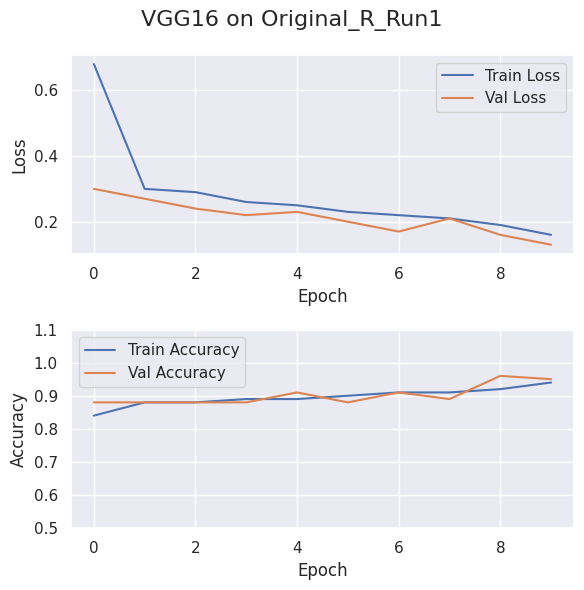

Testing on Dataset 1
13/13 [==============================] - 3s 213ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2631, 'Test Accuracy': 0.8682, 'F1 Score': 0.85, 'Sensitivity (Recall)': 0.87, 'Precision': 0.89}


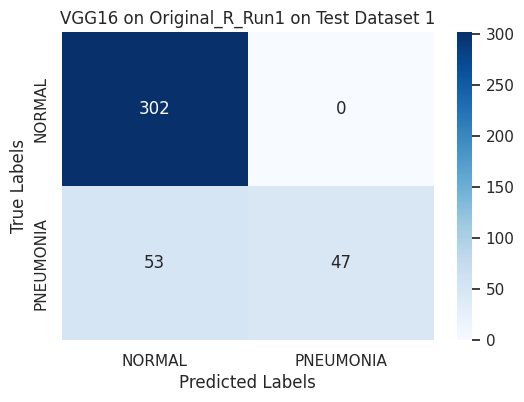

Testing on Dataset 2
13/13 [==============================] - 3s 226ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.2917, 'Test Accuracy': 0.8632, 'F1 Score': 0.84, 'Sensitivity (Recall)': 0.86, 'Precision': 0.88}


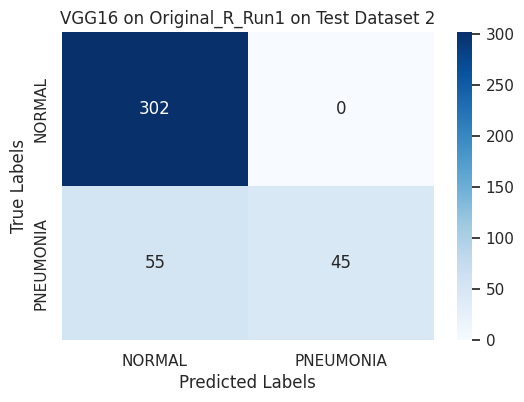

Testing on Dataset 3
13/13 [==============================] - 3s 215ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.302, 'Test Accuracy': 0.8582, 'F1 Score': 0.84, 'Sensitivity (Recall)': 0.86, 'Precision': 0.88}


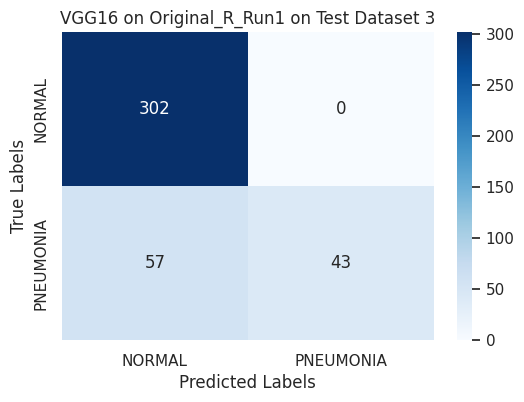

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
43/43 [==============================] - 15s 323ms/step - loss: 0.6827 - accuracy: 0.8375 - val_loss: 0.3012 - val_accuracy: 0.8824
Epoch 2/10
43/43 [==============================] - 13s 311ms/step - loss: 0.3033 - accuracy: 0.8831 - val_loss: 0.2650 - val_accuracy: 0.8824
Epoch 3/10
43/43 [==============================] - 13s 312ms/step - loss: 0.2895 - accuracy: 0.8838 - val_loss: 0.2524 - val_accuracy: 0.8824
Epoch 4/10
43/43 [==============================] - 13s 311ms/step - loss: 0.2785 - accuracy: 0.8890 - val_loss: 0.2469 - val_accuracy: 0.8824
Epoch 5/10
43/43 [==============================] - 13s 315ms/step - loss: 0.2674 - accuracy: 0.8868 - val_loss: 0.2300 - val_accuracy: 0.8824
Epoch 6/10
43/43 [==============================] - 14s 317ms/step - loss: 0.2444 - accuracy: 0.8926 - val_loss: 0.2117 - val_accuracy: 0.8824
Epoch 7/10
43/43 [==============================] - 14s 318ms/step - loss: 0.2421 - accuracy: 0.9000 - v

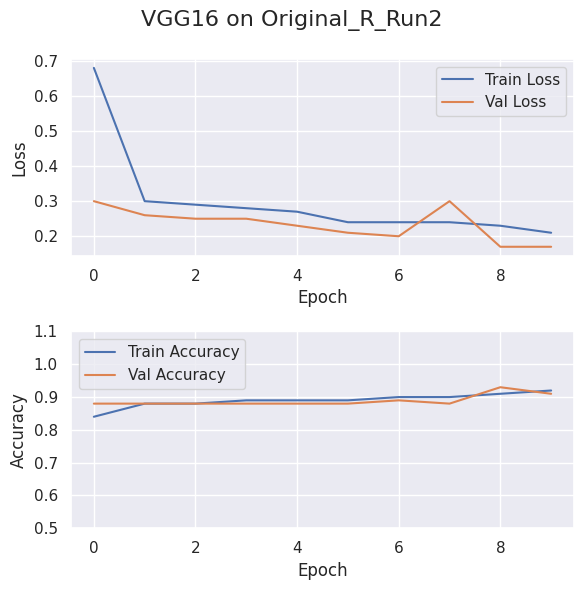

Testing on Dataset 1
13/13 [==============================] - 3s 215ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.3167, 'Test Accuracy': 0.8134, 'F1 Score': 0.77, 'Sensitivity (Recall)': 0.81, 'Precision': 0.85}


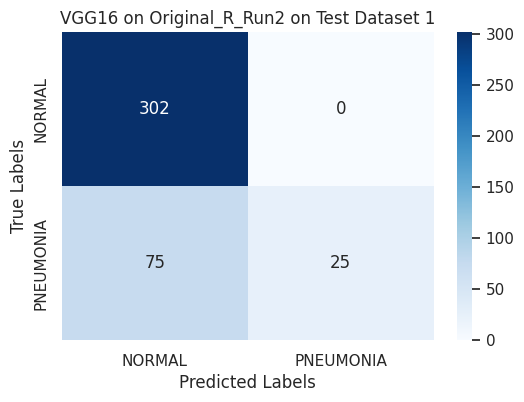

Testing on Dataset 2
13/13 [==============================] - 3s 218ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.3445, 'Test Accuracy': 0.806, 'F1 Score': 0.76, 'Sensitivity (Recall)': 0.81, 'Precision': 0.85}


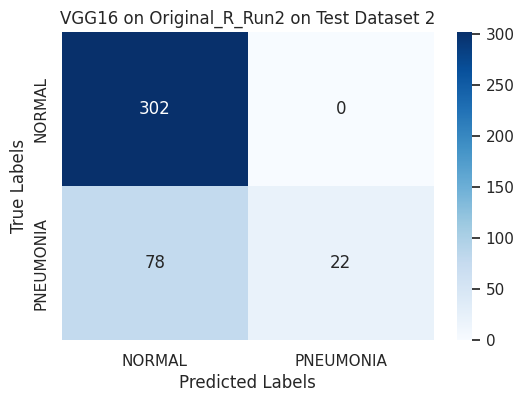

Testing on Dataset 3
13/13 [==============================] - 3s 220ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.3467, 'Test Accuracy': 0.8109, 'F1 Score': 0.76, 'Sensitivity (Recall)': 0.81, 'Precision': 0.85}


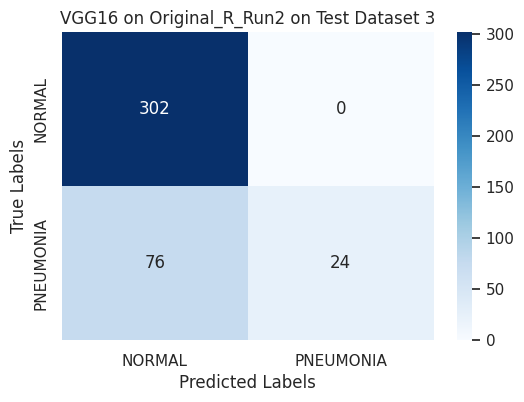

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
43/43 [==============================] - 15s 321ms/step - loss: 0.6745 - accuracy: 0.8390 - val_loss: 0.2919 - val_accuracy: 0.8824
Epoch 2/10
43/43 [==============================] - 13s 310ms/step - loss: 0.2965 - accuracy: 0.8824 - val_loss: 0.2544 - val_accuracy: 0.8824
Epoch 3/10
43/43 [==============================] - 13s 314ms/step - loss: 0.2652 - accuracy: 0.8875 - val_loss: 0.2302 - val_accuracy: 0.9000
Epoch 4/10
43/43 [==============================] - 14s 316ms/step - loss: 0.2390 - accuracy: 0.9007 - val_loss: 0.2030 - val_accuracy: 0.8824
Epoch 5/10
43/43 [==============================] - 14s 318ms/step - loss: 0.2409 - accuracy: 0.8941 - val_loss: 0.2399 - val_accuracy: 0.9294
Epoch 6/10
43/43 [==============================] - 13s 315ms/step - loss: 0.2171 - accuracy: 0.9088 - val_loss: 0.1767 - val_accuracy: 0.9000
Epoch 7/10
43/43 [==============================] - 14s 319ms/step - loss: 0.1921 - accuracy: 0.9279 - v

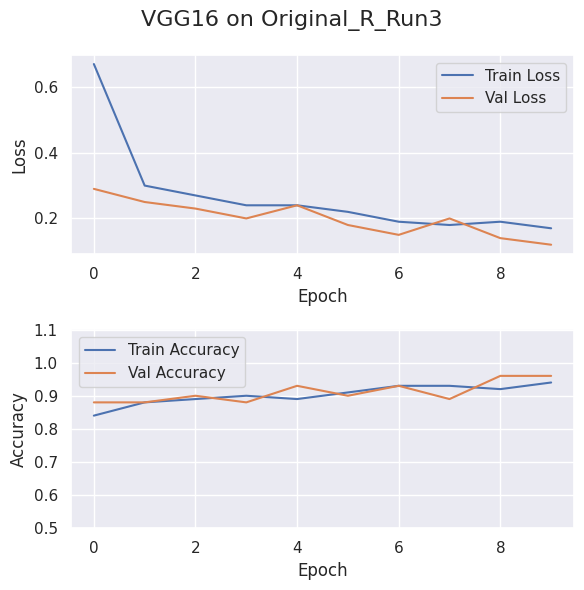

Testing on Dataset 1
13/13 [==============================] - 3s 225ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2405, 'Test Accuracy': 0.8781, 'F1 Score': 0.87, 'Sensitivity (Recall)': 0.88, 'Precision': 0.89}


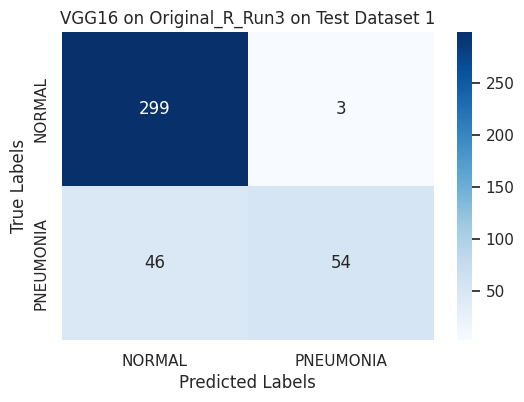

Testing on Dataset 2
13/13 [==============================] - 3s 225ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.262, 'Test Accuracy': 0.8905, 'F1 Score': 0.88, 'Sensitivity (Recall)': 0.89, 'Precision': 0.9}


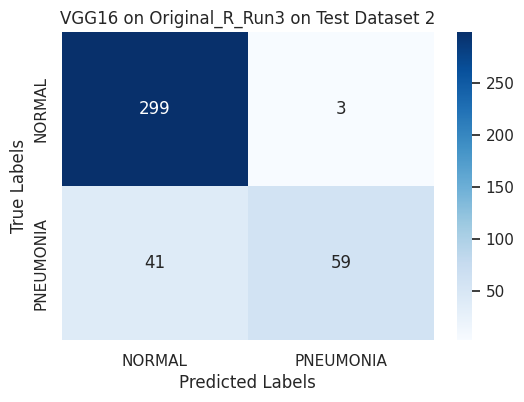

Testing on Dataset 3
13/13 [==============================] - 3s 227ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.2743, 'Test Accuracy': 0.8756, 'F1 Score': 0.86, 'Sensitivity (Recall)': 0.88, 'Precision': 0.88}


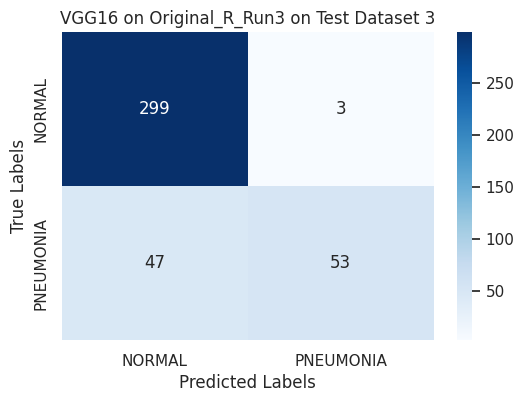

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
43/43 [==============================] - 14s 313ms/step - loss: 0.7047 - accuracy: 0.8404 - val_loss: 0.2885 - val_accuracy: 0.8824
Epoch 2/10
43/43 [==============================] - 13s 303ms/step - loss: 0.2833 - accuracy: 0.8838 - val_loss: 0.2373 - val_accuracy: 0.8824
Epoch 3/10
43/43 [==============================] - 13s 304ms/step - loss: 0.2513 - accuracy: 0.8912 - val_loss: 0.2041 - val_accuracy: 0.9118
Epoch 4/10
43/43 [==============================] - 13s 309ms/step - loss: 0.2234 - accuracy: 0.9118 - val_loss: 0.1642 - val_accuracy: 0.9294
Epoch 5/10
43/43 [==============================] - 13s 312ms/step - loss: 0.2013 - accuracy: 0.9118 - val_loss: 0.1787 - val_accuracy: 0.9706
Epoch 6/10
43/43 [==============================] - 13s 314ms/step - loss: 0.1733 - accuracy: 0.9316 - val_loss: 0.1404 - val_accuracy: 0.9353
Epoch 7/10
43/43 [==============================] - 13s 310ms/step - loss: 0.1661 - accuracy: 0.9375 - v

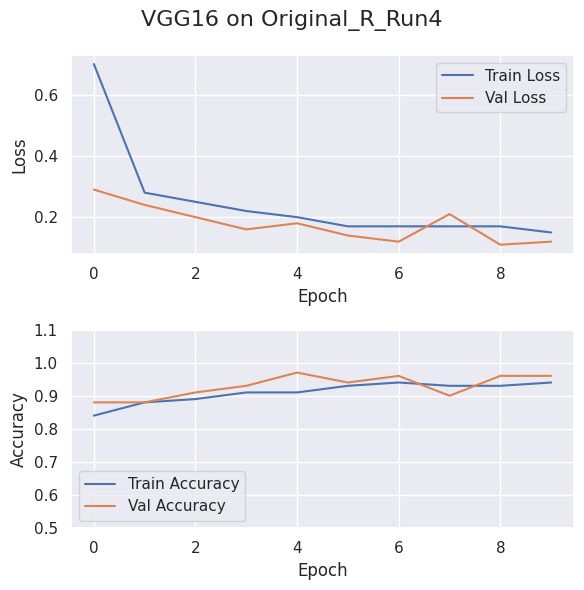

Testing on Dataset 1
13/13 [==============================] - 3s 239ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2382, 'Test Accuracy': 0.8831, 'F1 Score': 0.87, 'Sensitivity (Recall)': 0.88, 'Precision': 0.9}


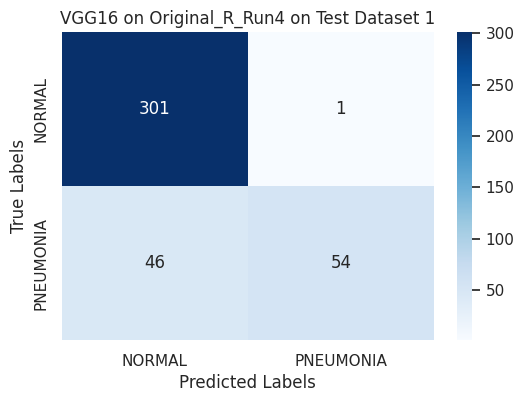

Testing on Dataset 2
13/13 [==============================] - 3s 235ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.269, 'Test Accuracy': 0.8781, 'F1 Score': 0.86, 'Sensitivity (Recall)': 0.88, 'Precision': 0.89}


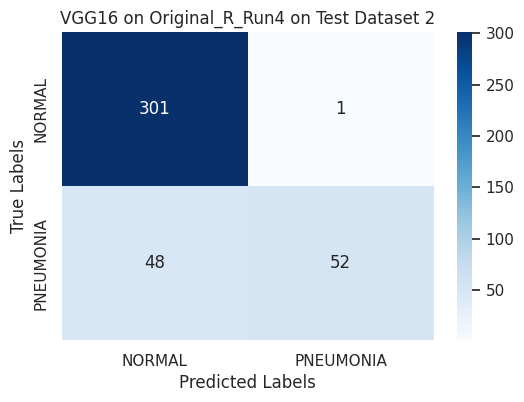

Testing on Dataset 3
13/13 [==============================] - 3s 235ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.2706, 'Test Accuracy': 0.8905, 'F1 Score': 0.88, 'Sensitivity (Recall)': 0.89, 'Precision': 0.9}


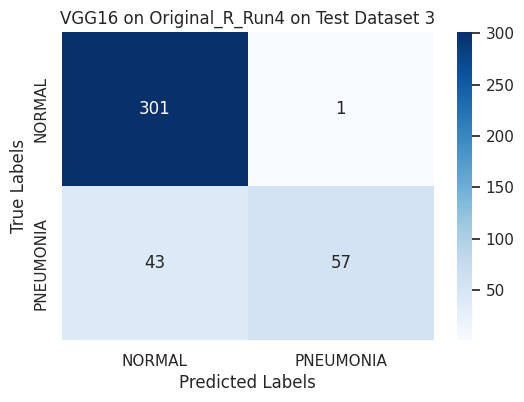

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
43/43 [==============================] - 14s 311ms/step - loss: 0.6322 - accuracy: 0.8551 - val_loss: 0.2898 - val_accuracy: 0.8824
Epoch 2/10
43/43 [==============================] - 13s 302ms/step - loss: 0.2979 - accuracy: 0.8831 - val_loss: 0.2474 - val_accuracy: 0.8824
Epoch 3/10
43/43 [==============================] - 13s 307ms/step - loss: 0.2614 - accuracy: 0.8860 - val_loss: 0.2080 - val_accuracy: 0.8853
Epoch 4/10
43/43 [==============================] - 14s 316ms/step - loss: 0.2385 - accuracy: 0.8985 - val_loss: 0.1878 - val_accuracy: 0.8882
Epoch 5/10
43/43 [==============================] - 13s 308ms/step - loss: 0.2225 - accuracy: 0.8949 - val_loss: 0.1718 - val_accuracy: 0.8971
Epoch 6/10
43/43 [==============================] - 14s 319ms/step - loss: 0.1932 - accuracy: 0.9213 - val_loss: 0.1472 - val_accuracy: 0.9353
Epoch 7/10
43/43 [==============================] - 13s 309ms/step - loss: 0.1946 - accuracy: 0.9221 - v

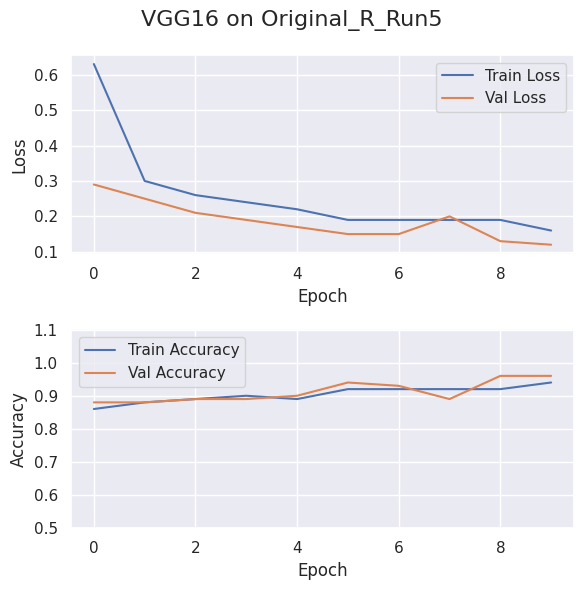

Testing on Dataset 1
13/13 [==============================] - 3s 230ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2883, 'Test Accuracy': 0.8582, 'F1 Score': 0.84, 'Sensitivity (Recall)': 0.86, 'Precision': 0.87}


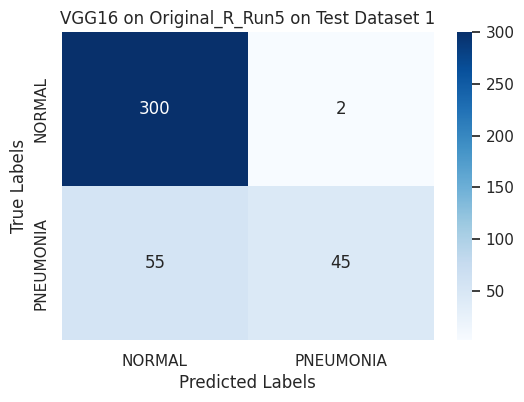

Testing on Dataset 2
13/13 [==============================] - 3s 236ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.3159, 'Test Accuracy': 0.8483, 'F1 Score': 0.82, 'Sensitivity (Recall)': 0.85, 'Precision': 0.86}


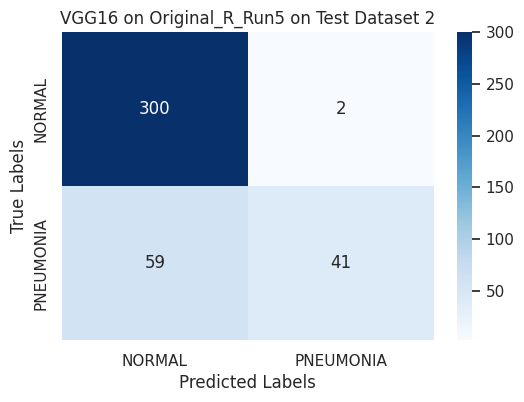

Testing on Dataset 3
13/13 [==============================] - 3s 237ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.3266, 'Test Accuracy': 0.8532, 'F1 Score': 0.83, 'Sensitivity (Recall)': 0.85, 'Precision': 0.87}


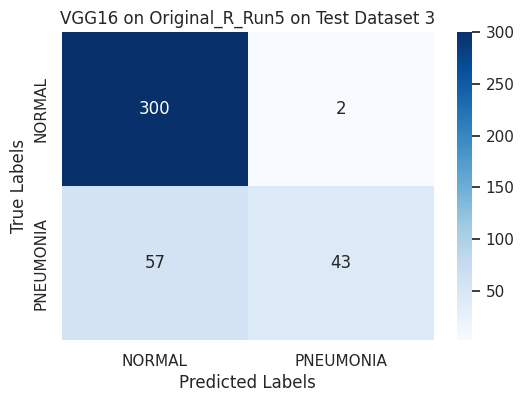

In [8]:
title = "VGG16 on Original_R" 
file_name = "Trained_Models/training_history_plot_original_R.png"

for i in range(0, 5):
    trained_model, test_metrics, confusion_matrix = imbalanced_cv_train_and_evaluate_model(
        dataset_dir_org_rand, 
        test_dataset_dir_rand1, 
        test_dataset_dir_rand2, 
        test_dataset_dir_rand3, 
        class_labels,  
        vgg_model, 
        weights=None,
        input_shape= input_shape, 
        title=f"{title}_Run{i+1}", 
        file_name=file_name,  # Now treated as a keyword argument
        cv=cv, 
        epochs=epochs, 
        batch_size=batch_size
    )


#### Train on Mixed DDPM Dataset


Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 30s 315ms/step - loss: 0.5246 - accuracy: 0.7949 - val_loss: 0.2319 - val_accuracy: 0.9405
Epoch 2/10
93/93 [==============================] - 29s 311ms/step - loss: 0.1860 - accuracy: 0.9361 - val_loss: 0.1134 - val_accuracy: 0.9676
Epoch 3/10
93/93 [==============================] - 29s 313ms/step - loss: 0.1384 - accuracy: 0.9568 - val_loss: 0.0897 - val_accuracy: 0.9716
Epoch 4/10
93/93 [==============================] - 29s 315ms/step - loss: 0.1117 - accuracy: 0.9652 - val_loss: 0.0850 - val_accuracy: 0.9770
Epoch 5/10
93/93 [==============================] - 30s 321ms/step - loss: 0.1076 - accuracy: 0.9642 - val_loss: 0.0819 - val_accuracy: 0.9770
Epoch 6/10
93/93 [==============================] - 30s 318ms/step - loss: 0.0965 - accuracy: 0.9686 - val_loss: 0.0713 - val_accuracy: 0.9797
Epoch 7/10
93/93 [==============================] - 30s 319ms/step - loss: 0.0803 - accuracy: 0.9760 - v

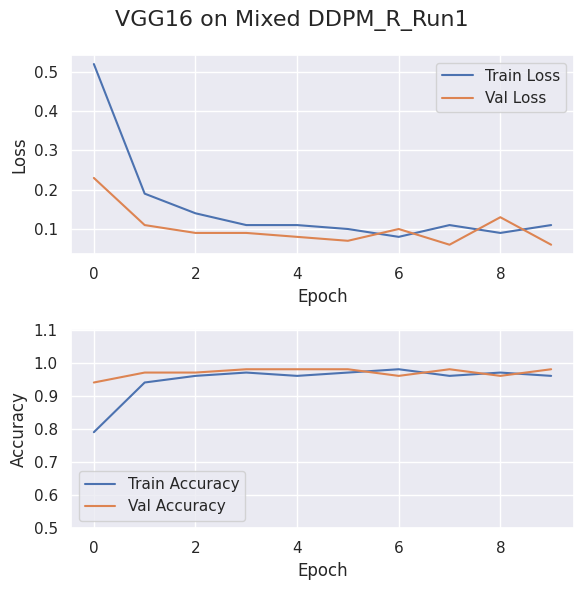

Testing on Dataset 1
13/13 [==============================] - 3s 225ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.1758, 'Test Accuracy': 0.9229, 'F1 Score': 0.92, 'Sensitivity (Recall)': 0.92, 'Precision': 0.92}


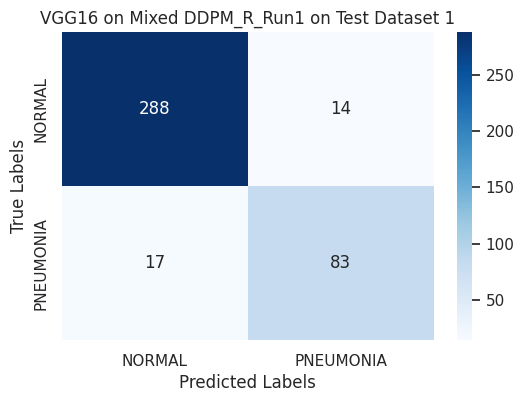

Testing on Dataset 2
13/13 [==============================] - 3s 214ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.2139, 'Test Accuracy': 0.9154, 'F1 Score': 0.91, 'Sensitivity (Recall)': 0.92, 'Precision': 0.91}


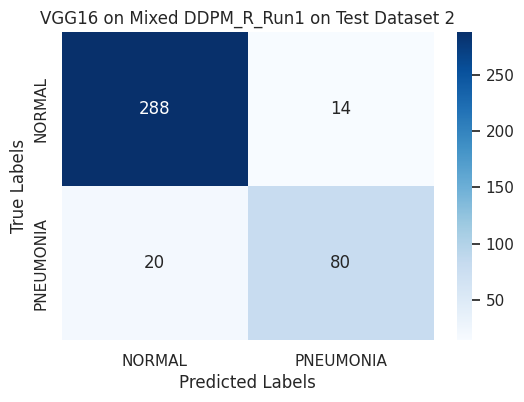

Testing on Dataset 3
13/13 [==============================] - 3s 223ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.2114, 'Test Accuracy': 0.908, 'F1 Score': 0.91, 'Sensitivity (Recall)': 0.91, 'Precision': 0.91}


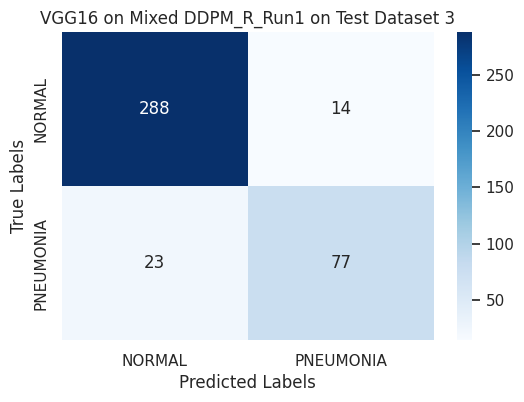

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 30s 317ms/step - loss: 0.5018 - accuracy: 0.8054 - val_loss: 0.2322 - val_accuracy: 0.9351
Epoch 2/10
93/93 [==============================] - 29s 316ms/step - loss: 0.1761 - accuracy: 0.9426 - val_loss: 0.1121 - val_accuracy: 0.9662
Epoch 3/10
93/93 [==============================] - 30s 324ms/step - loss: 0.1181 - accuracy: 0.9581 - val_loss: 0.0781 - val_accuracy: 0.9784
Epoch 4/10
93/93 [==============================] - 30s 324ms/step - loss: 0.1045 - accuracy: 0.9618 - val_loss: 0.0788 - val_accuracy: 0.9757
Epoch 5/10
93/93 [==============================] - 30s 322ms/step - loss: 0.0878 - accuracy: 0.9693 - val_loss: 0.0649 - val_accuracy: 0.9811
Epoch 6/10
93/93 [==============================] - 30s 325ms/step - loss: 0.0931 - accuracy: 0.9676 - val_loss: 0.0573 - val_accuracy: 0.9811
Epoch 7/10
93/93 [==============================] - 30s 322ms/step - loss: 0.0825 - accuracy: 0.9740 - v

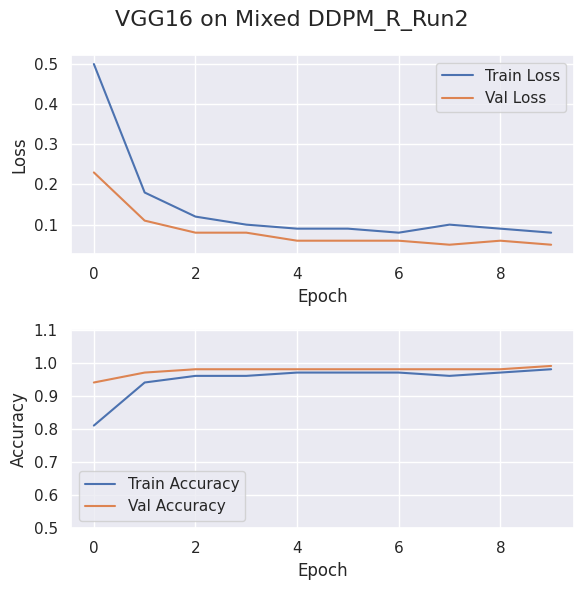

Testing on Dataset 1
13/13 [==============================] - 3s 242ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.1595, 'Test Accuracy': 0.9378, 'F1 Score': 0.94, 'Sensitivity (Recall)': 0.94, 'Precision': 0.94}


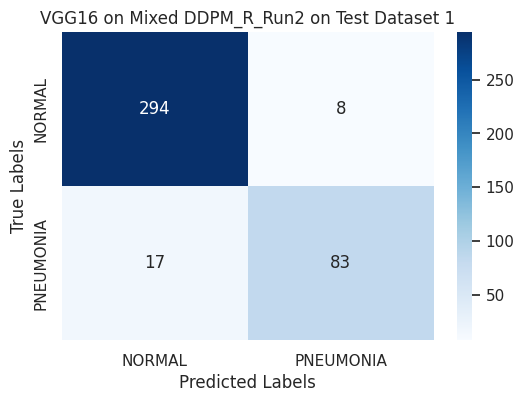

Testing on Dataset 2
13/13 [==============================] - 3s 243ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.2216, 'Test Accuracy': 0.9328, 'F1 Score': 0.93, 'Sensitivity (Recall)': 0.93, 'Precision': 0.93}


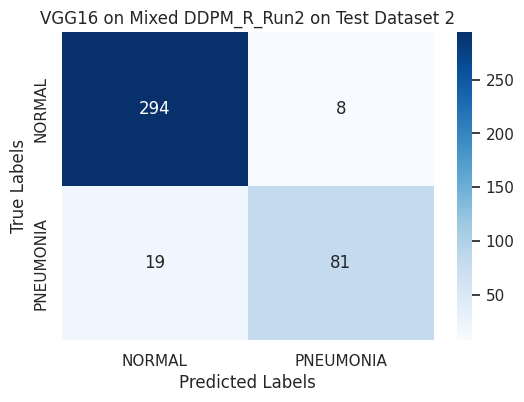

Testing on Dataset 3
13/13 [==============================] - 3s 239ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.2069, 'Test Accuracy': 0.9179, 'F1 Score': 0.92, 'Sensitivity (Recall)': 0.92, 'Precision': 0.92}


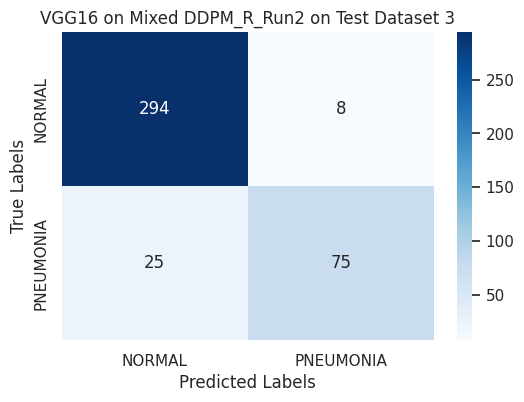

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 31s 323ms/step - loss: 0.4342 - accuracy: 0.8253 - val_loss: 0.1713 - val_accuracy: 0.9446
Epoch 2/10
93/93 [==============================] - 30s 319ms/step - loss: 0.1729 - accuracy: 0.9345 - val_loss: 0.1110 - val_accuracy: 0.9676
Epoch 3/10
93/93 [==============================] - 30s 319ms/step - loss: 0.1372 - accuracy: 0.9486 - val_loss: 0.0815 - val_accuracy: 0.9770
Epoch 4/10
93/93 [==============================] - 30s 325ms/step - loss: 0.1147 - accuracy: 0.9591 - val_loss: 0.0708 - val_accuracy: 0.9811
Epoch 5/10
93/93 [==============================] - 30s 321ms/step - loss: 0.0937 - accuracy: 0.9666 - val_loss: 0.0580 - val_accuracy: 0.9824
Epoch 6/10
93/93 [==============================] - 30s 324ms/step - loss: 0.1008 - accuracy: 0.9632 - val_loss: 0.0661 - val_accuracy: 0.9797
Epoch 7/10
93/93 [==============================] - 30s 323ms/step - loss: 0.0815 - accuracy: 0.9703 - v

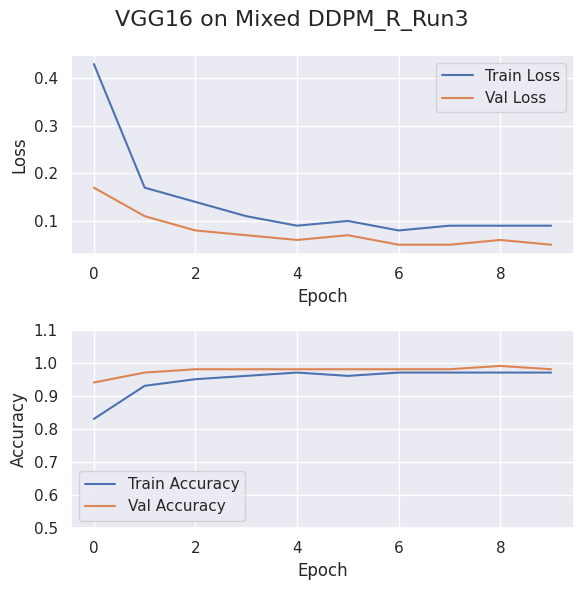

Testing on Dataset 1
13/13 [==============================] - 3s 239ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.1703, 'Test Accuracy': 0.9279, 'F1 Score': 0.93, 'Sensitivity (Recall)': 0.93, 'Precision': 0.93}


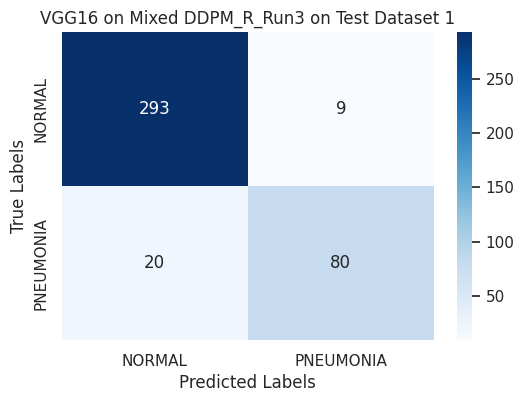

Testing on Dataset 2
13/13 [==============================] - 3s 240ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.2256, 'Test Accuracy': 0.9229, 'F1 Score': 0.92, 'Sensitivity (Recall)': 0.92, 'Precision': 0.92}


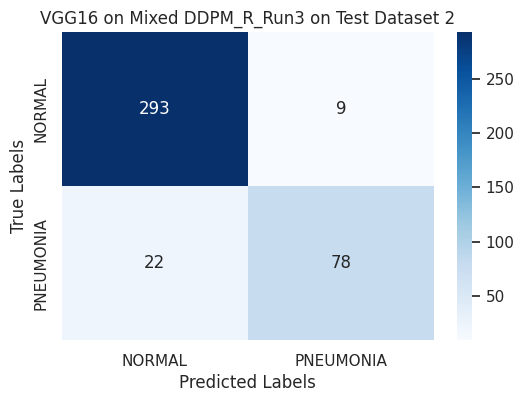

Testing on Dataset 3
13/13 [==============================] - 3s 247ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.1997, 'Test Accuracy': 0.9229, 'F1 Score': 0.92, 'Sensitivity (Recall)': 0.92, 'Precision': 0.92}


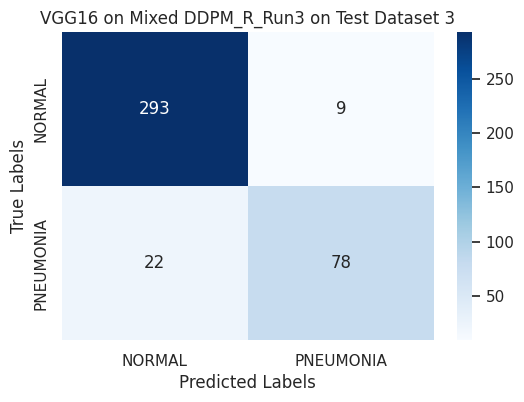

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 31s 323ms/step - loss: 0.7055 - accuracy: 0.6821 - val_loss: 0.4291 - val_accuracy: 0.8608
Epoch 2/10
93/93 [==============================] - 30s 319ms/step - loss: 0.3440 - accuracy: 0.8682 - val_loss: 0.1958 - val_accuracy: 0.9541
Epoch 3/10
93/93 [==============================] - 30s 321ms/step - loss: 0.2230 - accuracy: 0.9176 - val_loss: 0.1363 - val_accuracy: 0.9595
Epoch 4/10
93/93 [==============================] - 30s 324ms/step - loss: 0.1656 - accuracy: 0.9432 - val_loss: 0.1035 - val_accuracy: 0.9703
Epoch 5/10
93/93 [==============================] - 30s 324ms/step - loss: 0.1397 - accuracy: 0.9527 - val_loss: 0.0809 - val_accuracy: 0.9770
Epoch 6/10
93/93 [==============================] - 30s 325ms/step - loss: 0.1300 - accuracy: 0.9557 - val_loss: 0.0819 - val_accuracy: 0.9730
Epoch 7/10
93/93 [==============================] - 30s 322ms/step - loss: 0.1206 - accuracy: 0.9547 - v

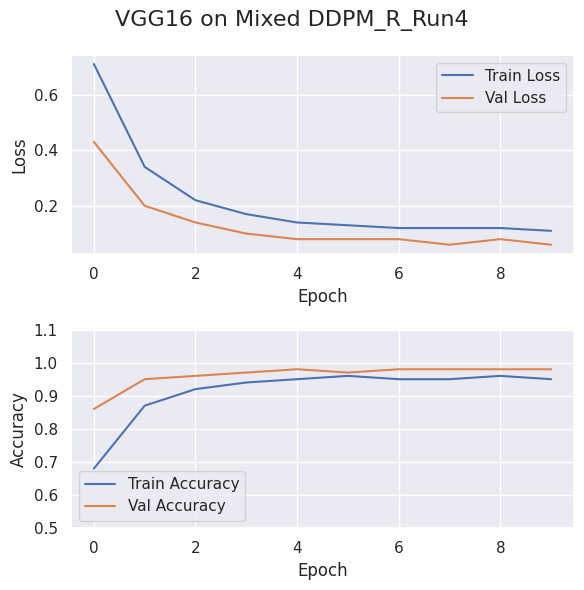

Testing on Dataset 1
13/13 [==============================] - 3s 245ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.1823, 'Test Accuracy': 0.9303, 'F1 Score': 0.93, 'Sensitivity (Recall)': 0.93, 'Precision': 0.93}


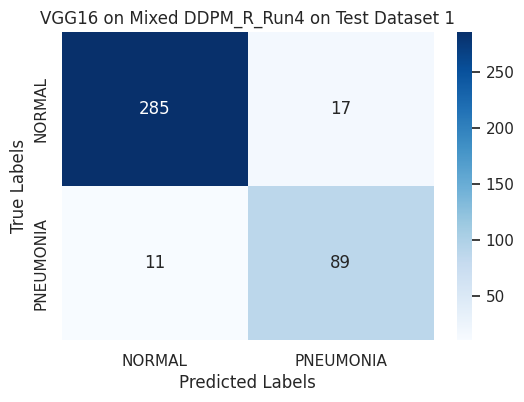

Testing on Dataset 2
13/13 [==============================] - 3s 241ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.2187, 'Test Accuracy': 0.9204, 'F1 Score': 0.92, 'Sensitivity (Recall)': 0.92, 'Precision': 0.92}


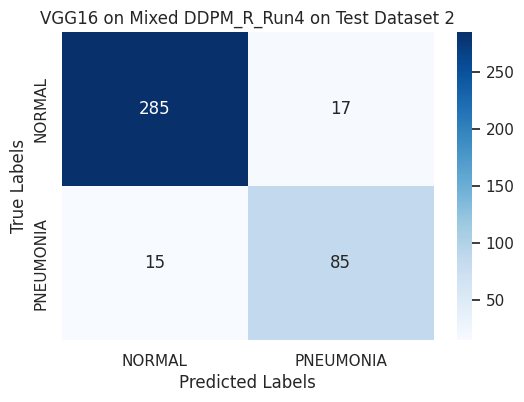

Testing on Dataset 3
13/13 [==============================] - 3s 239ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.2147, 'Test Accuracy': 0.9229, 'F1 Score': 0.92, 'Sensitivity (Recall)': 0.92, 'Precision': 0.92}


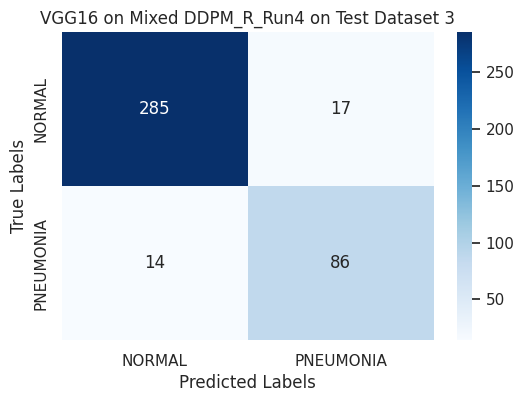

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 29s 306ms/step - loss: 0.4768 - accuracy: 0.7963 - val_loss: 0.2085 - val_accuracy: 0.9419
Epoch 2/10
93/93 [==============================] - 28s 304ms/step - loss: 0.1865 - accuracy: 0.9334 - val_loss: 0.1042 - val_accuracy: 0.9743
Epoch 3/10
93/93 [==============================] - 28s 302ms/step - loss: 0.1224 - accuracy: 0.9598 - val_loss: 0.0767 - val_accuracy: 0.9784
Epoch 4/10
93/93 [==============================] - 28s 306ms/step - loss: 0.1172 - accuracy: 0.9581 - val_loss: 0.0742 - val_accuracy: 0.9770
Epoch 5/10
93/93 [==============================] - 28s 300ms/step - loss: 0.0946 - accuracy: 0.9682 - val_loss: 0.0583 - val_accuracy: 0.9851
Epoch 6/10
93/93 [==============================] - 28s 305ms/step - loss: 0.0921 - accuracy: 0.9703 - val_loss: 0.0548 - val_accuracy: 0.9838
Epoch 7/10
93/93 [==============================] - 29s 308ms/step - loss: 0.0706 - accuracy: 0.9804 - v

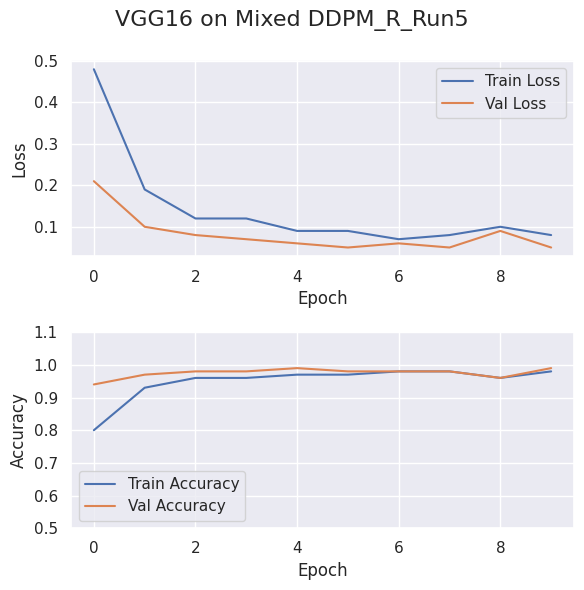

Testing on Dataset 1
13/13 [==============================] - 3s 218ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.1598, 'Test Accuracy': 0.9378, 'F1 Score': 0.94, 'Sensitivity (Recall)': 0.94, 'Precision': 0.94}


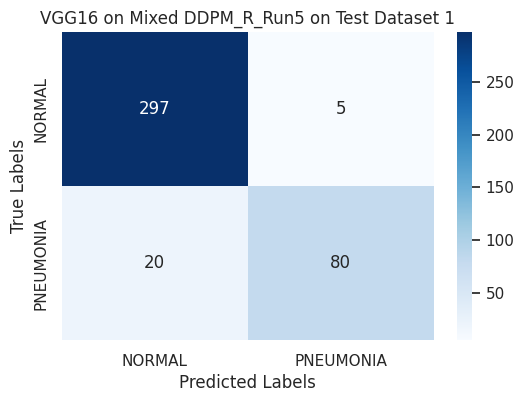

Testing on Dataset 2
13/13 [==============================] - 3s 242ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.2131, 'Test Accuracy': 0.9303, 'F1 Score': 0.93, 'Sensitivity (Recall)': 0.93, 'Precision': 0.93}


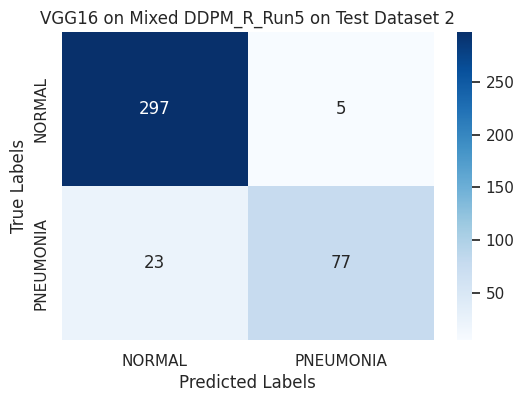

Testing on Dataset 3
13/13 [==============================] - 3s 220ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.1991, 'Test Accuracy': 0.9154, 'F1 Score': 0.91, 'Sensitivity (Recall)': 0.92, 'Precision': 0.92}


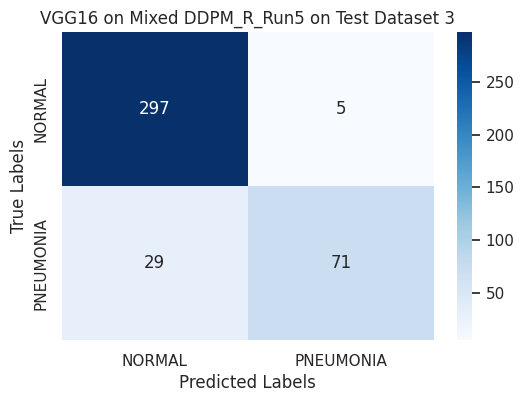

In [9]:
title = "VGG16 on Mixed DDPM_R" 
file_name = "Trained_Models/training_history_plot_Mixed_DDPM_R.png"

for i in range(0, 5):
    trained_model, test_metrics, confusion_matrix = imbalanced_cv_train_and_evaluate_model(
        dataset_dir_ddpm_rand, 
        test_dataset_dir_rand1, 
        test_dataset_dir_rand2, 
        test_dataset_dir_rand3, 
        class_labels,  
        vgg_model, 
        weights=None,
        input_shape= input_shape, 
        title=f"{title}_Run{i+1}", 
        file_name=file_name,  # Now treated as a keyword argument
        cv=cv, 
        epochs=epochs, 
        batch_size=batch_size
    )

#### Train on Mixed PGGANs150k Dataset

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 28s 298ms/step - loss: 0.6237 - accuracy: 0.7770 - val_loss: 0.2870 - val_accuracy: 0.9257
Epoch 2/10
93/93 [==============================] - 28s 307ms/step - loss: 0.2379 - accuracy: 0.9270 - val_loss: 0.1982 - val_accuracy: 0.9351
Epoch 3/10
93/93 [==============================] - 30s 319ms/step - loss: 0.1770 - accuracy: 0.9412 - val_loss: 0.1420 - val_accuracy: 0.9554
Epoch 4/10
93/93 [==============================] - 30s 322ms/step - loss: 0.1486 - accuracy: 0.9530 - val_loss: 0.1060 - val_accuracy: 0.9689
Epoch 5/10
93/93 [==============================] - 30s 322ms/step - loss: 0.1357 - accuracy: 0.9561 - val_loss: 0.1159 - val_accuracy: 0.9635
Epoch 6/10
93/93 [==============================] - 30s 319ms/step - loss: 0.1180 - accuracy: 0.9598 - val_loss: 0.0820 - val_accuracy: 0.9716
Epoch 7/10
93/93 [==============================] - 31s 329ms/step - loss: 0.1026 - accuracy: 0.9662 - v

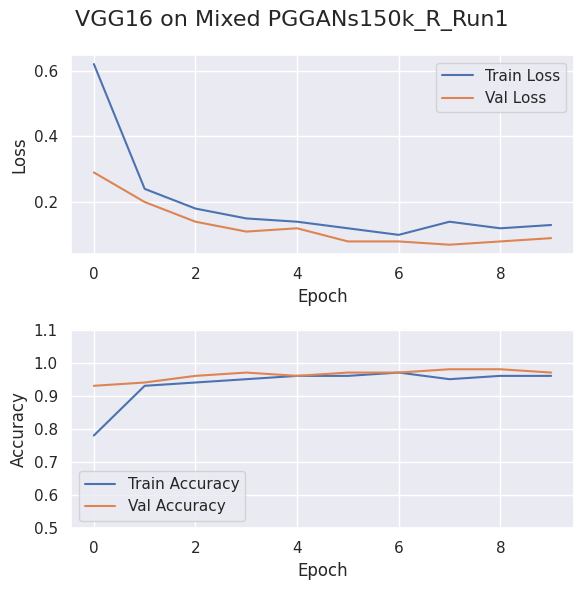

Testing on Dataset 1
13/13 [==============================] - 3s 241ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.3882, 'Test Accuracy': 0.8383, 'F1 Score': 0.82, 'Sensitivity (Recall)': 0.84, 'Precision': 0.84}


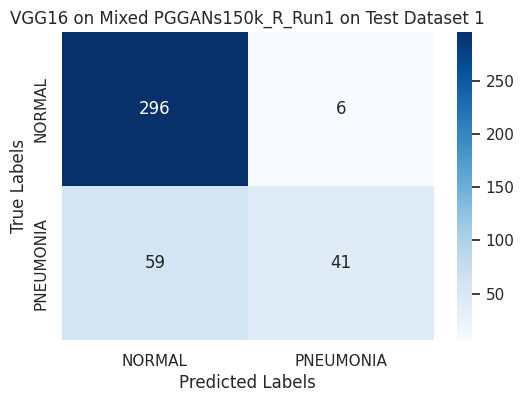

Testing on Dataset 2
13/13 [==============================] - 3s 241ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.4147, 'Test Accuracy': 0.8184, 'F1 Score': 0.79, 'Sensitivity (Recall)': 0.82, 'Precision': 0.82}


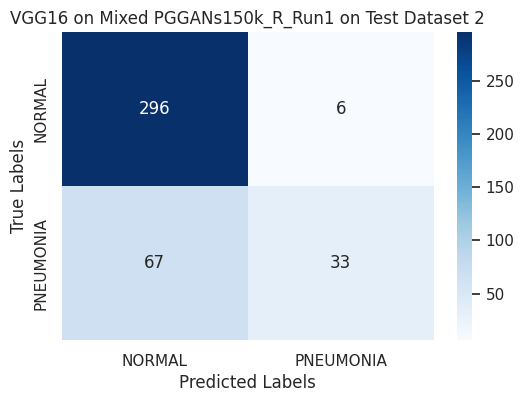

Testing on Dataset 3
13/13 [==============================] - 3s 238ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.448, 'Test Accuracy': 0.8035, 'F1 Score': 0.76, 'Sensitivity (Recall)': 0.8, 'Precision': 0.81}


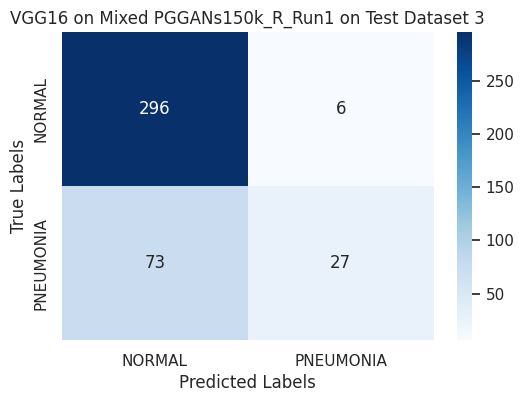

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 31s 323ms/step - loss: 0.3644 - accuracy: 0.8581 - val_loss: 0.1548 - val_accuracy: 0.9446
Epoch 2/10
93/93 [==============================] - 29s 317ms/step - loss: 0.1595 - accuracy: 0.9470 - val_loss: 0.1302 - val_accuracy: 0.9622
Epoch 3/10
93/93 [==============================] - 30s 322ms/step - loss: 0.1440 - accuracy: 0.9510 - val_loss: 0.1087 - val_accuracy: 0.9662
Epoch 4/10
93/93 [==============================] - 30s 326ms/step - loss: 0.1137 - accuracy: 0.9605 - val_loss: 0.0835 - val_accuracy: 0.9703
Epoch 5/10
93/93 [==============================] - 30s 325ms/step - loss: 0.1072 - accuracy: 0.9642 - val_loss: 0.0728 - val_accuracy: 0.9811
Epoch 6/10
93/93 [==============================] - 30s 325ms/step - loss: 0.0963 - accuracy: 0.9659 - val_loss: 0.0585 - val_accuracy: 0.9811
Epoch 7/10
93/93 [==============================] - 30s 325ms/step - loss: 0.0944 - accuracy: 0.9652 - v

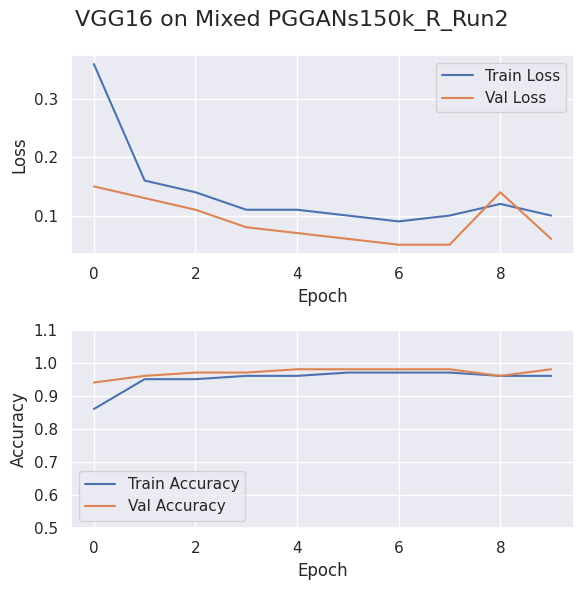

Testing on Dataset 1
13/13 [==============================] - 3s 239ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.3071, 'Test Accuracy': 0.8657, 'F1 Score': 0.85, 'Sensitivity (Recall)': 0.87, 'Precision': 0.87}


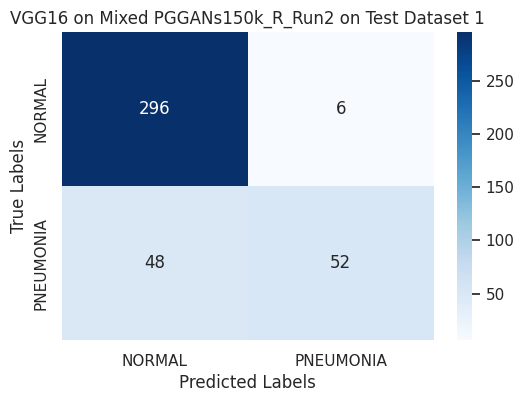

Testing on Dataset 2
13/13 [==============================] - 3s 237ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.3193, 'Test Accuracy': 0.8632, 'F1 Score': 0.85, 'Sensitivity (Recall)': 0.86, 'Precision': 0.87}


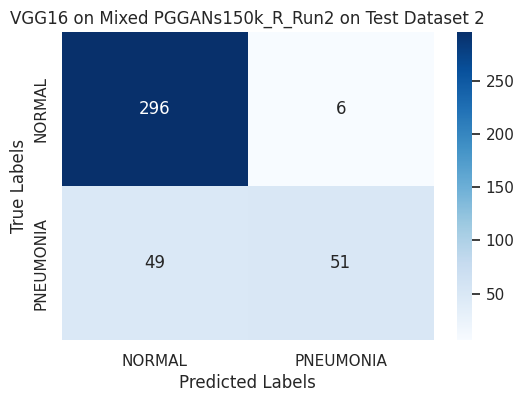

Testing on Dataset 3
13/13 [==============================] - 3s 239ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.3555, 'Test Accuracy': 0.8582, 'F1 Score': 0.84, 'Sensitivity (Recall)': 0.86, 'Precision': 0.86}


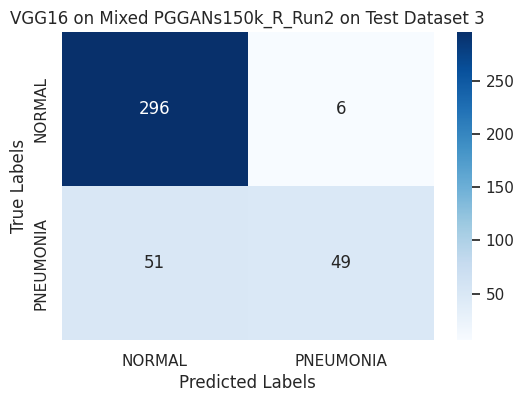

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 31s 322ms/step - loss: 0.3891 - accuracy: 0.8534 - val_loss: 0.1883 - val_accuracy: 0.9459
Epoch 2/10
93/93 [==============================] - 29s 314ms/step - loss: 0.1986 - accuracy: 0.9355 - val_loss: 0.1269 - val_accuracy: 0.9595
Epoch 3/10
93/93 [==============================] - 30s 319ms/step - loss: 0.1345 - accuracy: 0.9541 - val_loss: 0.1093 - val_accuracy: 0.9662
Epoch 4/10
93/93 [==============================] - 30s 325ms/step - loss: 0.1439 - accuracy: 0.9507 - val_loss: 0.0891 - val_accuracy: 0.9703
Epoch 5/10
93/93 [==============================] - 31s 329ms/step - loss: 0.1063 - accuracy: 0.9642 - val_loss: 0.0852 - val_accuracy: 0.9757
Epoch 6/10
93/93 [==============================] - 30s 325ms/step - loss: 0.1058 - accuracy: 0.9652 - val_loss: 0.0712 - val_accuracy: 0.9743
Epoch 7/10
93/93 [==============================] - 30s 321ms/step - loss: 0.0993 - accuracy: 0.9699 - v

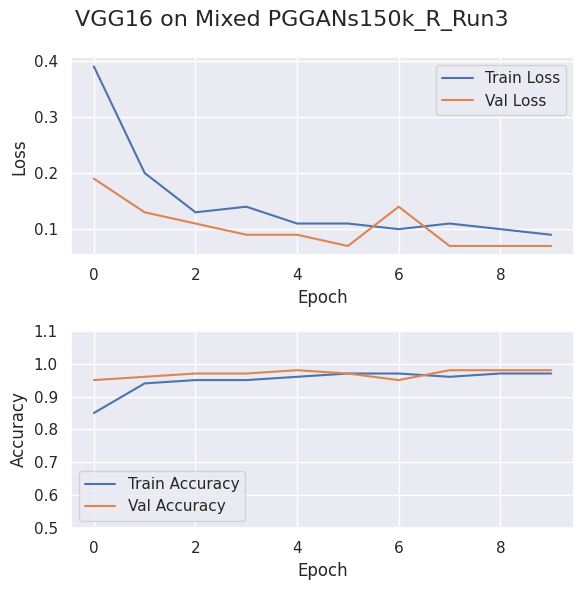

Testing on Dataset 1
13/13 [==============================] - 3s 242ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2169, 'Test Accuracy': 0.9154, 'F1 Score': 0.92, 'Sensitivity (Recall)': 0.92, 'Precision': 0.92}


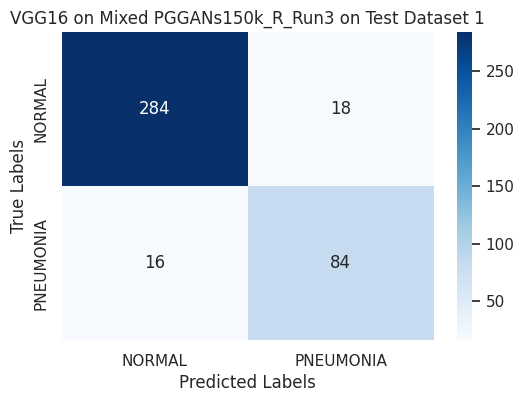

Testing on Dataset 2
13/13 [==============================] - 3s 234ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.2231, 'Test Accuracy': 0.9104, 'F1 Score': 0.91, 'Sensitivity (Recall)': 0.91, 'Precision': 0.91}


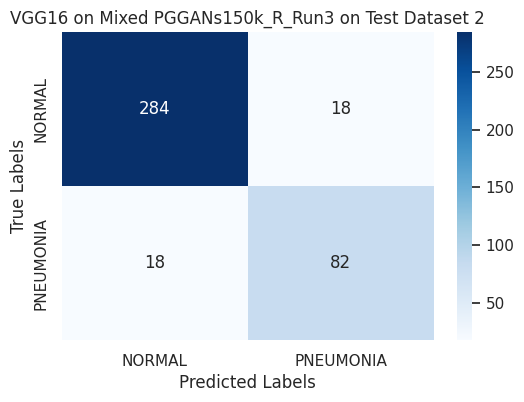

Testing on Dataset 3
13/13 [==============================] - 3s 232ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.2377, 'Test Accuracy': 0.908, 'F1 Score': 0.91, 'Sensitivity (Recall)': 0.91, 'Precision': 0.91}


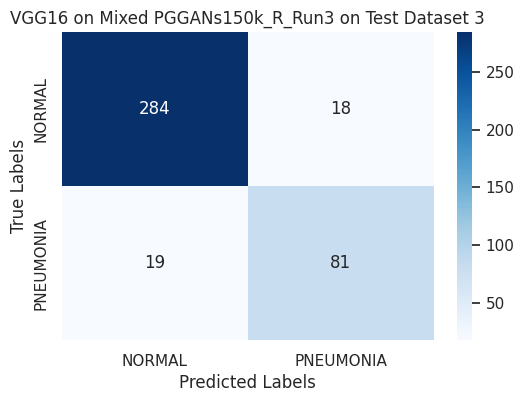

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 30s 311ms/step - loss: 0.4359 - accuracy: 0.8527 - val_loss: 0.1919 - val_accuracy: 0.9351
Epoch 2/10
93/93 [==============================] - 29s 307ms/step - loss: 0.1875 - accuracy: 0.9402 - val_loss: 0.1263 - val_accuracy: 0.9595
Epoch 3/10
93/93 [==============================] - 30s 321ms/step - loss: 0.1470 - accuracy: 0.9517 - val_loss: 0.1297 - val_accuracy: 0.9595
Epoch 4/10
93/93 [==============================] - 30s 325ms/step - loss: 0.1413 - accuracy: 0.9557 - val_loss: 0.0987 - val_accuracy: 0.9676
Epoch 5/10
93/93 [==============================] - 30s 327ms/step - loss: 0.1053 - accuracy: 0.9659 - val_loss: 0.0866 - val_accuracy: 0.9730
Epoch 6/10
93/93 [==============================] - 30s 326ms/step - loss: 0.0976 - accuracy: 0.9659 - val_loss: 0.0834 - val_accuracy: 0.9743
Epoch 7/10
93/93 [==============================] - 30s 321ms/step - loss: 0.1049 - accuracy: 0.9652 - v

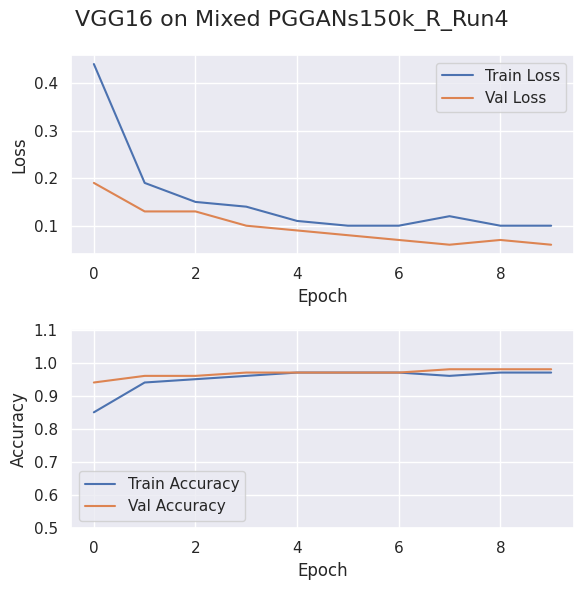

Testing on Dataset 1
13/13 [==============================] - 3s 228ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2902, 'Test Accuracy': 0.8632, 'F1 Score': 0.85, 'Sensitivity (Recall)': 0.86, 'Precision': 0.87}


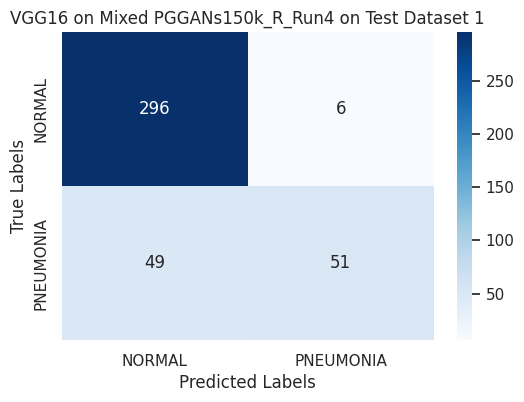

Testing on Dataset 2
13/13 [==============================] - 3s 241ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.3029, 'Test Accuracy': 0.8582, 'F1 Score': 0.84, 'Sensitivity (Recall)': 0.86, 'Precision': 0.86}


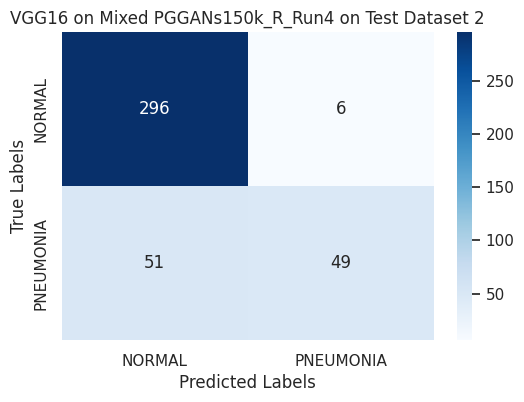

Testing on Dataset 3
13/13 [==============================] - 3s 227ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.3215, 'Test Accuracy': 0.8557, 'F1 Score': 0.84, 'Sensitivity (Recall)': 0.86, 'Precision': 0.86}


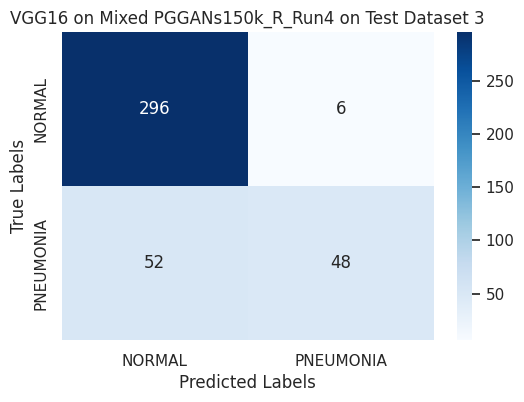

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 31s 326ms/step - loss: 0.4160 - accuracy: 0.8466 - val_loss: 0.2274 - val_accuracy: 0.9311
Epoch 2/10
93/93 [==============================] - 30s 319ms/step - loss: 0.2211 - accuracy: 0.9287 - val_loss: 0.1784 - val_accuracy: 0.9514
Epoch 3/10
93/93 [==============================] - 30s 321ms/step - loss: 0.1670 - accuracy: 0.9395 - val_loss: 0.1327 - val_accuracy: 0.9595
Epoch 4/10
93/93 [==============================] - 30s 321ms/step - loss: 0.1712 - accuracy: 0.9453 - val_loss: 0.1401 - val_accuracy: 0.9514
Epoch 5/10
93/93 [==============================] - 30s 323ms/step - loss: 0.1373 - accuracy: 0.9574 - val_loss: 0.1029 - val_accuracy: 0.9676
Epoch 6/10
93/93 [==============================] - 30s 325ms/step - loss: 0.1294 - accuracy: 0.9554 - val_loss: 0.1399 - val_accuracy: 0.9635
Epoch 7/10
93/93 [==============================] - 30s 324ms/step - loss: 0.1092 - accuracy: 0.9645 - v

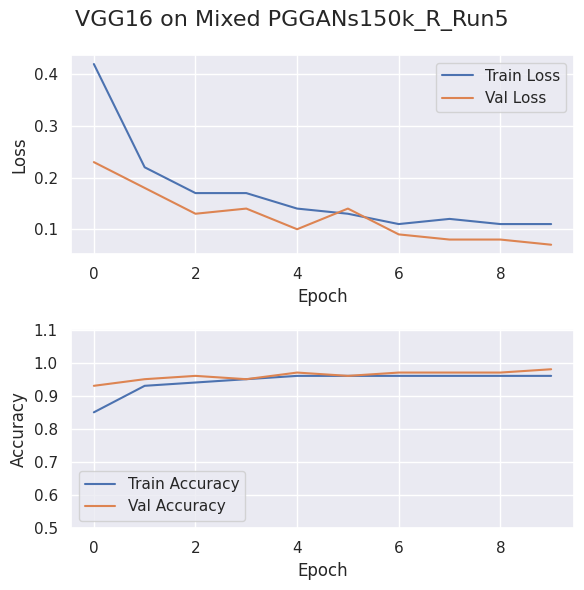

Testing on Dataset 1
13/13 [==============================] - 3s 241ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.3172, 'Test Accuracy': 0.8408, 'F1 Score': 0.82, 'Sensitivity (Recall)': 0.84, 'Precision': 0.85}


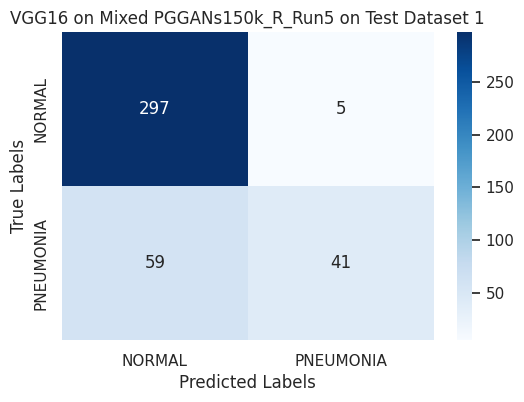

Testing on Dataset 2
13/13 [==============================] - 3s 239ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.3635, 'Test Accuracy': 0.8408, 'F1 Score': 0.82, 'Sensitivity (Recall)': 0.84, 'Precision': 0.85}


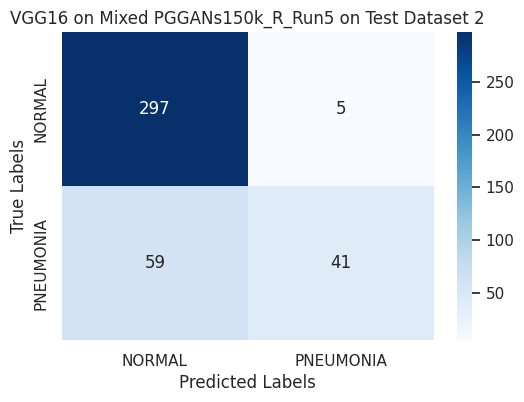

Testing on Dataset 3
13/13 [==============================] - 3s 242ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.3571, 'Test Accuracy': 0.8358, 'F1 Score': 0.81, 'Sensitivity (Recall)': 0.84, 'Precision': 0.84}


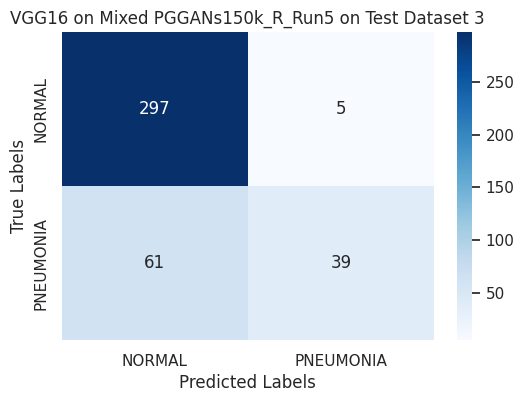

In [10]:
title = "VGG16 on Mixed PGGANs150k_R"
file_name = "Trained_Models/training_history_plot_Mixed_PGGANs150k_R.png"

for i in range(0, 5):
    trained_model, test_metrics, confusion_matrix = imbalanced_cv_train_and_evaluate_model(
        dataset_dir_pggans150_rand, 
        test_dataset_dir_rand1, 
        test_dataset_dir_rand2, 
        test_dataset_dir_rand3, 
        class_labels,  
        vgg_model, 
        weights=None,
        input_shape= input_shape, 
        title=f"{title}_Run{i+1}", 
        file_name=file_name,  # Now treated as a keyword argument
        cv=cv, 
        epochs=epochs, 
        batch_size=batch_size
    )

#### Train on Mixed PGGANs160k Dataset

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 31s 322ms/step - loss: 0.5447 - accuracy: 0.7851 - val_loss: 0.2497 - val_accuracy: 0.9324
Epoch 2/10
93/93 [==============================] - 29s 316ms/step - loss: 0.2052 - accuracy: 0.9399 - val_loss: 0.1389 - val_accuracy: 0.9635
Epoch 3/10
93/93 [==============================] - 30s 320ms/step - loss: 0.1433 - accuracy: 0.9534 - val_loss: 0.1067 - val_accuracy: 0.9703
Epoch 4/10
93/93 [==============================] - 30s 321ms/step - loss: 0.1182 - accuracy: 0.9588 - val_loss: 0.0771 - val_accuracy: 0.9770
Epoch 5/10
93/93 [==============================] - 30s 320ms/step - loss: 0.1113 - accuracy: 0.9618 - val_loss: 0.0681 - val_accuracy: 0.9811
Epoch 6/10
93/93 [==============================] - 30s 320ms/step - loss: 0.1106 - accuracy: 0.9615 - val_loss: 0.0718 - val_accuracy: 0.9797
Epoch 7/10
93/93 [==============================] - 30s 320ms/step - loss: 0.0919 - accuracy: 0.9740 - v

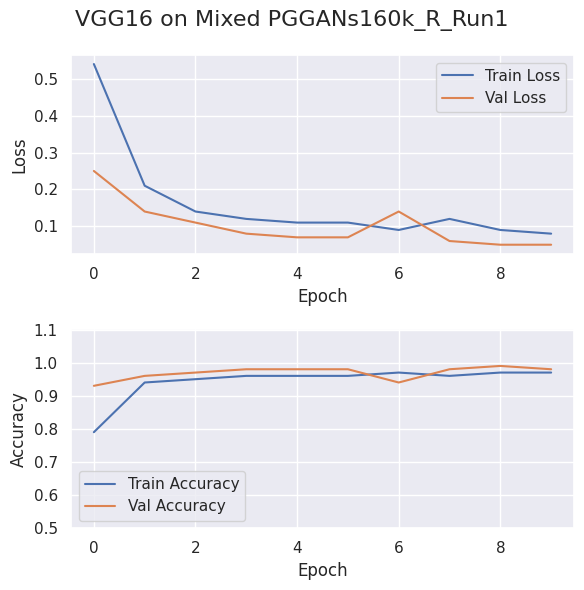

Testing on Dataset 1
13/13 [==============================] - 3s 247ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.1939, 'Test Accuracy': 0.9179, 'F1 Score': 0.91, 'Sensitivity (Recall)': 0.92, 'Precision': 0.92}


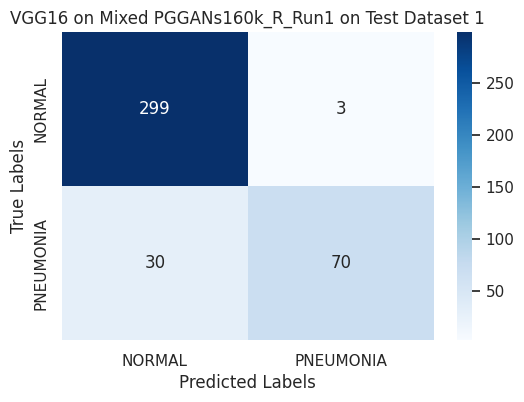

Testing on Dataset 2
13/13 [==============================] - 3s 237ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.223, 'Test Accuracy': 0.9204, 'F1 Score': 0.92, 'Sensitivity (Recall)': 0.92, 'Precision': 0.92}


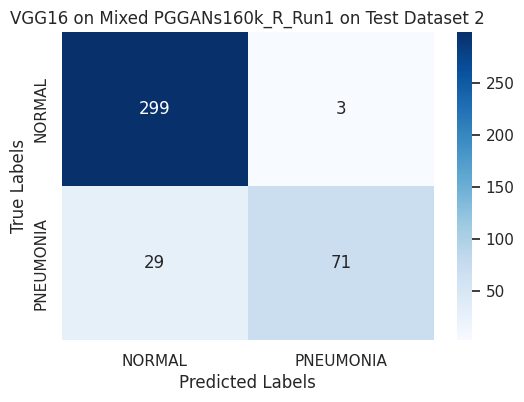

Testing on Dataset 3
13/13 [==============================] - 3s 244ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.2377, 'Test Accuracy': 0.898, 'F1 Score': 0.89, 'Sensitivity (Recall)': 0.9, 'Precision': 0.9}


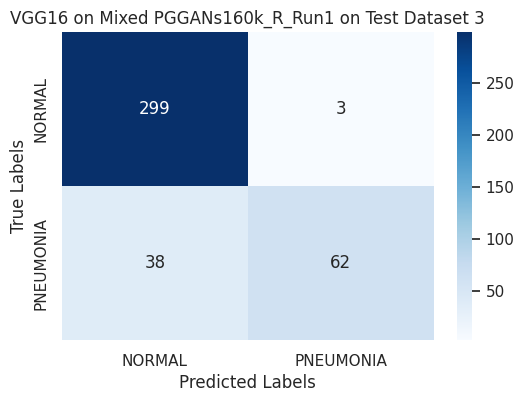

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 31s 324ms/step - loss: 0.5118 - accuracy: 0.7912 - val_loss: 0.2018 - val_accuracy: 0.9541
Epoch 2/10
93/93 [==============================] - 30s 319ms/step - loss: 0.1786 - accuracy: 0.9422 - val_loss: 0.1244 - val_accuracy: 0.9662
Epoch 3/10
93/93 [==============================] - 30s 320ms/step - loss: 0.1308 - accuracy: 0.9537 - val_loss: 0.0988 - val_accuracy: 0.9757
Epoch 4/10
93/93 [==============================] - 30s 320ms/step - loss: 0.1244 - accuracy: 0.9581 - val_loss: 0.1020 - val_accuracy: 0.9689
Epoch 5/10
93/93 [==============================] - 30s 325ms/step - loss: 0.0985 - accuracy: 0.9642 - val_loss: 0.0871 - val_accuracy: 0.9703
Epoch 6/10
93/93 [==============================] - 30s 324ms/step - loss: 0.1138 - accuracy: 0.9584 - val_loss: 0.0657 - val_accuracy: 0.9770
Epoch 7/10
93/93 [==============================] - 30s 322ms/step - loss: 0.1036 - accuracy: 0.9628 - v

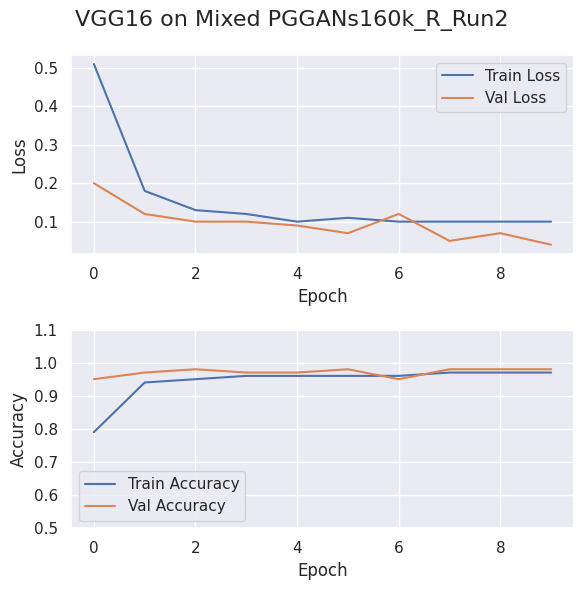

Testing on Dataset 1
13/13 [==============================] - 3s 242ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.1998, 'Test Accuracy': 0.9328, 'F1 Score': 0.93, 'Sensitivity (Recall)': 0.93, 'Precision': 0.93}


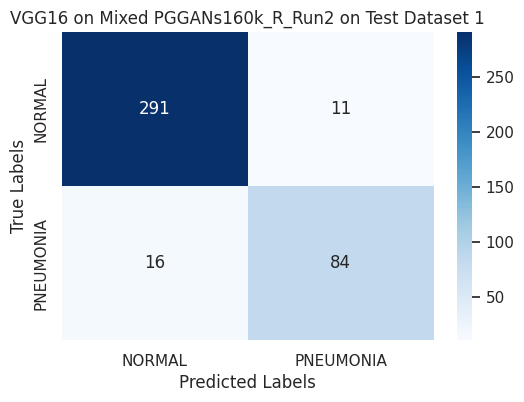

Testing on Dataset 2
13/13 [==============================] - 3s 232ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.2183, 'Test Accuracy': 0.9229, 'F1 Score': 0.92, 'Sensitivity (Recall)': 0.92, 'Precision': 0.92}


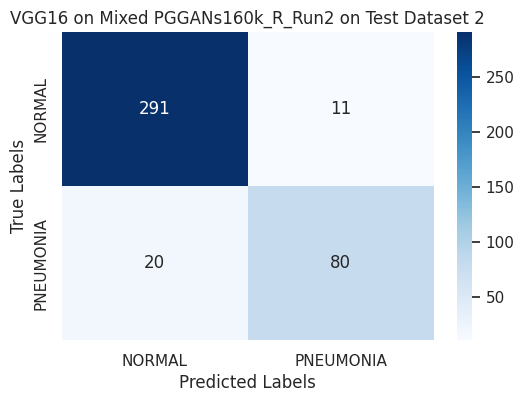

Testing on Dataset 3
13/13 [==============================] - 3s 236ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.2182, 'Test Accuracy': 0.9154, 'F1 Score': 0.91, 'Sensitivity (Recall)': 0.92, 'Precision': 0.91}


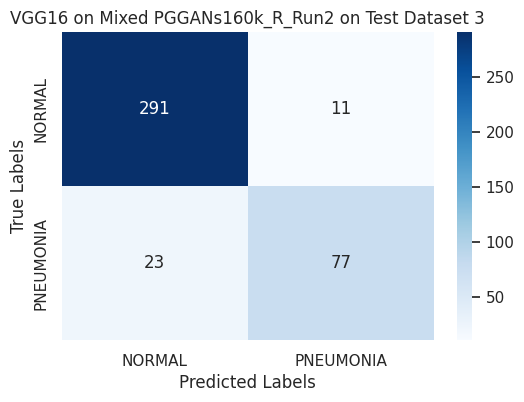

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 31s 324ms/step - loss: 0.5639 - accuracy: 0.7736 - val_loss: 0.2768 - val_accuracy: 0.9176
Epoch 2/10
93/93 [==============================] - 29s 316ms/step - loss: 0.2190 - accuracy: 0.9284 - val_loss: 0.1306 - val_accuracy: 0.9676
Epoch 3/10
93/93 [==============================] - 29s 317ms/step - loss: 0.1428 - accuracy: 0.9524 - val_loss: 0.0948 - val_accuracy: 0.9730
Epoch 4/10
93/93 [==============================] - 30s 323ms/step - loss: 0.1339 - accuracy: 0.9571 - val_loss: 0.1006 - val_accuracy: 0.9635
Epoch 5/10
93/93 [==============================] - 29s 318ms/step - loss: 0.1172 - accuracy: 0.9595 - val_loss: 0.0790 - val_accuracy: 0.9784
Epoch 6/10
93/93 [==============================] - 30s 321ms/step - loss: 0.1030 - accuracy: 0.9669 - val_loss: 0.0883 - val_accuracy: 0.9770
Epoch 7/10
93/93 [==============================] - 30s 324ms/step - loss: 0.1021 - accuracy: 0.9672 - v

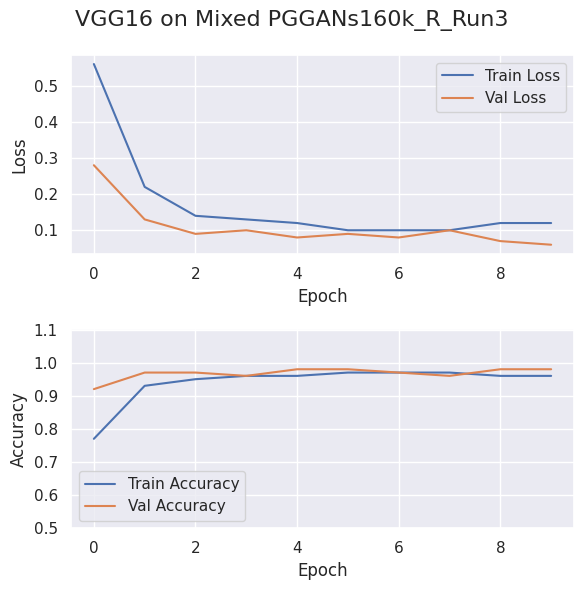

Testing on Dataset 1
13/13 [==============================] - 3s 244ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.1807, 'Test Accuracy': 0.9353, 'F1 Score': 0.93, 'Sensitivity (Recall)': 0.94, 'Precision': 0.93}


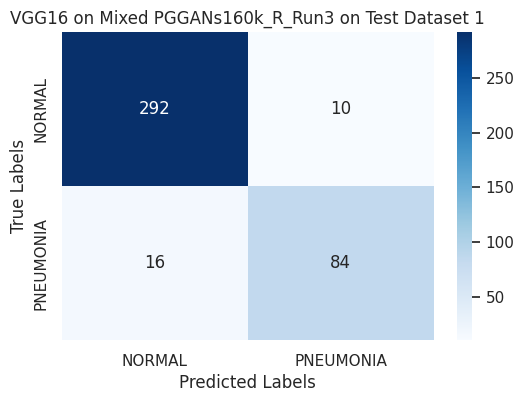

Testing on Dataset 2
13/13 [==============================] - 3s 236ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.2063, 'Test Accuracy': 0.9254, 'F1 Score': 0.92, 'Sensitivity (Recall)': 0.93, 'Precision': 0.92}


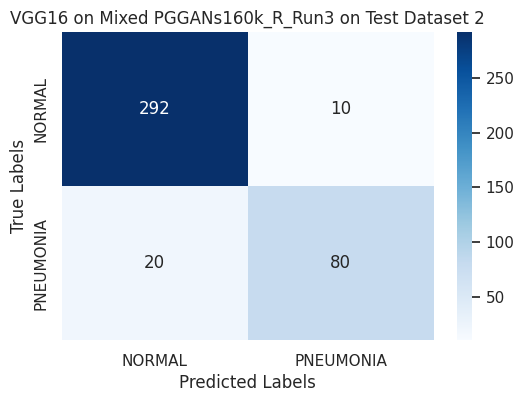

Testing on Dataset 3
13/13 [==============================] - 3s 240ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.2048, 'Test Accuracy': 0.9204, 'F1 Score': 0.92, 'Sensitivity (Recall)': 0.92, 'Precision': 0.92}


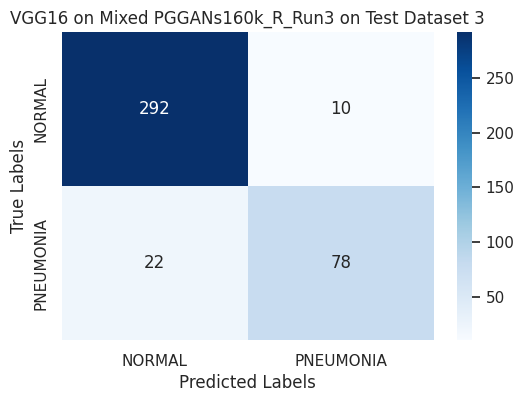

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 30s 319ms/step - loss: 0.4761 - accuracy: 0.8071 - val_loss: 0.1946 - val_accuracy: 0.9378
Epoch 2/10
93/93 [==============================] - 29s 317ms/step - loss: 0.1793 - accuracy: 0.9382 - val_loss: 0.1315 - val_accuracy: 0.9608
Epoch 3/10
93/93 [==============================] - 30s 320ms/step - loss: 0.1347 - accuracy: 0.9480 - val_loss: 0.0985 - val_accuracy: 0.9730
Epoch 4/10
93/93 [==============================] - 30s 324ms/step - loss: 0.1381 - accuracy: 0.9551 - val_loss: 0.0887 - val_accuracy: 0.9716
Epoch 5/10
93/93 [==============================] - 30s 321ms/step - loss: 0.1209 - accuracy: 0.9615 - val_loss: 0.1045 - val_accuracy: 0.9703
Epoch 6/10
93/93 [==============================] - 30s 323ms/step - loss: 0.1103 - accuracy: 0.9591 - val_loss: 0.0716 - val_accuracy: 0.9770
Epoch 7/10
93/93 [==============================] - 30s 324ms/step - loss: 0.1325 - accuracy: 0.9544 - v

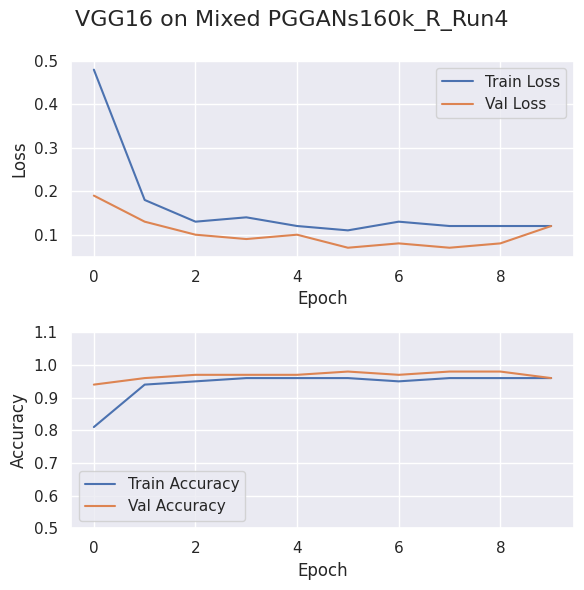

Testing on Dataset 1
13/13 [==============================] - 3s 242ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.364, 'Test Accuracy': 0.8607, 'F1 Score': 0.84, 'Sensitivity (Recall)': 0.86, 'Precision': 0.88}


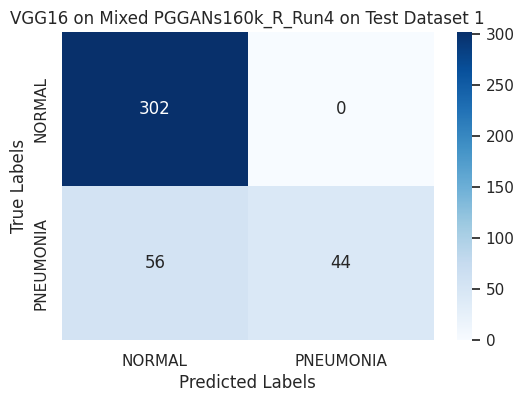

Testing on Dataset 2
13/13 [==============================] - 3s 238ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.3763, 'Test Accuracy': 0.8483, 'F1 Score': 0.82, 'Sensitivity (Recall)': 0.85, 'Precision': 0.87}


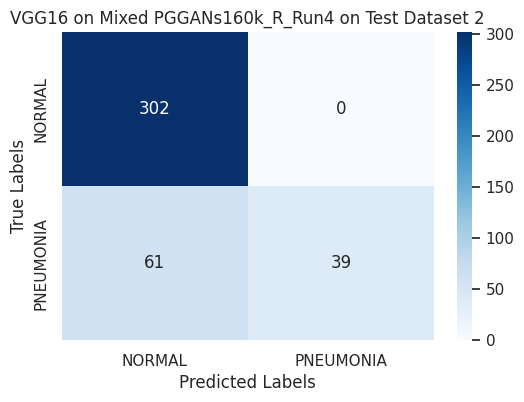

Testing on Dataset 3
13/13 [==============================] - 3s 246ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.3881, 'Test Accuracy': 0.8408, 'F1 Score': 0.81, 'Sensitivity (Recall)': 0.84, 'Precision': 0.87}


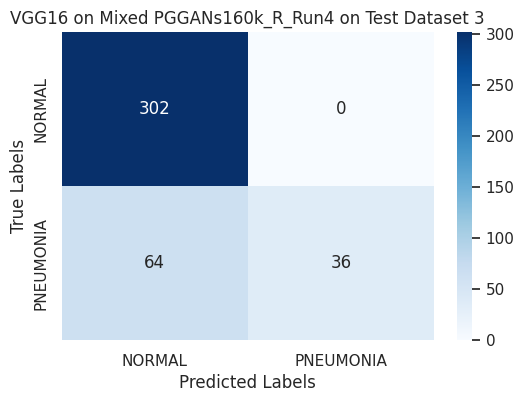

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 30s 318ms/step - loss: 0.6072 - accuracy: 0.7696 - val_loss: 0.2228 - val_accuracy: 0.9581
Epoch 2/10
93/93 [==============================] - 30s 319ms/step - loss: 0.1806 - accuracy: 0.9514 - val_loss: 0.1067 - val_accuracy: 0.9689
Epoch 3/10
93/93 [==============================] - 30s 323ms/step - loss: 0.1279 - accuracy: 0.9591 - val_loss: 0.0855 - val_accuracy: 0.9784
Epoch 4/10
93/93 [==============================] - 30s 320ms/step - loss: 0.1076 - accuracy: 0.9622 - val_loss: 0.0681 - val_accuracy: 0.9797
Epoch 5/10
93/93 [==============================] - 30s 325ms/step - loss: 0.0996 - accuracy: 0.9669 - val_loss: 0.0552 - val_accuracy: 0.9824
Epoch 6/10
93/93 [==============================] - 30s 324ms/step - loss: 0.0987 - accuracy: 0.9713 - val_loss: 0.0641 - val_accuracy: 0.9824
Epoch 7/10
93/93 [==============================] - 30s 324ms/step - loss: 0.0946 - accuracy: 0.9703 - v

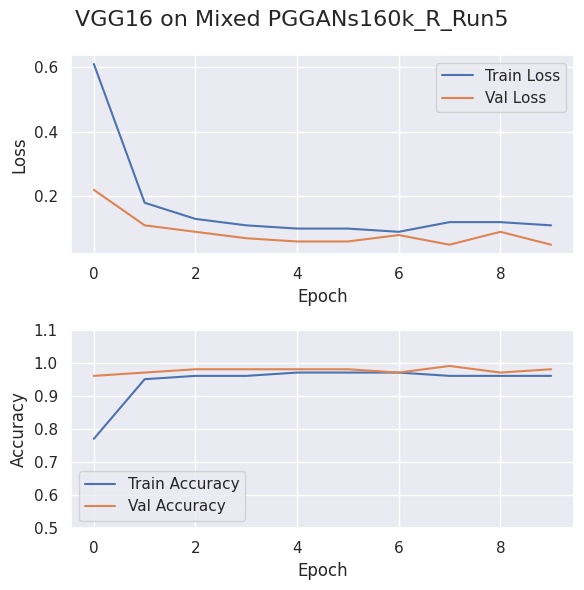

Testing on Dataset 1
13/13 [==============================] - 3s 239ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2283, 'Test Accuracy': 0.908, 'F1 Score': 0.9, 'Sensitivity (Recall)': 0.91, 'Precision': 0.91}


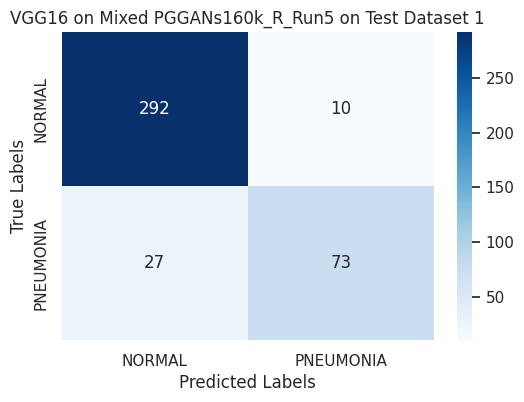

Testing on Dataset 2
13/13 [==============================] - 3s 245ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.2437, 'Test Accuracy': 0.903, 'F1 Score': 0.9, 'Sensitivity (Recall)': 0.9, 'Precision': 0.9}


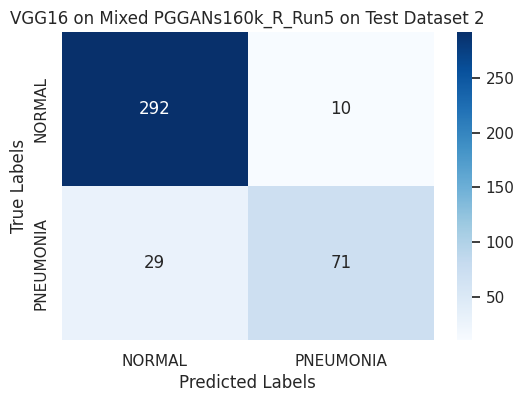

Testing on Dataset 3
13/13 [==============================] - 3s 240ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.2446, 'Test Accuracy': 0.9005, 'F1 Score': 0.9, 'Sensitivity (Recall)': 0.9, 'Precision': 0.9}


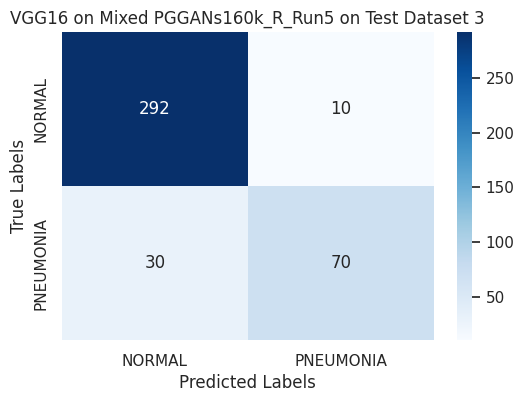

In [11]:
title = "VGG16 on Mixed PGGANs160k_R" 
file_name = "Trained_Models/training_history_plot_Mixed_PGGANs160k_R.png"

for i in range(0, 5):
    trained_model, test_metrics, confusion_matrix = imbalanced_cv_train_and_evaluate_model(
        dataset_dir_pggans160_rand, 
        test_dataset_dir_rand1, 
        test_dataset_dir_rand2, 
        test_dataset_dir_rand3, 
        class_labels,  
        vgg_model, 
        weights=None,
        input_shape= input_shape, 
        title=f"{title}_Run{i+1}", 
        file_name=file_name,  # Now treated as a keyword argument
        cv=cv, 
        epochs=epochs, 
        batch_size=batch_size
    )

## ResNet50

#### Train on Original Dataset


Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
43/43 [==============================] - 13s 248ms/step - loss: 55.9905 - accuracy: 0.8088 - val_loss: 0.2960 - val_accuracy: 0.9529
Epoch 2/10
43/43 [==============================] - 9s 220ms/step - loss: 5.0789 - accuracy: 0.8632 - val_loss: 1.0340 - val_accuracy: 0.9147
Epoch 3/10
43/43 [==============================] - 9s 219ms/step - loss: 0.5366 - accuracy: 0.9029 - val_loss: 0.2195 - val_accuracy: 0.9000
Epoch 4/10
43/43 [==============================] - 9s 221ms/step - loss: 0.2196 - accuracy: 0.9324 - val_loss: 0.1221 - val_accuracy: 0.9500
Epoch 5/10
43/43 [==============================] - 10s 222ms/step - loss: 0.2501 - accuracy: 0.9390 - val_loss: 0.1377 - val_accuracy: 0.9529
Epoch 6/10
43/43 [==============================] - 9s 219ms/step - loss: 0.1663 - accuracy: 0.9368 - val_loss: 0.2042 - val_accuracy: 0.8912
Epoch 7/10
43/43 [==============================] - 9s 219ms/step - loss: 0.6524 - accuracy: 0.9029 - val_l

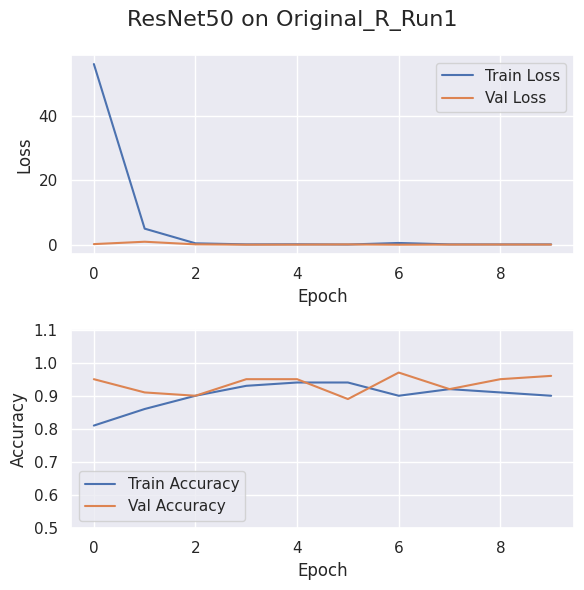

Testing on Dataset 1
13/13 [==============================] - 3s 129ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2794, 'Test Accuracy': 0.8632, 'F1 Score': 0.84, 'Sensitivity (Recall)': 0.86, 'Precision': 0.88}


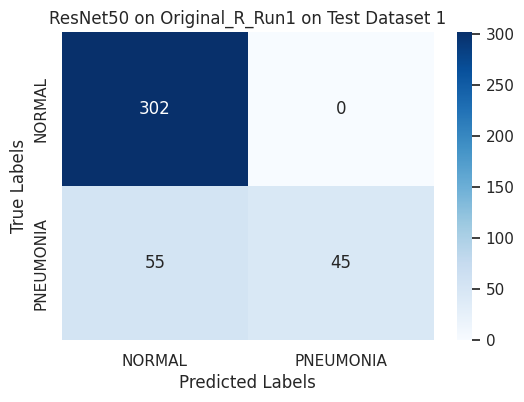

Testing on Dataset 2
13/13 [==============================] - 2s 124ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.2853, 'Test Accuracy': 0.8682, 'F1 Score': 0.85, 'Sensitivity (Recall)': 0.87, 'Precision': 0.89}


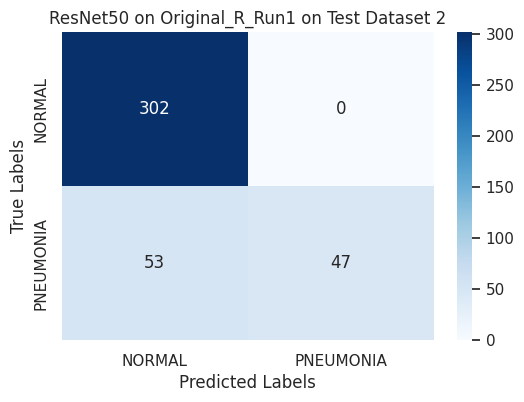

Testing on Dataset 3
13/13 [==============================] - 2s 131ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.2997, 'Test Accuracy': 0.8632, 'F1 Score': 0.84, 'Sensitivity (Recall)': 0.86, 'Precision': 0.88}


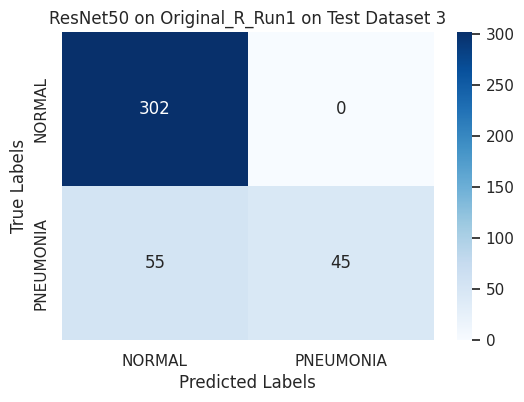

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
43/43 [==============================] - 13s 239ms/step - loss: 39.3137 - accuracy: 0.8051 - val_loss: 7.6873 - val_accuracy: 0.8824
Epoch 2/10
43/43 [==============================] - 9s 215ms/step - loss: 4.0557 - accuracy: 0.8625 - val_loss: 0.2129 - val_accuracy: 0.9559
Epoch 3/10
43/43 [==============================] - 9s 213ms/step - loss: 0.3767 - accuracy: 0.9125 - val_loss: 0.1066 - val_accuracy: 0.9588
Epoch 4/10
43/43 [==============================] - 9s 213ms/step - loss: 0.2925 - accuracy: 0.9074 - val_loss: 0.1877 - val_accuracy: 0.9088
Epoch 5/10
43/43 [==============================] - 9s 215ms/step - loss: 0.2259 - accuracy: 0.9103 - val_loss: 0.1235 - val_accuracy: 0.9618
Epoch 6/10
43/43 [==============================] - 9s 218ms/step - loss: 0.1996 - accuracy: 0.9147 - val_loss: 0.1170 - val_accuracy: 0.9676
Epoch 7/10
43/43 [==============================] - 9s 220ms/step - loss: 0.2304 - accuracy: 0.8963 - val_lo

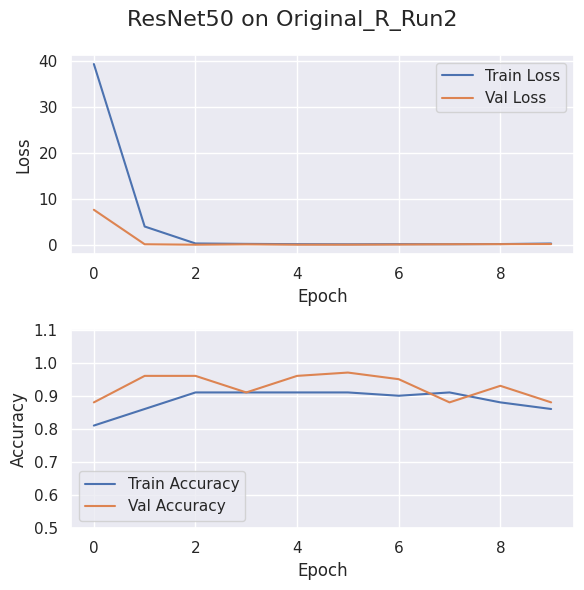

Testing on Dataset 1
13/13 [==============================] - 2s 126ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.3411, 'Test Accuracy': 0.7512, 'F1 Score': 0.64, 'Sensitivity (Recall)': 0.75, 'Precision': 0.56}


/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control th

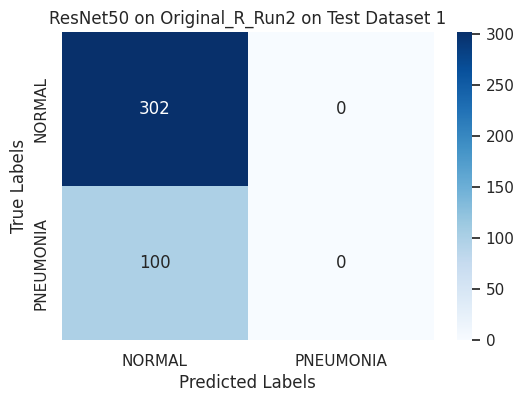

Testing on Dataset 2
13/13 [==============================] - 2s 129ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.3421, 'Test Accuracy': 0.7512, 'F1 Score': 0.64, 'Sensitivity (Recall)': 0.75, 'Precision': 0.56}


/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control th

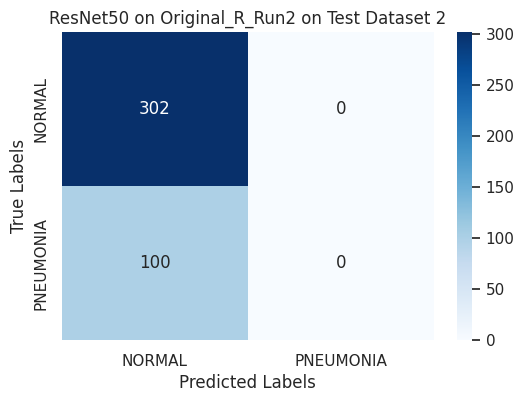

Testing on Dataset 3
13/13 [==============================] - 2s 129ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.3471, 'Test Accuracy': 0.7512, 'F1 Score': 0.64, 'Sensitivity (Recall)': 0.75, 'Precision': 0.56}


/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control th

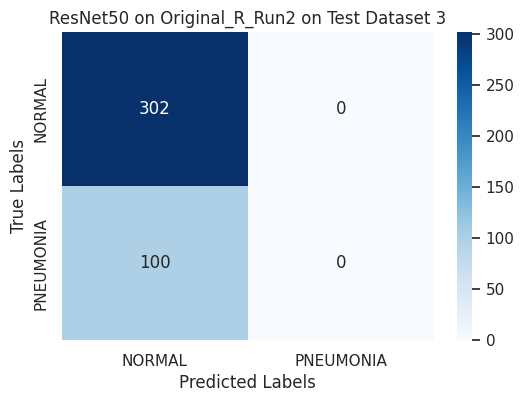

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
43/43 [==============================] - 14s 245ms/step - loss: 30.8660 - accuracy: 0.8191 - val_loss: 0.6871 - val_accuracy: 0.9382
Epoch 2/10
43/43 [==============================] - 10s 223ms/step - loss: 1.5341 - accuracy: 0.8669 - val_loss: 0.1854 - val_accuracy: 0.9324
Epoch 3/10
43/43 [==============================] - 9s 220ms/step - loss: 0.3514 - accuracy: 0.8779 - val_loss: 0.2063 - val_accuracy: 0.8824
Epoch 4/10
43/43 [==============================] - 9s 219ms/step - loss: 0.2599 - accuracy: 0.8934 - val_loss: 0.1740 - val_accuracy: 0.9088
Epoch 5/10
43/43 [==============================] - 9s 222ms/step - loss: 0.2430 - accuracy: 0.8765 - val_loss: 0.1348 - val_accuracy: 0.9588
Epoch 6/10
43/43 [==============================] - 9s 219ms/step - loss: 0.2144 - accuracy: 0.8919 - val_loss: 0.1702 - val_accuracy: 0.9588
Epoch 7/10
43/43 [==============================] - 9s 220ms/step - loss: 0.2907 - accuracy: 0.8471 - val_l

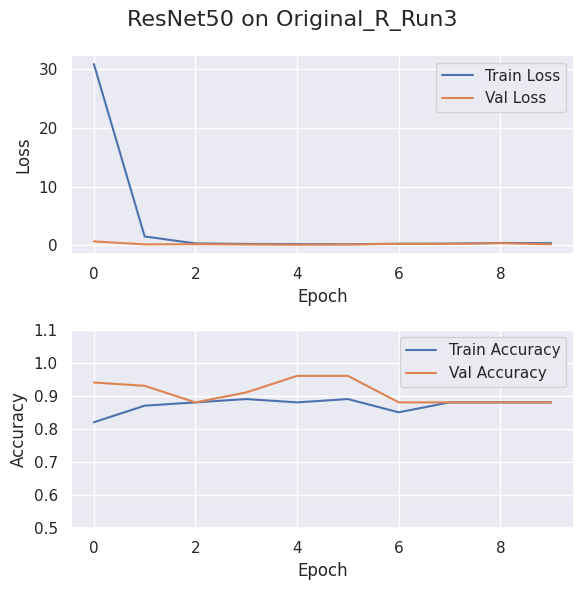

Testing on Dataset 1
13/13 [==============================] - 3s 130ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.3734, 'Test Accuracy': 0.7512, 'F1 Score': 0.64, 'Sensitivity (Recall)': 0.75, 'Precision': 0.56}


/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control th

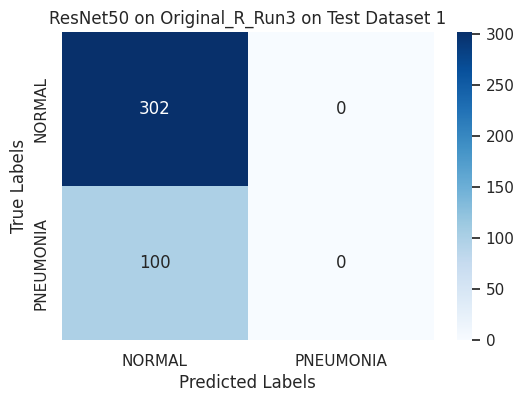

Testing on Dataset 2
13/13 [==============================] - 2s 128ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.3821, 'Test Accuracy': 0.7512, 'F1 Score': 0.64, 'Sensitivity (Recall)': 0.75, 'Precision': 0.56}


/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control th

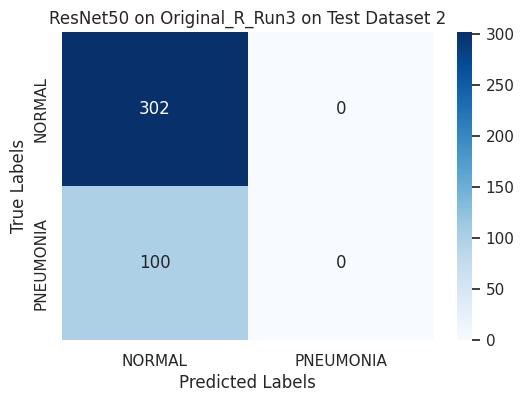

Testing on Dataset 3
13/13 [==============================] - 2s 129ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.3917, 'Test Accuracy': 0.7512, 'F1 Score': 0.64, 'Sensitivity (Recall)': 0.75, 'Precision': 0.56}


/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/users/PCS0229/imankhazrak/miniconda3/envs/ddpm_pytorch/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control th

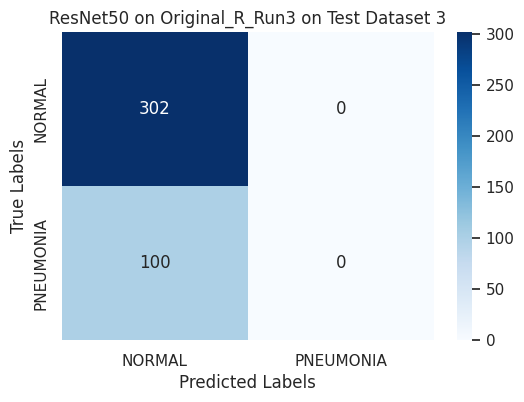

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
43/43 [==============================] - 13s 241ms/step - loss: 27.6295 - accuracy: 0.8132 - val_loss: 2.5665 - val_accuracy: 0.8824
Epoch 2/10
43/43 [==============================] - 9s 218ms/step - loss: 1.0559 - accuracy: 0.8596 - val_loss: 1.6841 - val_accuracy: 0.8824
Epoch 3/10
43/43 [==============================] - 9s 220ms/step - loss: 0.3881 - accuracy: 0.8897 - val_loss: 0.1671 - val_accuracy: 0.9324
Epoch 4/10
43/43 [==============================] - 9s 217ms/step - loss: 0.2068 - accuracy: 0.9000 - val_loss: 0.1500 - val_accuracy: 0.9294
Epoch 5/10
43/43 [==============================] - 9s 218ms/step - loss: 0.1967 - accuracy: 0.9154 - val_loss: 0.1738 - val_accuracy: 0.9500
Epoch 6/10
43/43 [==============================] - 9s 219ms/step - loss: 0.2285 - accuracy: 0.8772 - val_loss: 0.1405 - val_accuracy: 0.9412
Epoch 7/10
43/43 [==============================] - 9s 220ms/step - loss: 0.2237 - accuracy: 0.8809 - val_lo

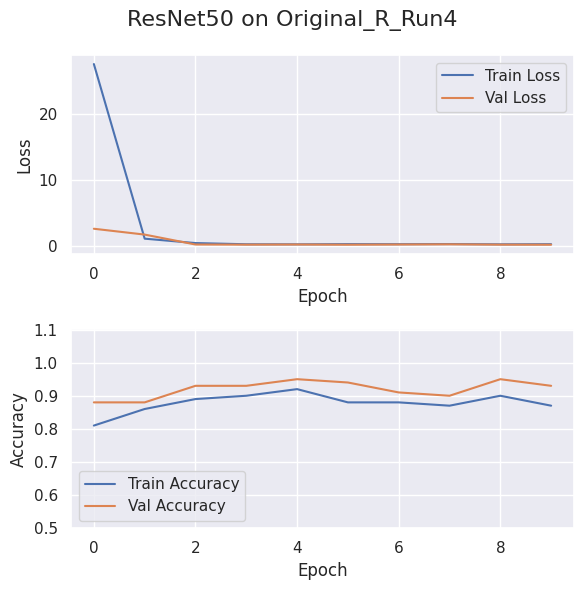

Testing on Dataset 1
13/13 [==============================] - 3s 130ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2931, 'Test Accuracy': 0.8333, 'F1 Score': 0.8, 'Sensitivity (Recall)': 0.83, 'Precision': 0.86}


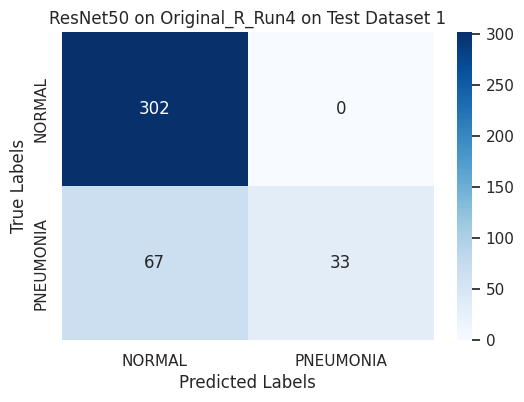

Testing on Dataset 2
13/13 [==============================] - 2s 129ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.3252, 'Test Accuracy': 0.8234, 'F1 Score': 0.78, 'Sensitivity (Recall)': 0.82, 'Precision': 0.86}


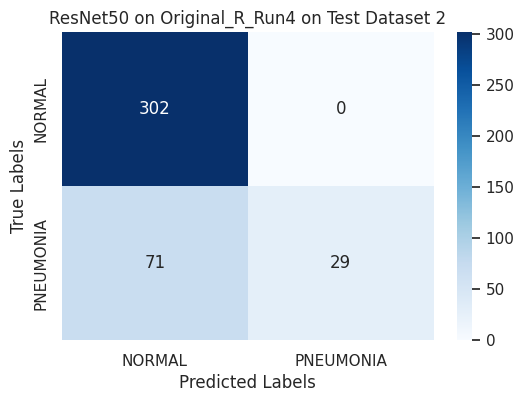

Testing on Dataset 3
13/13 [==============================] - 2s 132ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.3391, 'Test Accuracy': 0.8209, 'F1 Score': 0.78, 'Sensitivity (Recall)': 0.82, 'Precision': 0.86}


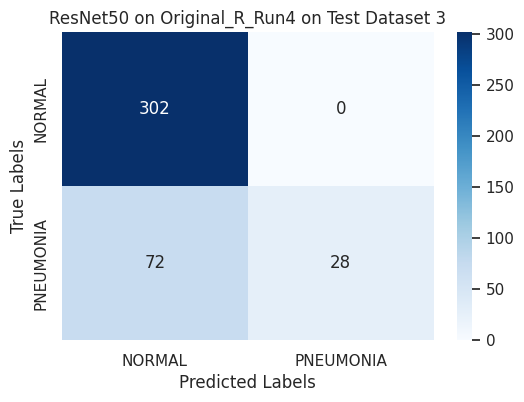

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
43/43 [==============================] - 13s 242ms/step - loss: 45.0840 - accuracy: 0.8154 - val_loss: 0.5195 - val_accuracy: 0.9324
Epoch 2/10
43/43 [==============================] - 9s 220ms/step - loss: 2.4922 - accuracy: 0.8868 - val_loss: 0.4100 - val_accuracy: 0.9471
Epoch 3/10
43/43 [==============================] - 10s 225ms/step - loss: 0.5529 - accuracy: 0.9015 - val_loss: 0.5478 - val_accuracy: 0.8853
Epoch 4/10
43/43 [==============================] - 10s 222ms/step - loss: 0.2819 - accuracy: 0.9088 - val_loss: 0.1516 - val_accuracy: 0.9235
Epoch 5/10
43/43 [==============================] - 9s 220ms/step - loss: 0.1990 - accuracy: 0.9331 - val_loss: 0.1304 - val_accuracy: 0.9765
Epoch 6/10
43/43 [==============================] - 10s 224ms/step - loss: 0.2039 - accuracy: 0.9257 - val_loss: 0.1191 - val_accuracy: 0.9647
Epoch 7/10
43/43 [==============================] - 10s 223ms/step - loss: 0.1707 - accuracy: 0.9338 - va

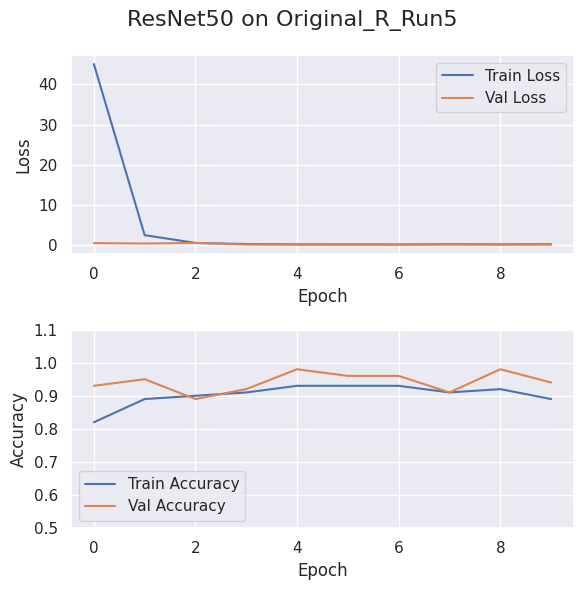

Testing on Dataset 1
13/13 [==============================] - 3s 133ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.306, 'Test Accuracy': 0.8209, 'F1 Score': 0.78, 'Sensitivity (Recall)': 0.82, 'Precision': 0.86}


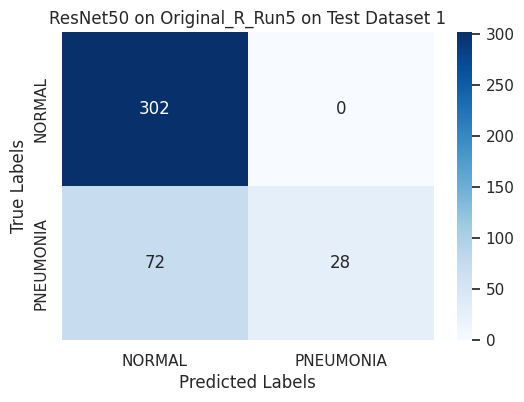

Testing on Dataset 2
13/13 [==============================] - 2s 131ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.3241, 'Test Accuracy': 0.8159, 'F1 Score': 0.77, 'Sensitivity (Recall)': 0.82, 'Precision': 0.85}


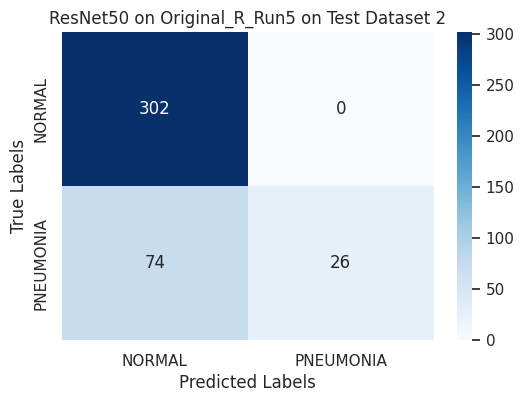

Testing on Dataset 3
13/13 [==============================] - 2s 129ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.3424, 'Test Accuracy': 0.8035, 'F1 Score': 0.75, 'Sensitivity (Recall)': 0.8, 'Precision': 0.84}


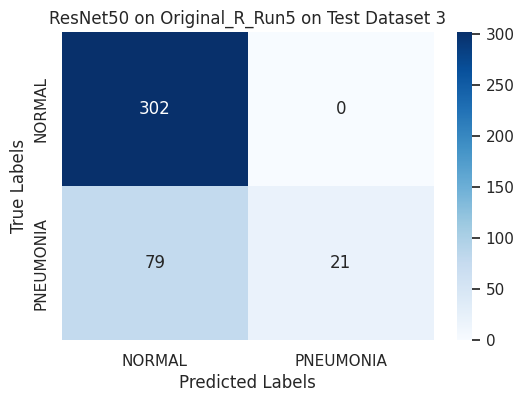

In [12]:

title = "ResNet50 on Original_R"
file_name = "Trained_Models/ResNet50_training_history_plot_original_R.png"

for i in range(0, 5):
    trained_model, test_metrics, confusion_matrix = imbalanced_cv_train_and_evaluate_model(
        dataset_dir_org_rand, 
        test_dataset_dir_rand1, 
        test_dataset_dir_rand2, 
        test_dataset_dir_rand3, 
        class_labels,  
        resnet_model, 
        weights=None,
        input_shape= input_shape, 
        title=f"{title}_Run{i+1}", 
        file_name=file_name,  # Now treated as a keyword argument
        cv=cv, 
        epochs=epochs, 
        batch_size=batch_size
    )

#### Train on Mixed DDPM Dataset


Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 25s 234ms/step - loss: 12.6578 - accuracy: 0.7929 - val_loss: 0.1203 - val_accuracy: 0.9635
Epoch 2/10
93/93 [==============================] - 20s 219ms/step - loss: 0.2673 - accuracy: 0.9149 - val_loss: 0.1124 - val_accuracy: 0.9689
Epoch 3/10
93/93 [==============================] - 20s 217ms/step - loss: 0.1576 - accuracy: 0.9395 - val_loss: 0.0841 - val_accuracy: 0.9649
Epoch 4/10
93/93 [==============================] - 20s 220ms/step - loss: 0.2506 - accuracy: 0.9081 - val_loss: 0.0759 - val_accuracy: 0.9824
Epoch 5/10
93/93 [==============================] - 20s 221ms/step - loss: 0.2065 - accuracy: 0.8980 - val_loss: 0.1057 - val_accuracy: 0.9662
Epoch 6/10
93/93 [==============================] - 21s 221ms/step - loss: 0.2878 - accuracy: 0.8118 - val_loss: 0.1991 - val_accuracy: 0.9595
Epoch 7/10
93/93 [==============================] - 20s 221ms/step - loss: 0.4533 - accuracy: 0.7578 - 

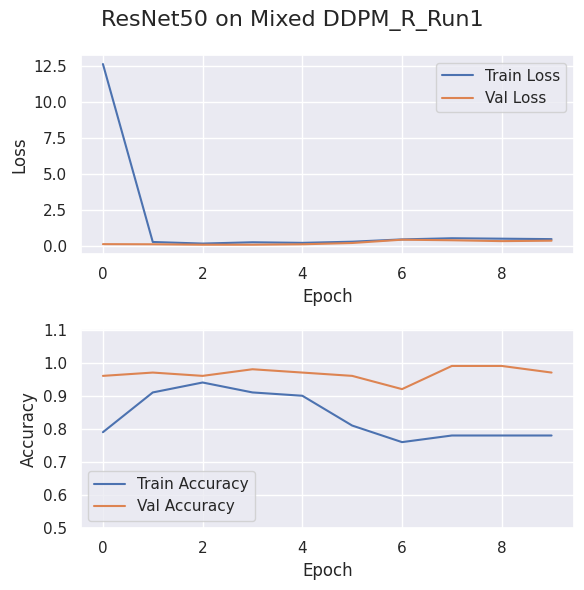

Testing on Dataset 1
13/13 [==============================] - 3s 133ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.3103, 'Test Accuracy': 0.9279, 'F1 Score': 0.93, 'Sensitivity (Recall)': 0.93, 'Precision': 0.94}


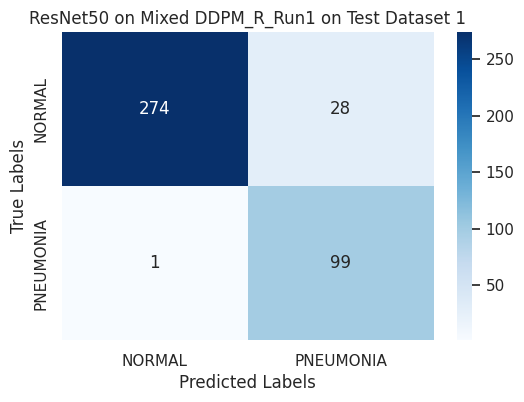

Testing on Dataset 2
13/13 [==============================] - 2s 128ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.3181, 'Test Accuracy': 0.9179, 'F1 Score': 0.92, 'Sensitivity (Recall)': 0.92, 'Precision': 0.93}


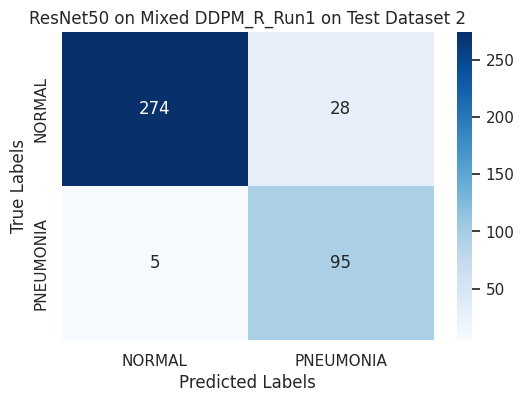

Testing on Dataset 3
13/13 [==============================] - 2s 131ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.3109, 'Test Accuracy': 0.9279, 'F1 Score': 0.93, 'Sensitivity (Recall)': 0.93, 'Precision': 0.94}


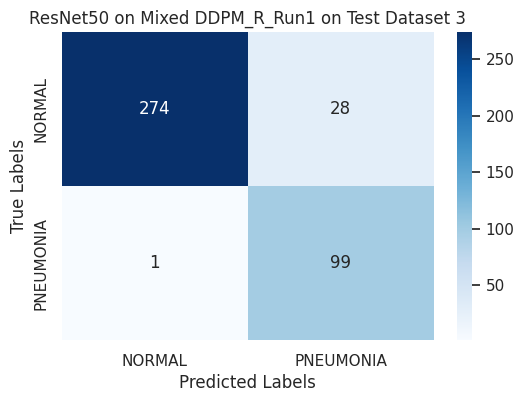

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 24s 232ms/step - loss: 15.2622 - accuracy: 0.7858 - val_loss: 0.2021 - val_accuracy: 0.9541
Epoch 2/10
93/93 [==============================] - 21s 224ms/step - loss: 0.2804 - accuracy: 0.9236 - val_loss: 0.1346 - val_accuracy: 0.9500
Epoch 3/10
93/93 [==============================] - 20s 220ms/step - loss: 0.2717 - accuracy: 0.9209 - val_loss: 0.2003 - val_accuracy: 0.9257
Epoch 4/10
93/93 [==============================] - 20s 218ms/step - loss: 0.1987 - accuracy: 0.9304 - val_loss: 0.0756 - val_accuracy: 0.9689
Epoch 5/10
93/93 [==============================] - 20s 217ms/step - loss: 0.2317 - accuracy: 0.9030 - val_loss: 0.0848 - val_accuracy: 0.9743
Epoch 6/10
93/93 [==============================] - 21s 221ms/step - loss: 0.2092 - accuracy: 0.9115 - val_loss: 0.1073 - val_accuracy: 0.9581
Epoch 7/10
93/93 [==============================] - 20s 217ms/step - loss: 0.2259 - accuracy: 0.9125 - 

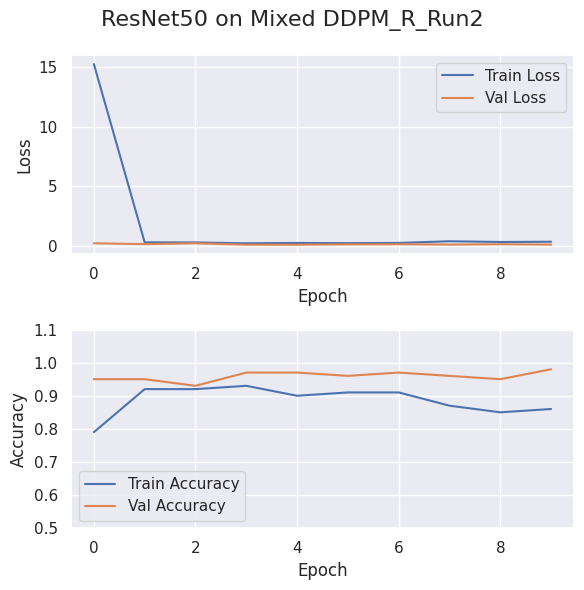

Testing on Dataset 1
13/13 [==============================] - 3s 129ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2128, 'Test Accuracy': 0.9154, 'F1 Score': 0.91, 'Sensitivity (Recall)': 0.92, 'Precision': 0.92}


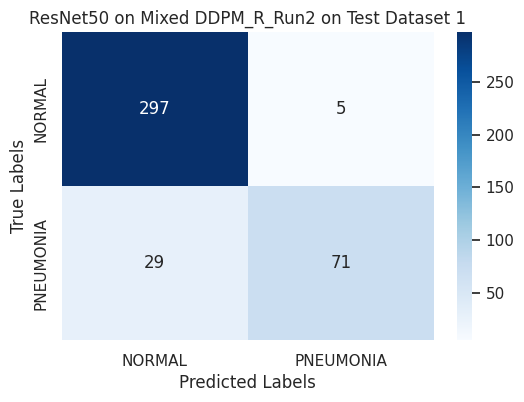

Testing on Dataset 2
13/13 [==============================] - 2s 127ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.2494, 'Test Accuracy': 0.9104, 'F1 Score': 0.91, 'Sensitivity (Recall)': 0.91, 'Precision': 0.91}


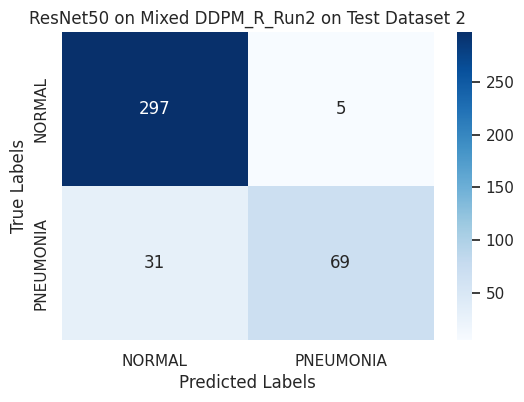

Testing on Dataset 3
13/13 [==============================] - 2s 129ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.2548, 'Test Accuracy': 0.9104, 'F1 Score': 0.91, 'Sensitivity (Recall)': 0.91, 'Precision': 0.91}


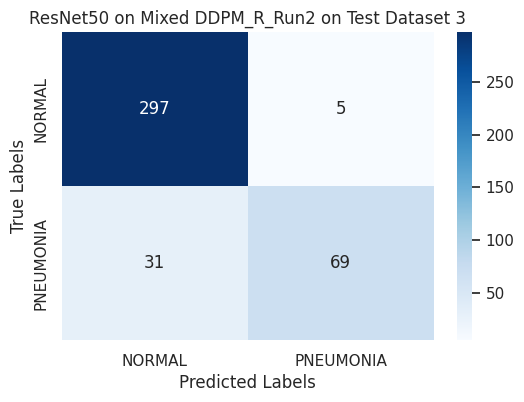

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 24s 226ms/step - loss: 12.9060 - accuracy: 0.7527 - val_loss: 0.2435 - val_accuracy: 0.9054
Epoch 2/10
93/93 [==============================] - 20s 217ms/step - loss: 0.4090 - accuracy: 0.8733 - val_loss: 0.1479 - val_accuracy: 0.9514
Epoch 3/10
93/93 [==============================] - 20s 216ms/step - loss: 0.2848 - accuracy: 0.8709 - val_loss: 0.1766 - val_accuracy: 0.9797
Epoch 4/10
93/93 [==============================] - 20s 219ms/step - loss: 0.2921 - accuracy: 0.8422 - val_loss: 0.2210 - val_accuracy: 0.9338
Epoch 5/10
93/93 [==============================] - 21s 223ms/step - loss: 0.3137 - accuracy: 0.7861 - val_loss: 0.0850 - val_accuracy: 0.9716
Epoch 6/10
93/93 [==============================] - 20s 220ms/step - loss: 0.3813 - accuracy: 0.7632 - val_loss: 0.1696 - val_accuracy: 0.9257
Epoch 7/10
93/93 [==============================] - 20s 217ms/step - loss: 0.3856 - accuracy: 0.7797 - 

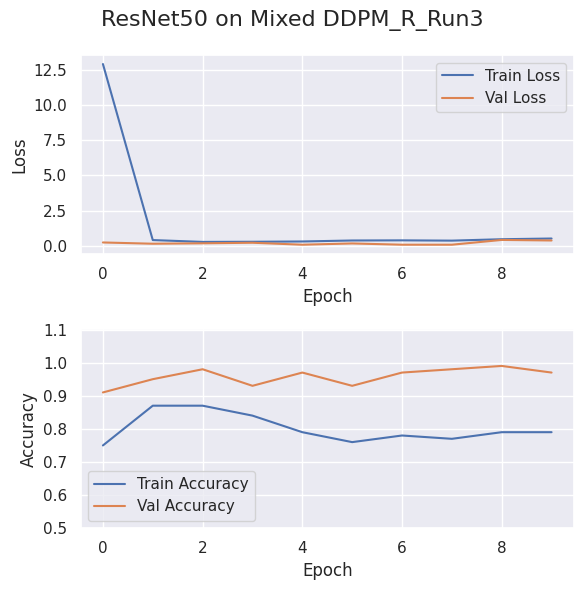

Testing on Dataset 1
13/13 [==============================] - 3s 132ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2835, 'Test Accuracy': 0.9279, 'F1 Score': 0.93, 'Sensitivity (Recall)': 0.93, 'Precision': 0.94}


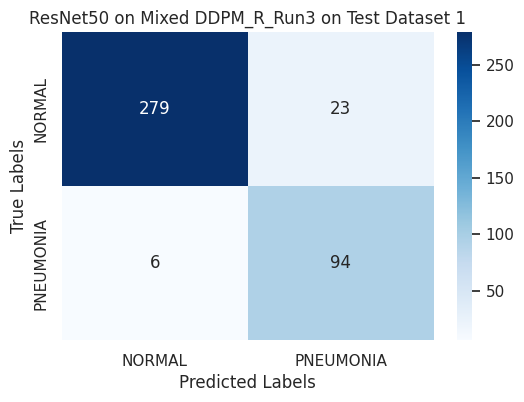

Testing on Dataset 2
13/13 [==============================] - 2s 128ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.2945, 'Test Accuracy': 0.9229, 'F1 Score': 0.92, 'Sensitivity (Recall)': 0.92, 'Precision': 0.93}


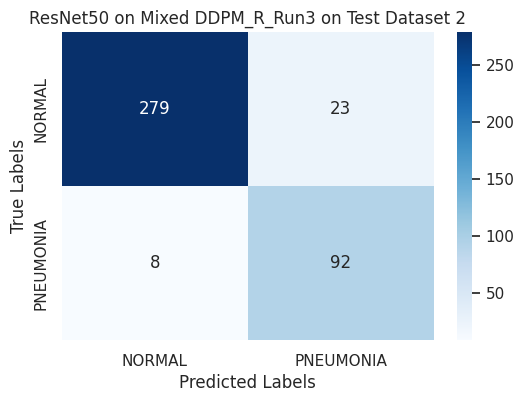

Testing on Dataset 3
13/13 [==============================] - 2s 129ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.2852, 'Test Accuracy': 0.9229, 'F1 Score': 0.92, 'Sensitivity (Recall)': 0.92, 'Precision': 0.93}


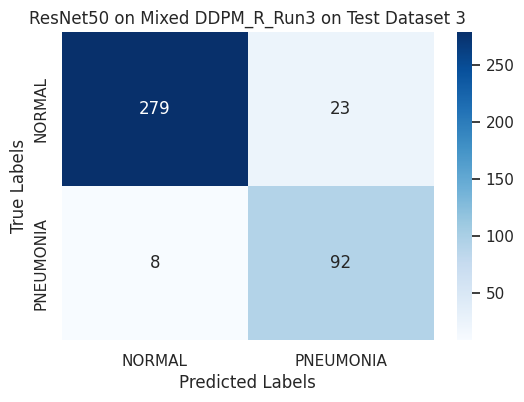

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 25s 240ms/step - loss: 24.5697 - accuracy: 0.7409 - val_loss: 0.2493 - val_accuracy: 0.8959
Epoch 2/10
93/93 [==============================] - 21s 228ms/step - loss: 0.2865 - accuracy: 0.8764 - val_loss: 0.1315 - val_accuracy: 0.9514
Epoch 3/10
93/93 [==============================] - 21s 227ms/step - loss: 0.2520 - accuracy: 0.9142 - val_loss: 0.0942 - val_accuracy: 0.9662
Epoch 4/10
93/93 [==============================] - 21s 227ms/step - loss: 0.2008 - accuracy: 0.9321 - val_loss: 0.0911 - val_accuracy: 0.9743
Epoch 5/10
93/93 [==============================] - 21s 226ms/step - loss: 0.1894 - accuracy: 0.9267 - val_loss: 0.0868 - val_accuracy: 0.9838
Epoch 6/10
93/93 [==============================] - 21s 229ms/step - loss: 0.1812 - accuracy: 0.9291 - val_loss: 0.0618 - val_accuracy: 0.9770
Epoch 7/10
93/93 [==============================] - 21s 229ms/step - loss: 0.2200 - accuracy: 0.8885 - 

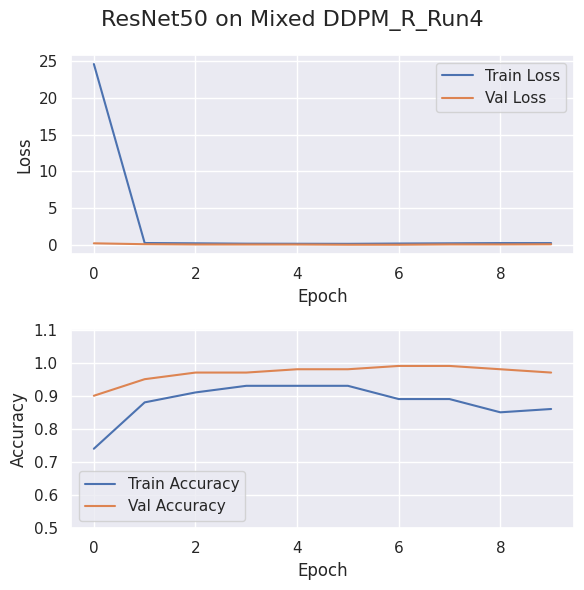

Testing on Dataset 1
13/13 [==============================] - 3s 129ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2827, 'Test Accuracy': 0.9005, 'F1 Score': 0.9, 'Sensitivity (Recall)': 0.9, 'Precision': 0.92}


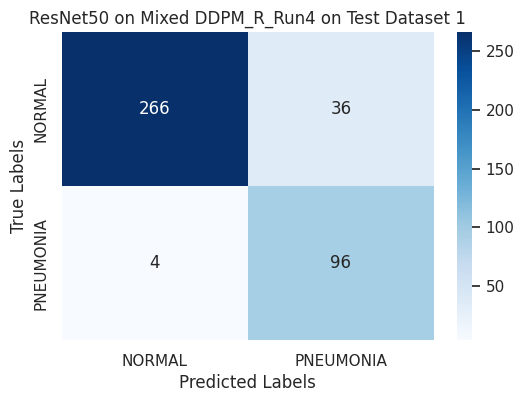

Testing on Dataset 2
13/13 [==============================] - 2s 129ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.2975, 'Test Accuracy': 0.893, 'F1 Score': 0.9, 'Sensitivity (Recall)': 0.89, 'Precision': 0.91}


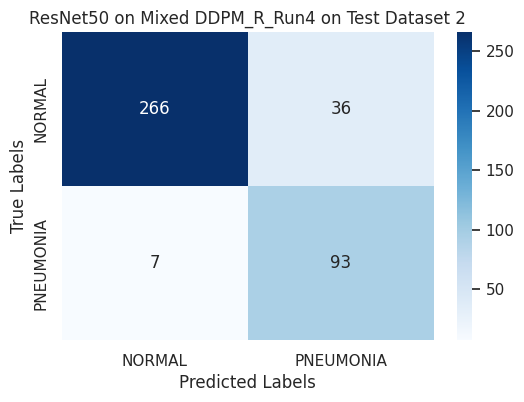

Testing on Dataset 3
13/13 [==============================] - 2s 129ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.2925, 'Test Accuracy': 0.8856, 'F1 Score': 0.89, 'Sensitivity (Recall)': 0.89, 'Precision': 0.9}


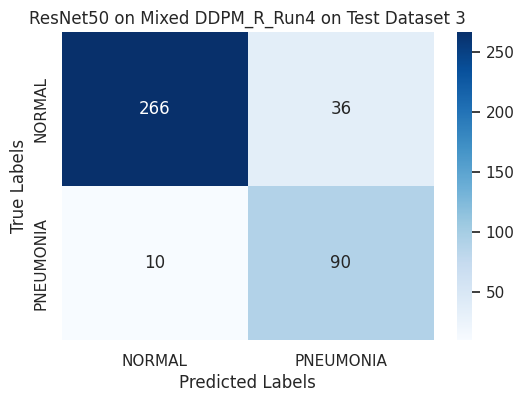

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 25s 233ms/step - loss: 16.4487 - accuracy: 0.6801 - val_loss: 0.2979 - val_accuracy: 0.9257
Epoch 2/10
93/93 [==============================] - 20s 220ms/step - loss: 0.4369 - accuracy: 0.7463 - val_loss: 0.2582 - val_accuracy: 0.9500
Epoch 3/10
93/93 [==============================] - 20s 218ms/step - loss: 0.3598 - accuracy: 0.7676 - val_loss: 0.2689 - val_accuracy: 0.9743
Epoch 4/10
93/93 [==============================] - 20s 217ms/step - loss: 0.4251 - accuracy: 0.7713 - val_loss: 0.3060 - val_accuracy: 0.9649
Epoch 5/10
93/93 [==============================] - 21s 221ms/step - loss: 0.4279 - accuracy: 0.8098 - val_loss: 0.3238 - val_accuracy: 0.9797
Epoch 6/10
93/93 [==============================] - 20s 220ms/step - loss: 0.4138 - accuracy: 0.8057 - val_loss: 0.2724 - val_accuracy: 0.9541
Epoch 7/10
93/93 [==============================] - 21s 222ms/step - loss: 0.3863 - accuracy: 0.8240 - 

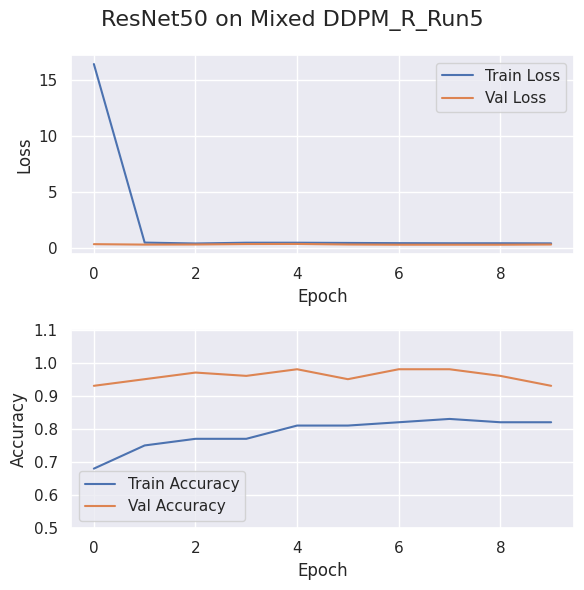

Testing on Dataset 1
13/13 [==============================] - 3s 131ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.5802, 'Test Accuracy': 0.8632, 'F1 Score': 0.87, 'Sensitivity (Recall)': 0.86, 'Precision': 0.9}


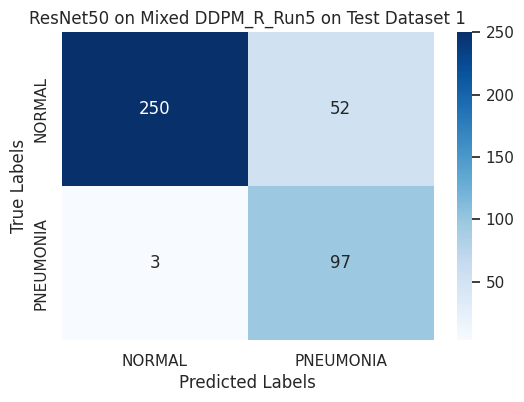

Testing on Dataset 2
13/13 [==============================] - 2s 128ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.5884, 'Test Accuracy': 0.8557, 'F1 Score': 0.86, 'Sensitivity (Recall)': 0.86, 'Precision': 0.89}


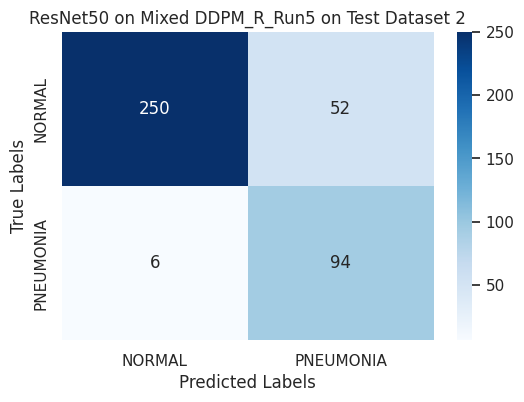

Testing on Dataset 3
13/13 [==============================] - 2s 131ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.586, 'Test Accuracy': 0.8557, 'F1 Score': 0.86, 'Sensitivity (Recall)': 0.86, 'Precision': 0.89}


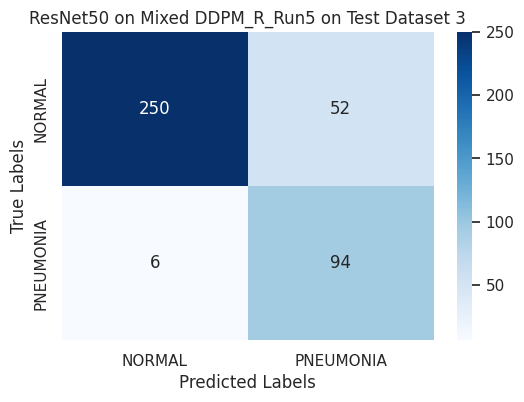

In [13]:
title = "ResNet50 on Mixed DDPM_R"
file_name = "Trained_Models/ResNet50_training_history_plot_Mixed_DDPM_R.png"

for i in range(0, 5):
    trained_model, test_metrics, confusion_matrix = imbalanced_cv_train_and_evaluate_model(
        dataset_dir_ddpm_rand, 
        test_dataset_dir_rand1, 
        test_dataset_dir_rand2, 
        test_dataset_dir_rand3, 
        class_labels,  
        resnet_model, 
        weights=None,
        input_shape= input_shape, 
        title=f"{title}_Run{i+1}", 
        file_name=file_name,  # Now treated as a keyword argument
        cv=cv, 
        epochs=epochs, 
        batch_size=batch_size
    )

#### Train on Mixed PGGANs150k Dataset

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 24s 226ms/step - loss: 11.3801 - accuracy: 0.8760 - val_loss: 1.1240 - val_accuracy: 0.9608
Epoch 2/10
93/93 [==============================] - 20s 213ms/step - loss: 0.8177 - accuracy: 0.9226 - val_loss: 0.1340 - val_accuracy: 0.9622
Epoch 3/10
93/93 [==============================] - 20s 215ms/step - loss: 0.3748 - accuracy: 0.9365 - val_loss: 0.0801 - val_accuracy: 0.9689
Epoch 4/10
93/93 [==============================] - 20s 215ms/step - loss: 0.2082 - accuracy: 0.9368 - val_loss: 0.1322 - val_accuracy: 0.9581
Epoch 5/10
93/93 [==============================] - 20s 217ms/step - loss: 0.1468 - accuracy: 0.9307 - val_loss: 0.0799 - val_accuracy: 0.9703
Epoch 6/10
93/93 [==============================] - 20s 218ms/step - loss: 0.1392 - accuracy: 0.9365 - val_loss: 0.0742 - val_accuracy: 0.9730
Epoch 7/10
93/93 [==============================] - 20s 217ms/step - loss: 0.1285 - accuracy: 0.9341 - 

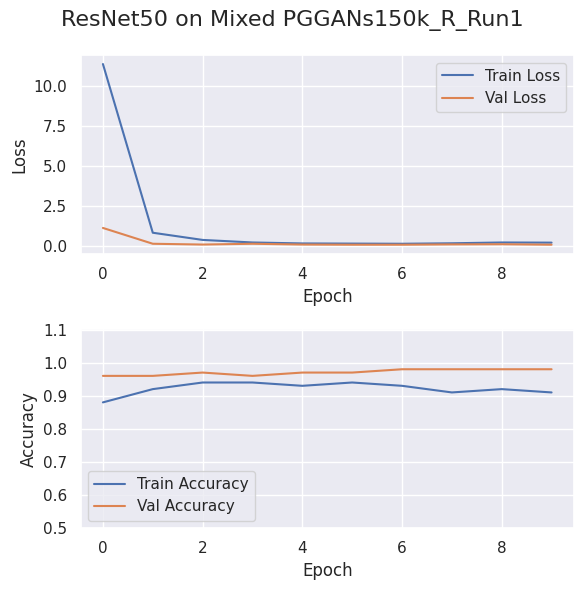

Testing on Dataset 1
13/13 [==============================] - 2s 125ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.3717, 'Test Accuracy': 0.8408, 'F1 Score': 0.82, 'Sensitivity (Recall)': 0.84, 'Precision': 0.85}


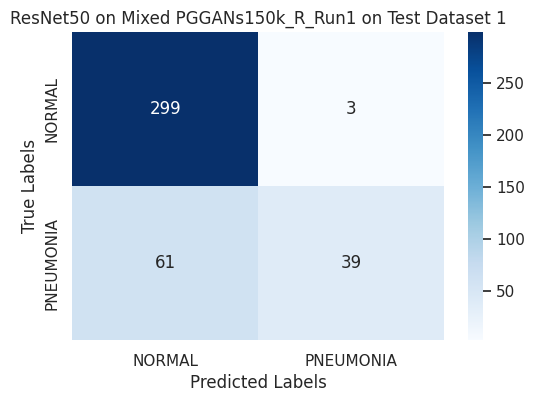

Testing on Dataset 2
13/13 [==============================] - 2s 127ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.3791, 'Test Accuracy': 0.8383, 'F1 Score': 0.81, 'Sensitivity (Recall)': 0.84, 'Precision': 0.85}


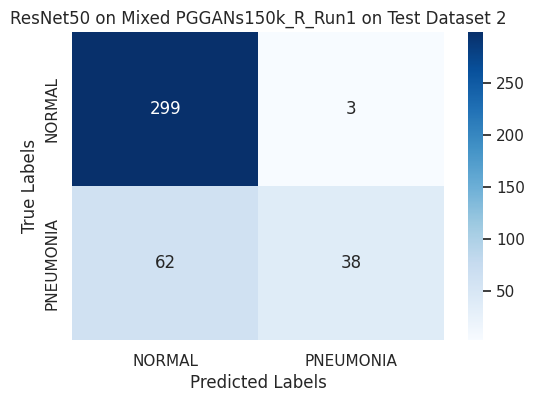

Testing on Dataset 3
13/13 [==============================] - 2s 127ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.4166, 'Test Accuracy': 0.8209, 'F1 Score': 0.79, 'Sensitivity (Recall)': 0.82, 'Precision': 0.84}


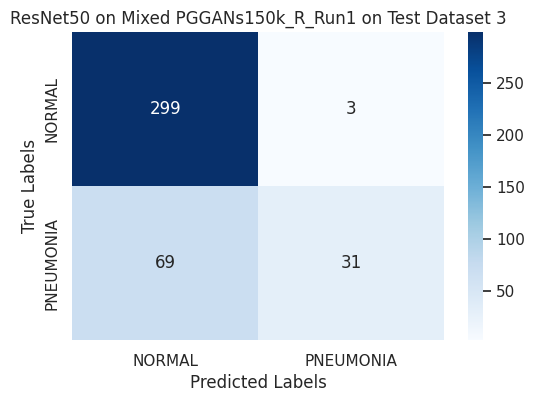

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 26s 236ms/step - loss: 11.7387 - accuracy: 0.8443 - val_loss: 0.3657 - val_accuracy: 0.9203
Epoch 2/10
93/93 [==============================] - 21s 225ms/step - loss: 0.2314 - accuracy: 0.9439 - val_loss: 0.1356 - val_accuracy: 0.9649
Epoch 3/10
93/93 [==============================] - 21s 223ms/step - loss: 0.1233 - accuracy: 0.9588 - val_loss: 0.0973 - val_accuracy: 0.9622
Epoch 4/10
93/93 [==============================] - 21s 225ms/step - loss: 0.1466 - accuracy: 0.9429 - val_loss: 0.0831 - val_accuracy: 0.9703
Epoch 5/10
93/93 [==============================] - 21s 224ms/step - loss: 0.1681 - accuracy: 0.9233 - val_loss: 0.0760 - val_accuracy: 0.9743
Epoch 6/10
93/93 [==============================] - 21s 223ms/step - loss: 0.2186 - accuracy: 0.9291 - val_loss: 0.0613 - val_accuracy: 0.9730
Epoch 7/10
93/93 [==============================] - 21s 223ms/step - loss: 0.1533 - accuracy: 0.9236 - 

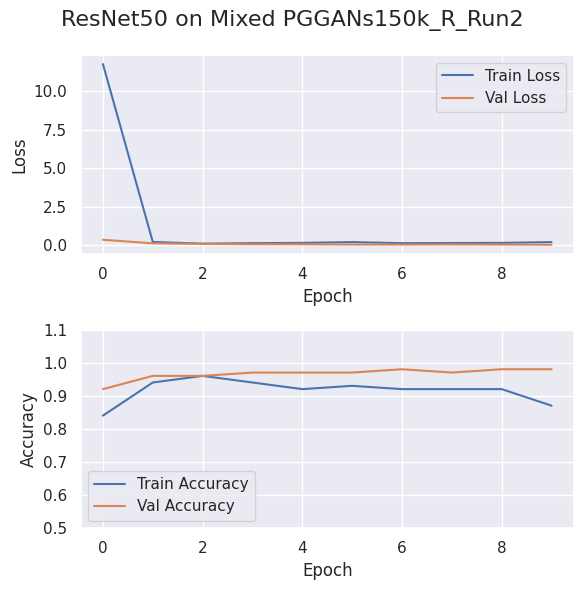

Testing on Dataset 1
13/13 [==============================] - 3s 134ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.3673, 'Test Accuracy': 0.8607, 'F1 Score': 0.84, 'Sensitivity (Recall)': 0.86, 'Precision': 0.87}


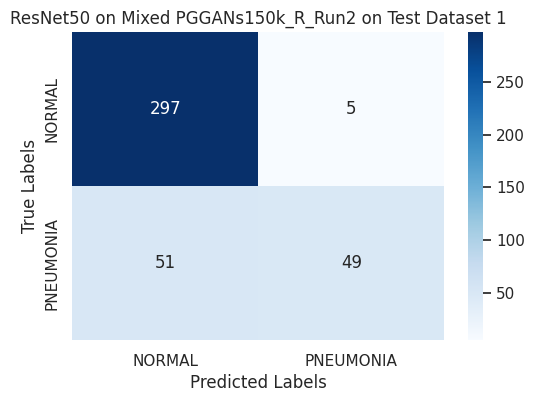

Testing on Dataset 2
13/13 [==============================] - 2s 127ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.3756, 'Test Accuracy': 0.8632, 'F1 Score': 0.85, 'Sensitivity (Recall)': 0.86, 'Precision': 0.87}


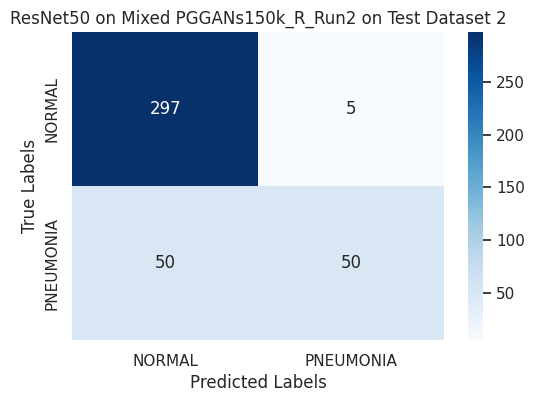

Testing on Dataset 3
13/13 [==============================] - 2s 128ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.4341, 'Test Accuracy': 0.8383, 'F1 Score': 0.81, 'Sensitivity (Recall)': 0.84, 'Precision': 0.85}


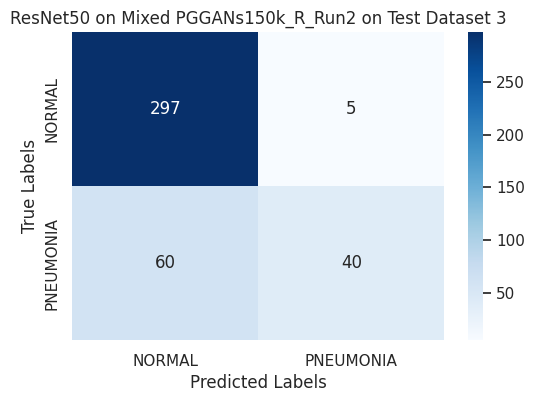

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 24s 230ms/step - loss: 10.3968 - accuracy: 0.8598 - val_loss: 0.1207 - val_accuracy: 0.9541
Epoch 2/10
93/93 [==============================] - 20s 217ms/step - loss: 0.1699 - accuracy: 0.9439 - val_loss: 0.1758 - val_accuracy: 0.9216
Epoch 3/10
93/93 [==============================] - 20s 216ms/step - loss: 0.2611 - accuracy: 0.9294 - val_loss: 0.0668 - val_accuracy: 0.9770
Epoch 4/10
93/93 [==============================] - 20s 220ms/step - loss: 0.1328 - accuracy: 0.9493 - val_loss: 0.0755 - val_accuracy: 0.9689
Epoch 5/10
93/93 [==============================] - 21s 221ms/step - loss: 0.1340 - accuracy: 0.9402 - val_loss: 0.0630 - val_accuracy: 0.9797
Epoch 6/10
93/93 [==============================] - 20s 218ms/step - loss: 0.1287 - accuracy: 0.9392 - val_loss: 0.0710 - val_accuracy: 0.9757
Epoch 7/10
93/93 [==============================] - 20s 216ms/step - loss: 0.1368 - accuracy: 0.9209 - 

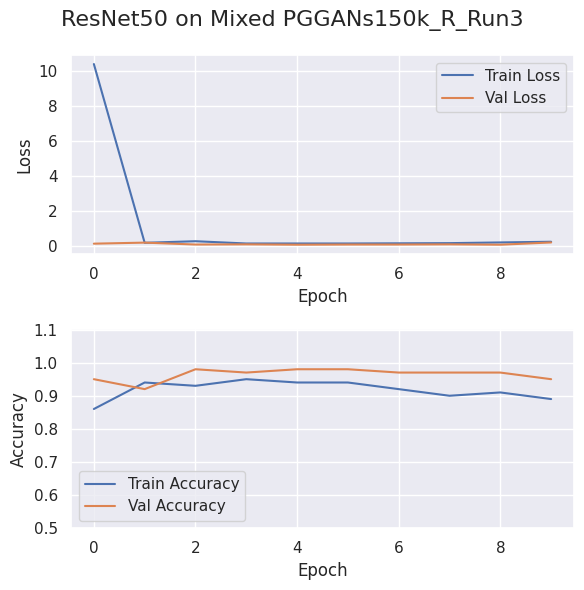

Testing on Dataset 1
13/13 [==============================] - 3s 126ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.4727, 'Test Accuracy': 0.7935, 'F1 Score': 0.76, 'Sensitivity (Recall)': 0.79, 'Precision': 0.78}


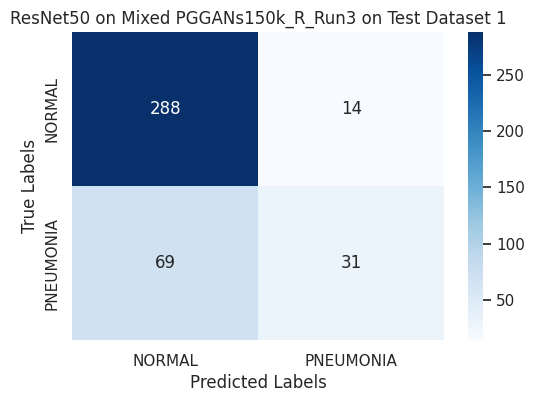

Testing on Dataset 2
13/13 [==============================] - 2s 130ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.4693, 'Test Accuracy': 0.7886, 'F1 Score': 0.76, 'Sensitivity (Recall)': 0.79, 'Precision': 0.77}


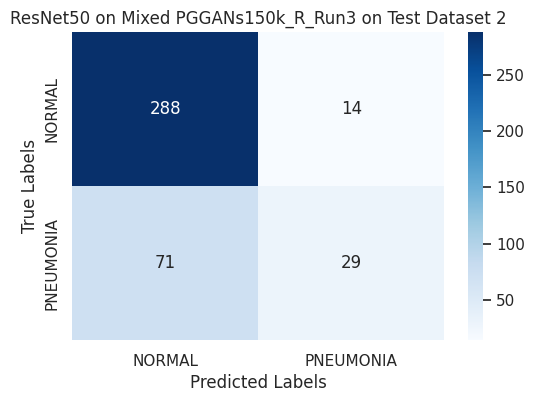

Testing on Dataset 3
13/13 [==============================] - 2s 131ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.482, 'Test Accuracy': 0.7711, 'F1 Score': 0.73, 'Sensitivity (Recall)': 0.77, 'Precision': 0.74}


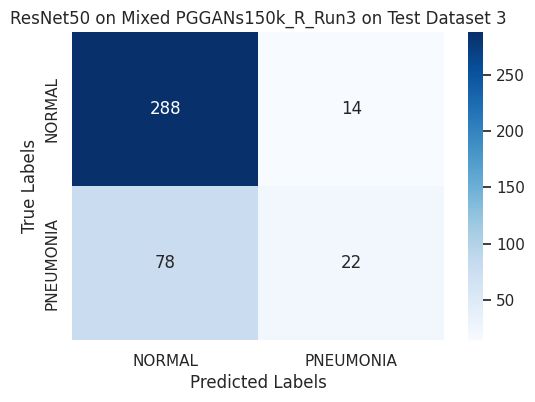

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 25s 234ms/step - loss: 9.2288 - accuracy: 0.8446 - val_loss: 0.1321 - val_accuracy: 0.9635
Epoch 2/10
93/93 [==============================] - 21s 221ms/step - loss: 0.1971 - accuracy: 0.9209 - val_loss: 0.1313 - val_accuracy: 0.9541
Epoch 3/10
93/93 [==============================] - 20s 219ms/step - loss: 0.1975 - accuracy: 0.9166 - val_loss: 0.0762 - val_accuracy: 0.9770
Epoch 4/10
93/93 [==============================] - 21s 222ms/step - loss: 0.1972 - accuracy: 0.9064 - val_loss: 0.0793 - val_accuracy: 0.9757
Epoch 5/10
93/93 [==============================] - 21s 223ms/step - loss: 0.2516 - accuracy: 0.8963 - val_loss: 0.0854 - val_accuracy: 0.9662
Epoch 6/10
93/93 [==============================] - 21s 222ms/step - loss: 0.1941 - accuracy: 0.8875 - val_loss: 0.0758 - val_accuracy: 0.9730
Epoch 7/10
93/93 [==============================] - 20s 220ms/step - loss: 0.2367 - accuracy: 0.8676 - v

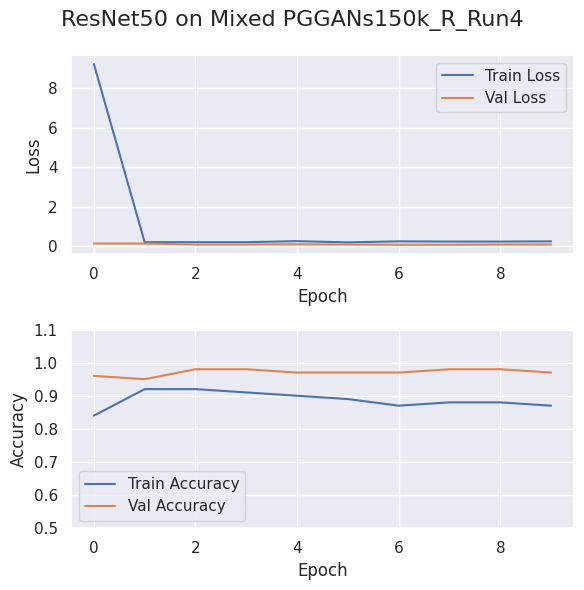

Testing on Dataset 1
13/13 [==============================] - 3s 138ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.3978, 'Test Accuracy': 0.8308, 'F1 Score': 0.8, 'Sensitivity (Recall)': 0.83, 'Precision': 0.85}


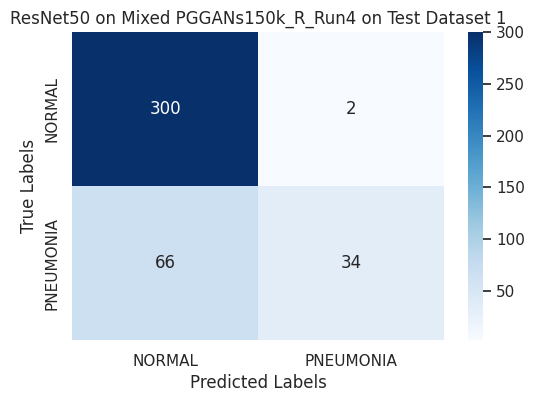

Testing on Dataset 2
13/13 [==============================] - 2s 129ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.3805, 'Test Accuracy': 0.8333, 'F1 Score': 0.8, 'Sensitivity (Recall)': 0.83, 'Precision': 0.85}


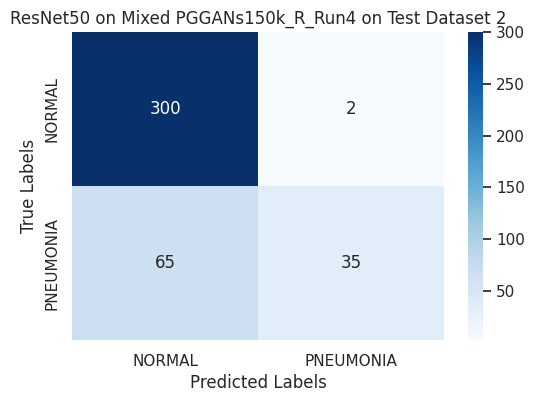

Testing on Dataset 3
13/13 [==============================] - 2s 133ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.4268, 'Test Accuracy': 0.8085, 'F1 Score': 0.76, 'Sensitivity (Recall)': 0.81, 'Precision': 0.83}


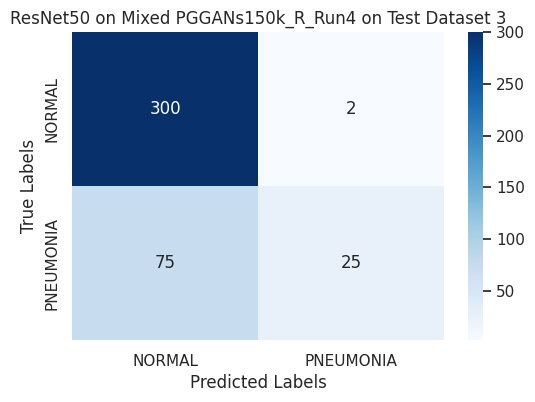

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 24s 226ms/step - loss: 10.6038 - accuracy: 0.8341 - val_loss: 0.1448 - val_accuracy: 0.9473
Epoch 2/10
93/93 [==============================] - 20s 219ms/step - loss: 0.1877 - accuracy: 0.9395 - val_loss: 0.1804 - val_accuracy: 0.9581
Epoch 3/10
93/93 [==============================] - 20s 220ms/step - loss: 0.1382 - accuracy: 0.9554 - val_loss: 0.0834 - val_accuracy: 0.9676
Epoch 4/10
93/93 [==============================] - 20s 221ms/step - loss: 0.1389 - accuracy: 0.9456 - val_loss: 0.0854 - val_accuracy: 0.9635
Epoch 5/10
93/93 [==============================] - 20s 220ms/step - loss: 0.1288 - accuracy: 0.9497 - val_loss: 0.0595 - val_accuracy: 0.9797
Epoch 6/10
93/93 [==============================] - 21s 223ms/step - loss: 0.1408 - accuracy: 0.9443 - val_loss: 0.0688 - val_accuracy: 0.9757
Epoch 7/10
93/93 [==============================] - 21s 224ms/step - loss: 0.1670 - accuracy: 0.8699 - 

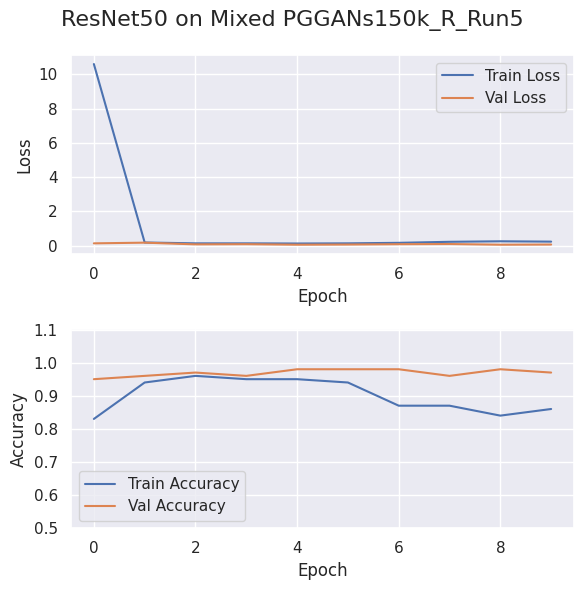

Testing on Dataset 1
13/13 [==============================] - 3s 131ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.3999, 'Test Accuracy': 0.8308, 'F1 Score': 0.8, 'Sensitivity (Recall)': 0.83, 'Precision': 0.84}


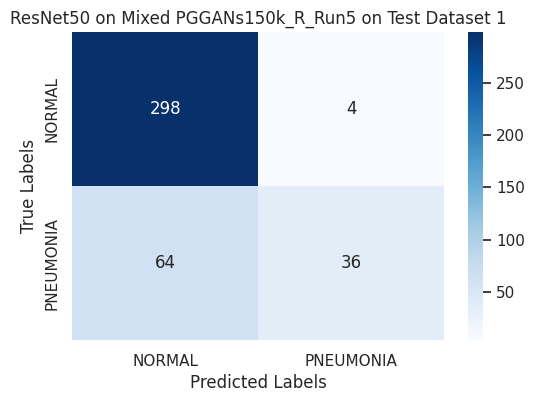

Testing on Dataset 2
13/13 [==============================] - 2s 139ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.4074, 'Test Accuracy': 0.8234, 'F1 Score': 0.79, 'Sensitivity (Recall)': 0.82, 'Precision': 0.84}


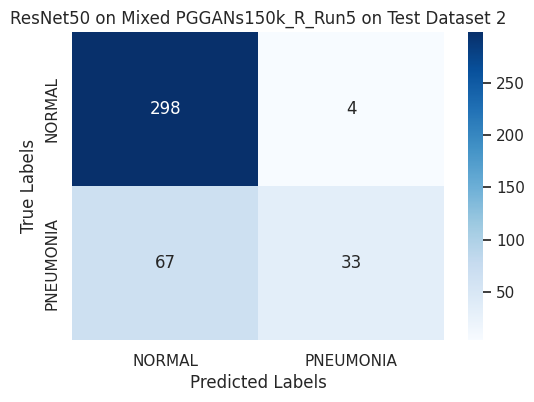

Testing on Dataset 3
13/13 [==============================] - 2s 131ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.4495, 'Test Accuracy': 0.8035, 'F1 Score': 0.76, 'Sensitivity (Recall)': 0.8, 'Precision': 0.81}


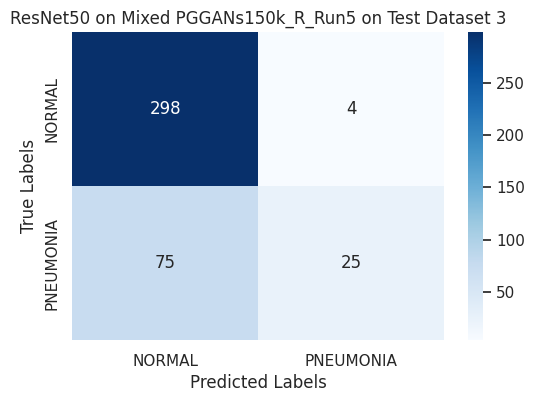

In [14]:
title = "ResNet50 on Mixed PGGANs150k_R"
file_name = "Trained_Models/ResNet50_training_history_plot_Mixed_PGGANs150k_R.png"

for i in range(0, 5):
    trained_model, test_metrics, confusion_matrix = imbalanced_cv_train_and_evaluate_model(
        dataset_dir_pggans150_rand, 
        test_dataset_dir_rand1, 
        test_dataset_dir_rand2, 
        test_dataset_dir_rand3, 
        class_labels,  
        resnet_model, 
        weights=None,
        input_shape= input_shape, 
        title=f"{title}_Run{i+1}", 
        file_name=file_name,  # Now treated as a keyword argument
        cv=cv, 
        epochs=epochs, 
        batch_size=batch_size
    )

#### Train on Mixed PGGANs160k Dataset

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 25s 234ms/step - loss: 13.8906 - accuracy: 0.7946 - val_loss: 1.2593 - val_accuracy: 0.6527
Epoch 2/10
93/93 [==============================] - 21s 221ms/step - loss: 0.2636 - accuracy: 0.9088 - val_loss: 0.1168 - val_accuracy: 0.9608
Epoch 3/10
93/93 [==============================] - 20s 221ms/step - loss: 0.2062 - accuracy: 0.9264 - val_loss: 0.0868 - val_accuracy: 0.9811
Epoch 4/10
93/93 [==============================] - 21s 221ms/step - loss: 0.2175 - accuracy: 0.9003 - val_loss: 0.1168 - val_accuracy: 0.9716
Epoch 5/10
93/93 [==============================] - 21s 222ms/step - loss: 0.2449 - accuracy: 0.8666 - val_loss: 0.1437 - val_accuracy: 0.9608
Epoch 6/10
93/93 [==============================] - 20s 220ms/step - loss: 0.2329 - accuracy: 0.8726 - val_loss: 0.0610 - val_accuracy: 0.9811
Epoch 7/10
93/93 [==============================] - 21s 222ms/step - loss: 0.2443 - accuracy: 0.8557 - 

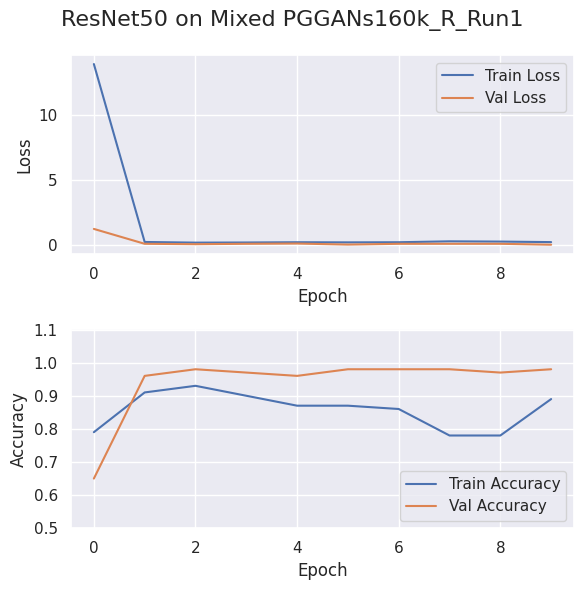

Testing on Dataset 1
13/13 [==============================] - 3s 130ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2288, 'Test Accuracy': 0.903, 'F1 Score': 0.9, 'Sensitivity (Recall)': 0.9, 'Precision': 0.91}


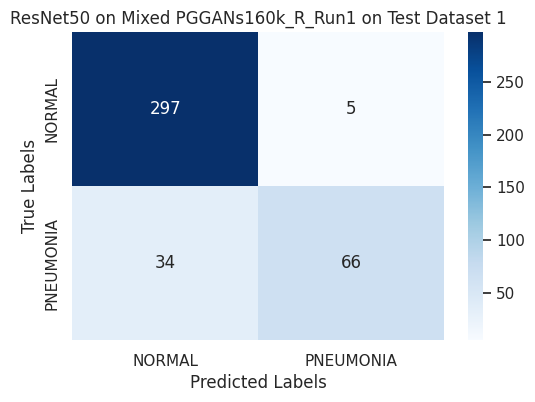

Testing on Dataset 2
13/13 [==============================] - 2s 132ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.2287, 'Test Accuracy': 0.9129, 'F1 Score': 0.91, 'Sensitivity (Recall)': 0.91, 'Precision': 0.91}


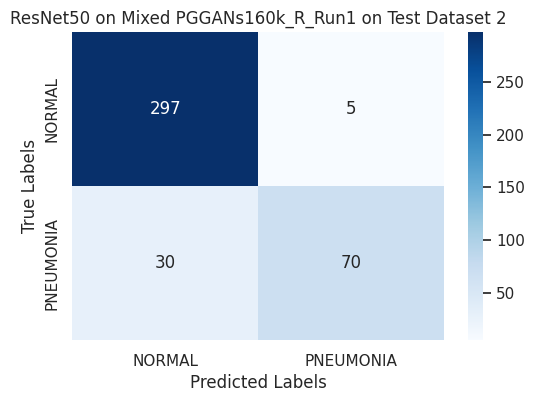

Testing on Dataset 3
13/13 [==============================] - 2s 135ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.2539, 'Test Accuracy': 0.8955, 'F1 Score': 0.89, 'Sensitivity (Recall)': 0.9, 'Precision': 0.9}


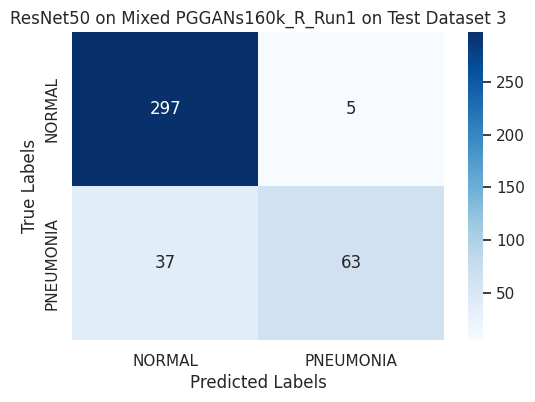

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 25s 234ms/step - loss: 15.6421 - accuracy: 0.8155 - val_loss: 0.2306 - val_accuracy: 0.9500
Epoch 2/10
93/93 [==============================] - 21s 221ms/step - loss: 0.7305 - accuracy: 0.8723 - val_loss: 0.9839 - val_accuracy: 0.7392
Epoch 3/10
93/93 [==============================] - 20s 220ms/step - loss: 0.3124 - accuracy: 0.8892 - val_loss: 0.1566 - val_accuracy: 0.9703
Epoch 4/10
93/93 [==============================] - 20s 220ms/step - loss: 0.2487 - accuracy: 0.8740 - val_loss: 0.0823 - val_accuracy: 0.9770
Epoch 5/10
93/93 [==============================] - 20s 219ms/step - loss: 0.2380 - accuracy: 0.8669 - val_loss: 0.0839 - val_accuracy: 0.9757
Epoch 6/10
93/93 [==============================] - 20s 221ms/step - loss: 0.2473 - accuracy: 0.8696 - val_loss: 0.0845 - val_accuracy: 0.9689
Epoch 7/10
93/93 [==============================] - 20s 218ms/step - loss: 0.2769 - accuracy: 0.8547 - 

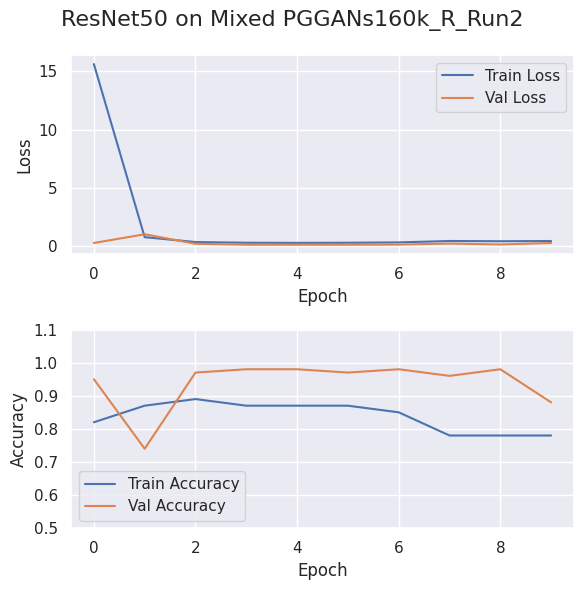

Testing on Dataset 1
13/13 [==============================] - 3s 128ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.4219, 'Test Accuracy': 0.7786, 'F1 Score': 0.79, 'Sensitivity (Recall)': 0.78, 'Precision': 0.88}


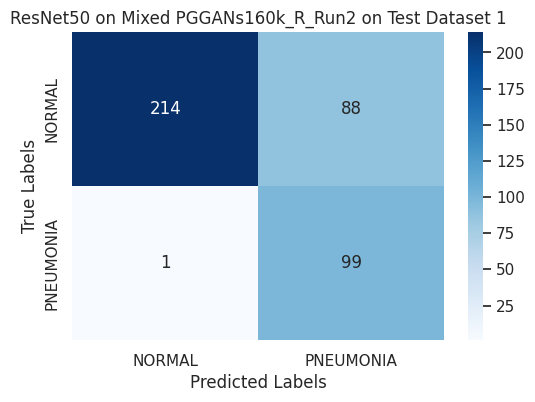

Testing on Dataset 2
13/13 [==============================] - 2s 132ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.4257, 'Test Accuracy': 0.7786, 'F1 Score': 0.79, 'Sensitivity (Recall)': 0.78, 'Precision': 0.88}


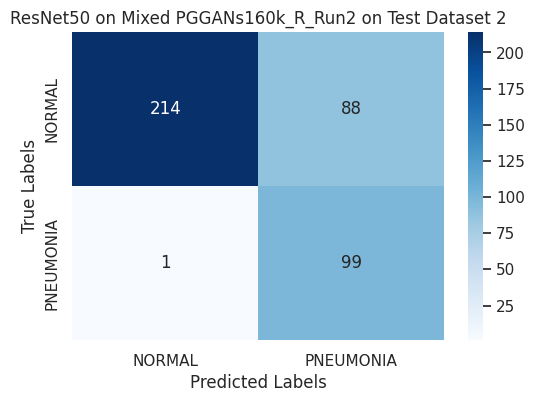

Testing on Dataset 3
13/13 [==============================] - 2s 132ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.429, 'Test Accuracy': 0.7811, 'F1 Score': 0.8, 'Sensitivity (Recall)': 0.78, 'Precision': 0.88}


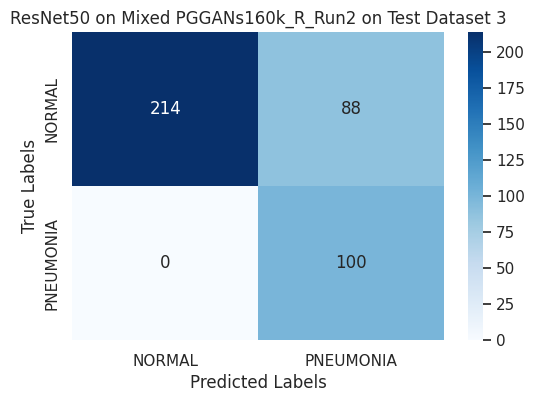

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 25s 234ms/step - loss: 18.1573 - accuracy: 0.8149 - val_loss: 0.1440 - val_accuracy: 0.9500
Epoch 2/10
93/93 [==============================] - 20s 219ms/step - loss: 0.2315 - accuracy: 0.9267 - val_loss: 0.1805 - val_accuracy: 0.9392
Epoch 3/10
93/93 [==============================] - 20s 219ms/step - loss: 0.3128 - accuracy: 0.8922 - val_loss: 0.0853 - val_accuracy: 0.9770
Epoch 4/10
93/93 [==============================] - 21s 221ms/step - loss: 0.2667 - accuracy: 0.8885 - val_loss: 0.0767 - val_accuracy: 0.9797
Epoch 5/10
93/93 [==============================] - 20s 218ms/step - loss: 0.1913 - accuracy: 0.9155 - val_loss: 0.0630 - val_accuracy: 0.9757
Epoch 6/10
93/93 [==============================] - 20s 220ms/step - loss: 0.2140 - accuracy: 0.8821 - val_loss: 0.0693 - val_accuracy: 0.9757
Epoch 7/10
93/93 [==============================] - 20s 217ms/step - loss: 0.3275 - accuracy: 0.8189 - 

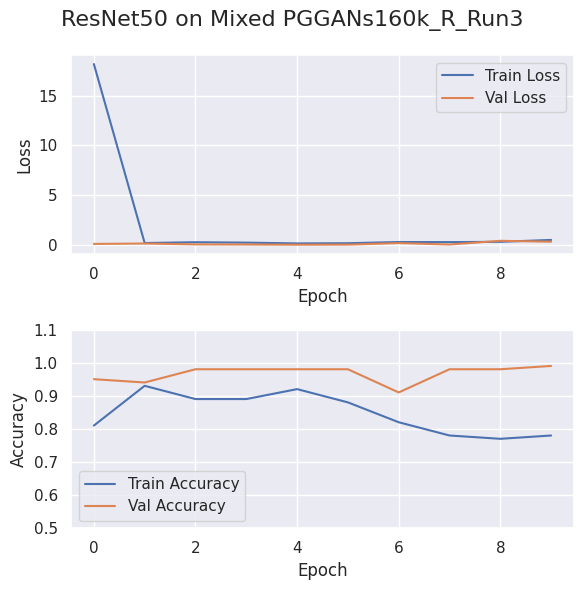

Testing on Dataset 1
13/13 [==============================] - 3s 136ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2705, 'Test Accuracy': 0.898, 'F1 Score': 0.89, 'Sensitivity (Recall)': 0.9, 'Precision': 0.9}


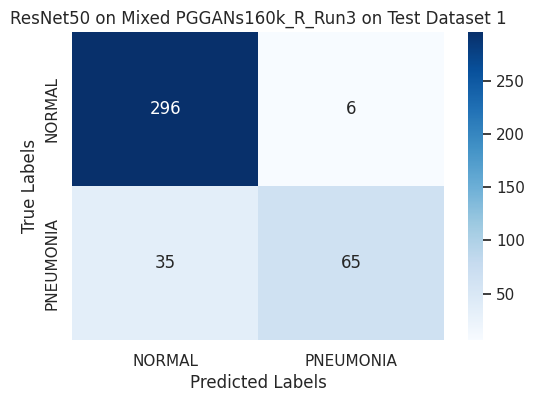

Testing on Dataset 2
13/13 [==============================] - 2s 127ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.2717, 'Test Accuracy': 0.9104, 'F1 Score': 0.91, 'Sensitivity (Recall)': 0.91, 'Precision': 0.91}


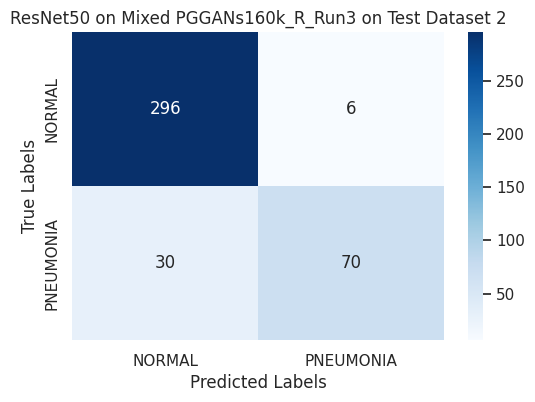

Testing on Dataset 3
13/13 [==============================] - 2s 128ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.2836, 'Test Accuracy': 0.9055, 'F1 Score': 0.9, 'Sensitivity (Recall)': 0.91, 'Precision': 0.91}


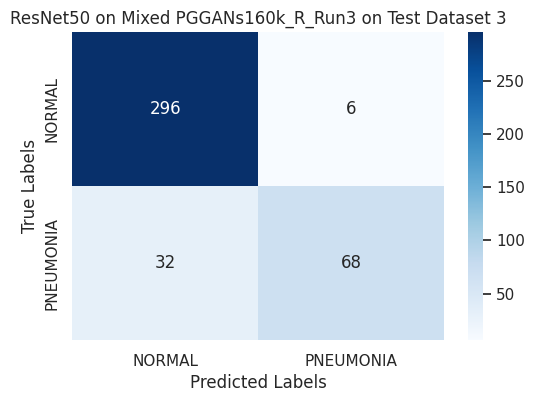

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 25s 233ms/step - loss: 6.2305 - accuracy: 0.8419 - val_loss: 0.1162 - val_accuracy: 0.9527
Epoch 2/10
93/93 [==============================] - 21s 222ms/step - loss: 0.2052 - accuracy: 0.9162 - val_loss: 0.1370 - val_accuracy: 0.9500
Epoch 3/10
93/93 [==============================] - 21s 223ms/step - loss: 0.2283 - accuracy: 0.9149 - val_loss: 0.0848 - val_accuracy: 0.9703
Epoch 4/10
93/93 [==============================] - 21s 223ms/step - loss: 0.1780 - accuracy: 0.9257 - val_loss: 0.0698 - val_accuracy: 0.9770
Epoch 5/10
93/93 [==============================] - 21s 223ms/step - loss: 0.2501 - accuracy: 0.9064 - val_loss: 0.1067 - val_accuracy: 0.9811
Epoch 6/10
93/93 [==============================] - 21s 223ms/step - loss: 0.4447 - accuracy: 0.8412 - val_loss: 0.1913 - val_accuracy: 0.9230
Epoch 7/10
93/93 [==============================] - 21s 223ms/step - loss: 0.3501 - accuracy: 0.8662 - v

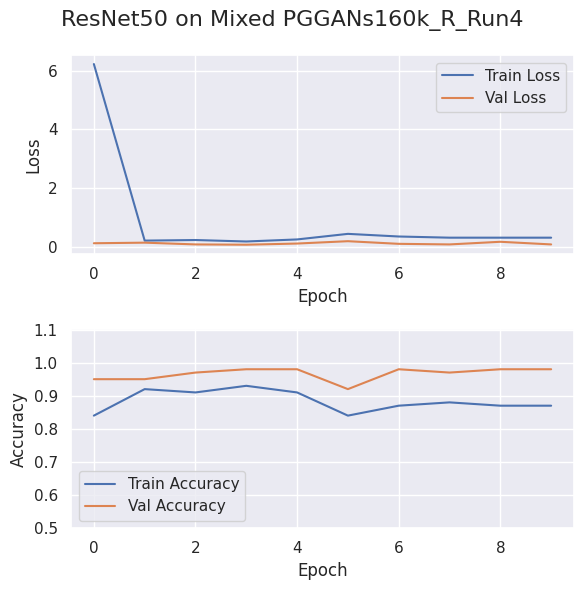

Testing on Dataset 1
13/13 [==============================] - 3s 130ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.2868, 'Test Accuracy': 0.8756, 'F1 Score': 0.86, 'Sensitivity (Recall)': 0.88, 'Precision': 0.89}


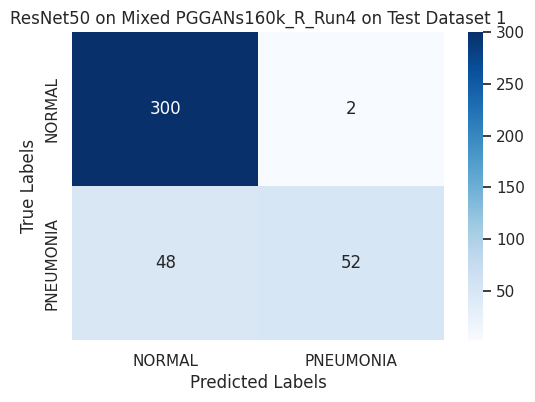

Testing on Dataset 2
13/13 [==============================] - 2s 130ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.2983, 'Test Accuracy': 0.8781, 'F1 Score': 0.86, 'Sensitivity (Recall)': 0.88, 'Precision': 0.89}


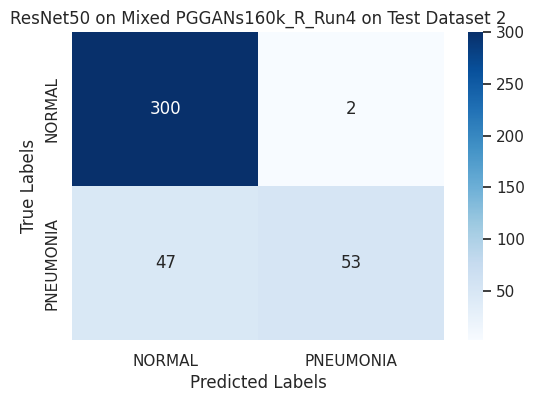

Testing on Dataset 3
13/13 [==============================] - 2s 128ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.3255, 'Test Accuracy': 0.8632, 'F1 Score': 0.85, 'Sensitivity (Recall)': 0.86, 'Precision': 0.88}


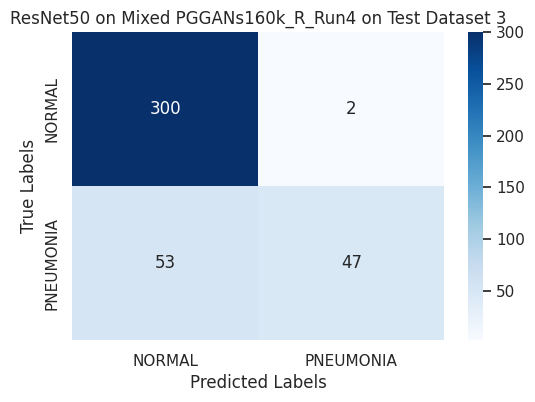

Class labels: ['NORMAL', 'PNEUMONIA']
Epoch 1/10
93/93 [==============================] - 24s 229ms/step - loss: 14.8126 - accuracy: 0.7750 - val_loss: 0.1820 - val_accuracy: 0.9514
Epoch 2/10
93/93 [==============================] - 20s 218ms/step - loss: 0.2319 - accuracy: 0.8932 - val_loss: 0.2284 - val_accuracy: 0.8730
Epoch 3/10
93/93 [==============================] - 20s 221ms/step - loss: 0.2178 - accuracy: 0.8993 - val_loss: 0.1505 - val_accuracy: 0.9716
Epoch 4/10
93/93 [==============================] - 20s 220ms/step - loss: 0.3032 - accuracy: 0.8439 - val_loss: 0.2026 - val_accuracy: 0.9608
Epoch 5/10
93/93 [==============================] - 20s 219ms/step - loss: 0.2691 - accuracy: 0.9010 - val_loss: 0.1798 - val_accuracy: 0.9649
Epoch 6/10
93/93 [==============================] - 20s 219ms/step - loss: 0.2821 - accuracy: 0.8821 - val_loss: 0.1057 - val_accuracy: 0.9649
Epoch 7/10
93/93 [==============================] - 21s 223ms/step - loss: 0.4326 - accuracy: 0.8385 - 

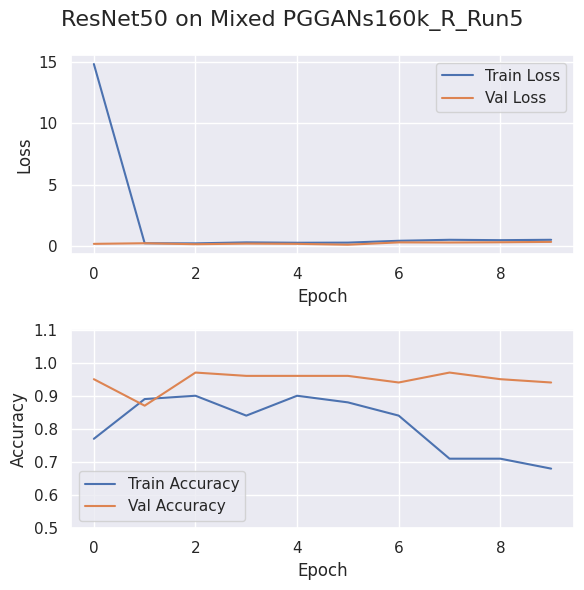

Testing on Dataset 1
13/13 [==============================] - 3s 132ms/step
Test Metrics for Dataset 1: {'Test Loss': 0.5848, 'Test Accuracy': 0.8259, 'F1 Score': 0.79, 'Sensitivity (Recall)': 0.83, 'Precision': 0.85}


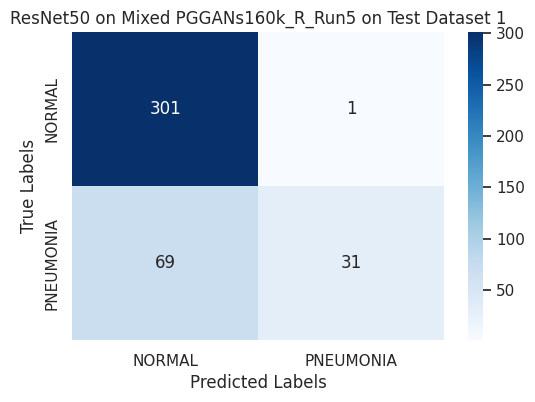

Testing on Dataset 2
13/13 [==============================] - 2s 132ms/step
Test Metrics for Dataset 2: {'Test Loss': 0.5895, 'Test Accuracy': 0.8209, 'F1 Score': 0.78, 'Sensitivity (Recall)': 0.82, 'Precision': 0.85}


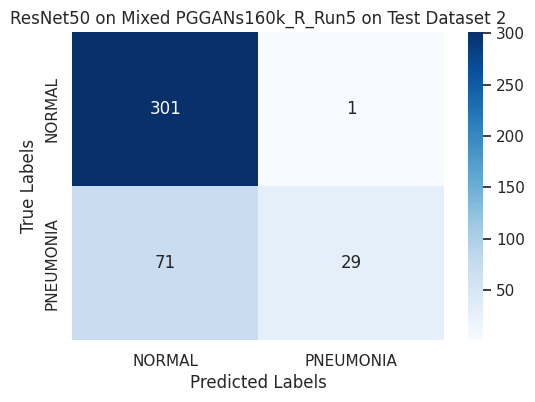

Testing on Dataset 3
13/13 [==============================] - 2s 135ms/step
Test Metrics for Dataset 3: {'Test Loss': 0.5963, 'Test Accuracy': 0.8109, 'F1 Score': 0.77, 'Sensitivity (Recall)': 0.81, 'Precision': 0.84}


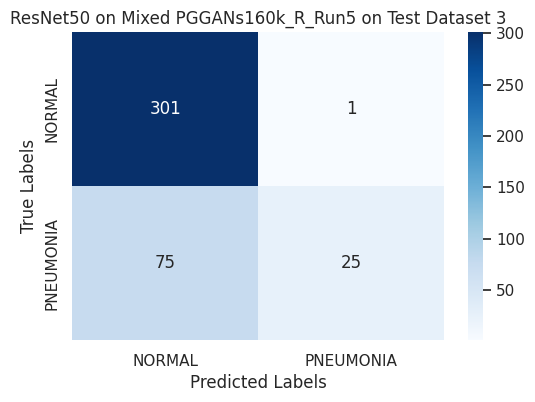

In [15]:
title = "ResNet50 on Mixed PGGANs160k_R" 
file_name = "Trained_Models/ResNet50_training_history_plot_Mixed_PGGANs160k_R.png"

for i in range(0, 5):
    trained_model, test_metrics, confusion_matrix = imbalanced_cv_train_and_evaluate_model(
        dataset_dir_pggans160_rand, 
        test_dataset_dir_rand1, 
        test_dataset_dir_rand2, 
        test_dataset_dir_rand3, 
        class_labels,  
        resnet_model, 
        weights=None,
        input_shape= input_shape, 
        title=f"{title}_Run{i+1}", 
        file_name=file_name,  # Now treated as a keyword argument
        cv=cv, 
        epochs=epochs, 
        batch_size=batch_size
    )
